In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import warnings
warnings.filterwarnings('ignore')
from scipy import stats
%matplotlib inline
import io 
from numpy import array
from numpy import hstack
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from statsmodels.tools.eval_measures import mse,rmse,meanabs
import statsmodels.api as sm
import matplotlib.pyplot as plt
import datetime
#from tsmoothie.utils_func import sim_randomwalk
#from tsmoothie.smoother import *
import seaborn as sns
#import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap
from windrose import WindroseAxes
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [ ]:
%matplotlib inline

In [ ]:
# pip install windrose

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
df=pd.read_csv('gdrive/My Drive/Colab Notebooks/Industrial/Mildred Lake.csv',index_col='Date', encoding = 'unicode_escape',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df_we=pd.read_csv('gdrive/My Drive/Colab Notebooks/Industrial/MILDLAKE_WEATHER.csv',index_col='ï»¿Date', encoding = 'unicode_escape',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df_we.index.name = 'Date'
df_we = df_we.loc[:'2021-03-31 23:00:00']

In [ ]:
df_we

,Air Temp. Inst. (Â°C),Humidity Inst. (%),Humidity Avg. (%),Incoming Solar Rad. (W/m2),Precip. Accumulated (mm),Precip. (mm),Snow Depth (cm),Wind Speed 10 m Syno. (km/h),Wind Dir. 10 m Syno. (Â°),Wind Speed 10 m Avg. (km/h),Wind Dir. 10 m Avg. (Â°)
Date,,,,,,,,,,,
2012-01-01 00:00:00,-11.0,77.9,NaN,0.0,0.0,0.0,NaN,32.8,271.0,NaN,NaN
2012-01-01 01:00:00,-12.2,78.4,NaN,0.0,0.0,0.0,NaN,24.5,264.9,NaN,NaN
2012-01-01 02:00:00,-12.9,78.0,NaN,0.0,0.0,0.0,NaN,18.1,270.6,NaN,NaN
2012-01-01 03:00:00,-12.2,78.0,NaN,0.0,0.0,0.0,NaN,29.8,258.6,NaN,NaN
2012-01-01 04:00:00,-13.1,77.1,NaN,0.0,0.0,0.0,NaN,27.5,268.6,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,6.4,49.0,51.0,34.5,9.9,0.0,4.0,4.4,212.0,5.9,216.0
2021-03-31 20:00:00,4.6,55.0,52.0,0.0,9.9,0.0,4.0,5.2,199.0,5.3,206.0
2021-03-31 21:00:00,3.2,59.0,57.0,0.0,9.9,0.0,4.0,5.7,223.0,7.0,214.0


In [ ]:
df1 = df.copy()
df1['SO2 (ppm)']=df1['SO2 (ppm)']*1000
df1['H2S (ppm)']=df1['H2S (ppm)']*1000
df1=df1.loc[:'2021-03-31']
df1

,SO2 (ppb),SO2 (ppm),H2S (ppb),H2S (ppm),CH4 (ppm),NMHC (ppm),T ( C),RH (%),RH (%) 2m,Std. Dev. of Wind Direction,Std. Dev. of Wind Direction.1,Std. Dev. of Wind Speed,Std. Dev. of Wind Speed.1,THC (ppm),THC (ppm).1,THC (ppm).2,Wind Direction,Wind Direction.1,Wind Speed,Wind Speed.1
Date,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,NaN,39.0,NaN,3.0,NaN,NaN,-9.6,NaN,NaN,19.7,NaN,NaN,5.7,NaN,NaN,2.6,268.0,NaN,NaN,17.5
2012-01-01 01:00:00,NaN,NaN,NaN,1.0,NaN,NaN,-11.1,NaN,NaN,22.1,NaN,NaN,3.5,NaN,NaN,NaN,245.0,NaN,NaN,11.6
2012-01-01 02:00:00,NaN,9.0,NaN,NaN,NaN,NaN,-10.7,NaN,NaN,21.9,NaN,NaN,4.2,NaN,NaN,3.2,257.0,NaN,NaN,12.3
2012-01-01 03:00:00,NaN,11.0,NaN,2.0,NaN,NaN,-10.7,NaN,NaN,20.4,NaN,NaN,4.9,NaN,NaN,2.8,267.0,NaN,NaN,16.4
2012-01-01 04:00:00,NaN,7.0,NaN,1.0,NaN,NaN,-12.1,NaN,NaN,61.1,NaN,NaN,3.9,NaN,NaN,2.9,246.0,NaN,NaN,5.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,0.1,NaN,0.1,NaN,2.1,0.0,4.2,59.6,NaN,NaN,42.2,1.4,NaN,NaN,2.1,NaN,NaN,188.6,3.1,NaN
2021-03-31 20:00:00,0.4,NaN,0.1,NaN,2.0,0.0,3.0,64.7,NaN,NaN,24.1,2.2,NaN,NaN,2.0,NaN,NaN,203.1,7.4,NaN
2021-03-31 21:00:00,0.3,NaN,0.0,NaN,2.0,0.0,4.4,54.5,NaN,NaN,26.4,3.0,NaN,NaN,2.0,NaN,NaN,226.4,9.0,NaN


In [ ]:
df1.index

DatetimeIndex(['2012-01-01 00:00:00', '2012-01-01 01:00:00',
               '2012-01-01 02:00:00', '2012-01-01 03:00:00',
               '2012-01-01 04:00:00', '2012-01-01 05:00:00',
               '2012-01-01 06:00:00', '2012-01-01 07:00:00',
               '2012-01-01 08:00:00', '2012-01-01 09:00:00',
               ...
               '2021-03-31 14:00:00', '2021-03-31 15:00:00',
               '2021-03-31 16:00:00', '2021-03-31 17:00:00',
               '2021-03-31 18:00:00', '2021-03-31 19:00:00',
               '2021-03-31 20:00:00', '2021-03-31 21:00:00',
               '2021-03-31 22:00:00', '2021-03-31 23:00:00'],
              dtype='datetime64[ns]', name='Date', length=81072, freq=None)

In [ ]:
df1.columns

Index(['SO2 (ppb)', 'SO2 (ppm)', 'H2S (ppb)', 'H2S (ppm)', 'CH4 (ppm)',
       'NMHC (ppm)', 'T ( C)', 'RH (%)', 'RH (%) 2m',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Direction.1',
       'Std. Dev. of Wind Speed', 'Std. Dev. of Wind Speed.1', 'THC (ppm)',
       'THC (ppm).1', 'THC (ppm).2', 'Wind Direction', 'Wind Direction.1',
       'Wind Speed', 'Wind Speed.1'],
      dtype='object')

In [ ]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

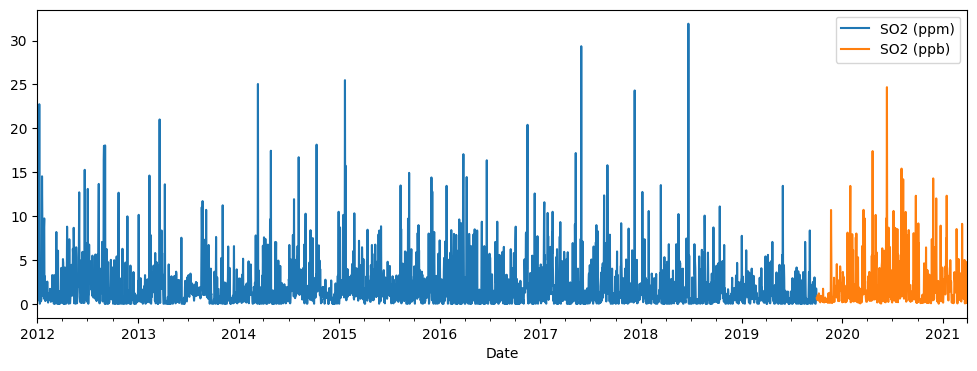

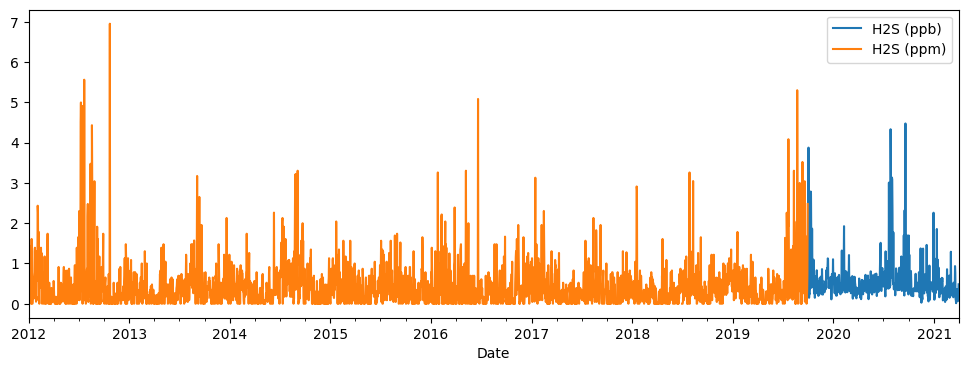

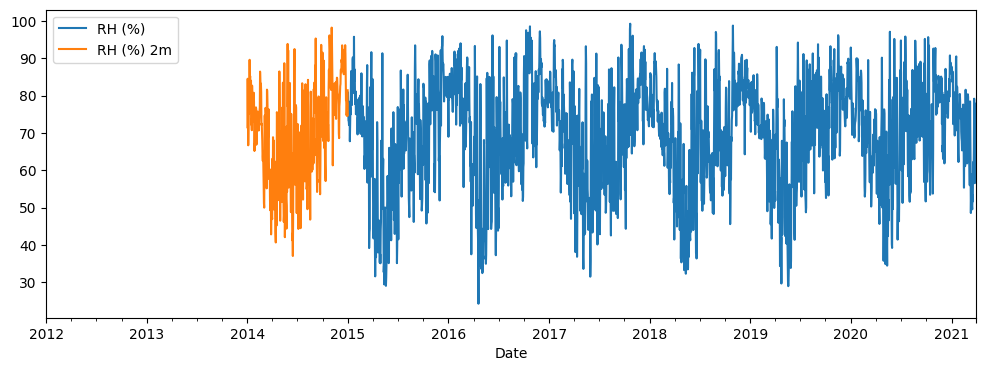

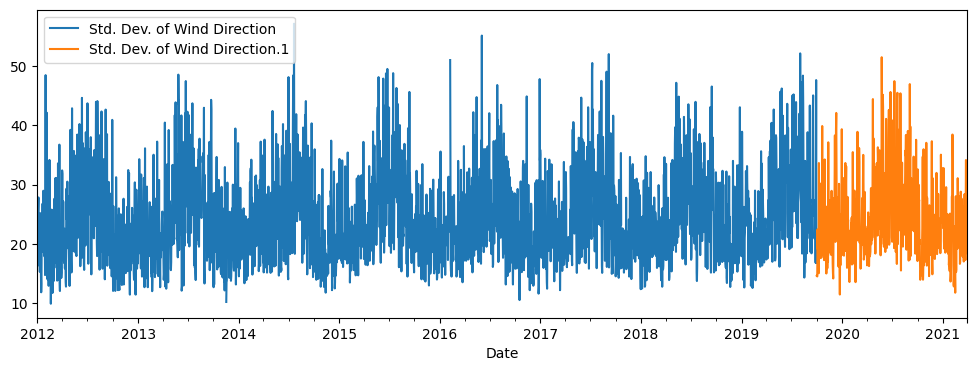

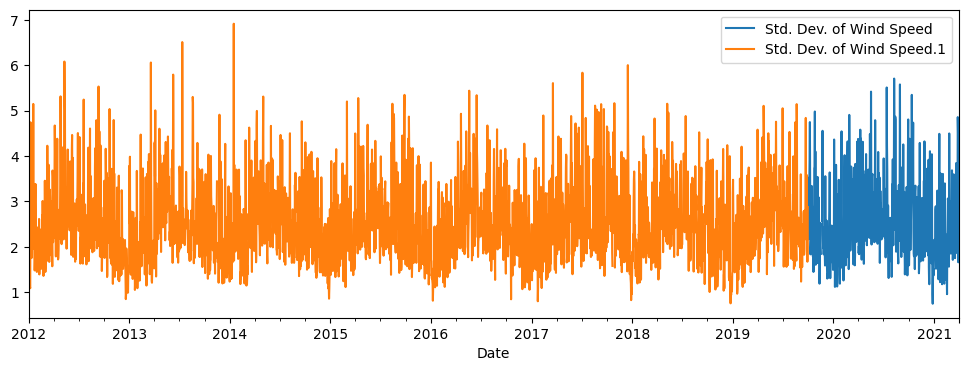

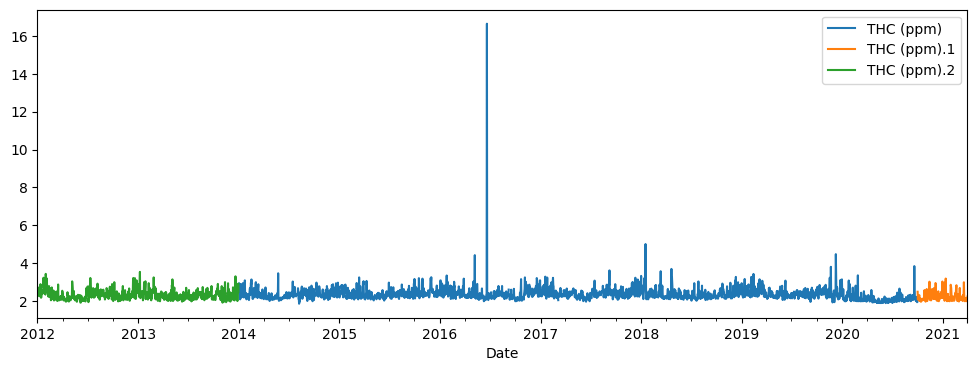

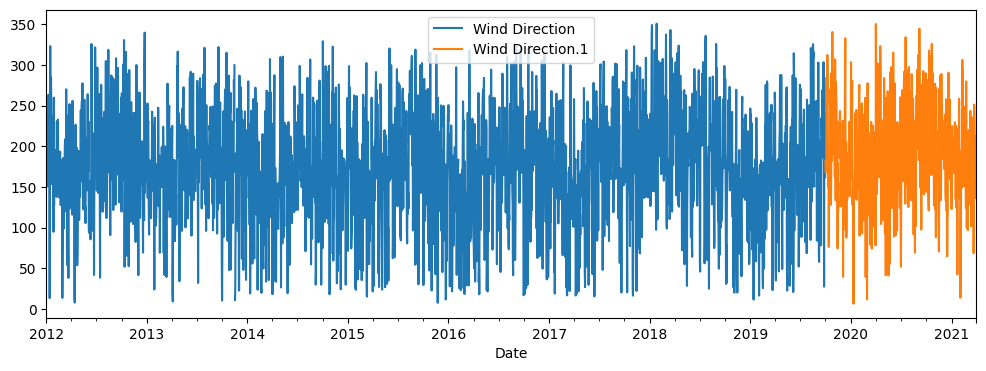

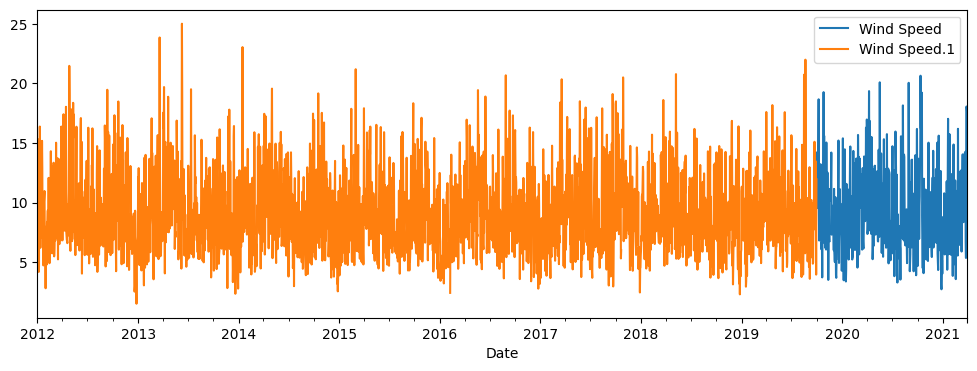

In [ ]:
M = 'D'
df1[['SO2 (ppm)', 'SO2 (ppb)']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[['H2S (ppb)', 'H2S (ppm)']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[[ 'RH (%)', 'RH (%) 2m']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[['Std. Dev. of Wind Direction', 'Std. Dev. of Wind Direction.1']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[['Std. Dev. of Wind Speed', 'Std. Dev. of Wind Speed.1']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[[ 'THC (ppm)','THC (ppm).1', 'THC (ppm).2']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[['Wind Direction', 'Wind Direction.1']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()
df1[[ 'Wind Speed', 'Wind Speed.1']].resample(M).mean().plot(figsize = (12,4) , legend = True)
plt.show()

In [ ]:
df1.columns

Index(['SO2 (ppb)', 'SO2 (ppm)', 'H2S (ppb)', 'H2S (ppm)', 'CH4 (ppm)',
       'NMHC (ppm)', 'T ( C)', 'RH (%)', 'RH (%) 2m',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Direction.1',
       'Std. Dev. of Wind Speed', 'Std. Dev. of Wind Speed.1', 'THC (ppm)',
       'THC (ppm).1', 'THC (ppm).2', 'Wind Direction', 'Wind Direction.1',
       'Wind Speed', 'Wind Speed.1'],
      dtype='object')

In [ ]:
df1[ 'SO2 (ppb)'].fillna(df1[ 'SO2 (ppm)'], inplace=True)
df1[ 'H2S (ppb)'].fillna(df1[ 'H2S (ppm)'], inplace=True)
df1[ 'RH (%)'].fillna(df1['RH (%) 2m'], inplace=True)
df1[ 'Std. Dev. of Wind Direction'].fillna(df1 ['Std. Dev. of Wind Direction.1'], inplace=True)
df1['Std. Dev. of Wind Speed'].fillna(df1['Std. Dev. of Wind Speed.1'], inplace=True)
df1['THC (ppm)'].fillna(df1 ['THC (ppm).1'], inplace=True)
df1['THC (ppm)'].fillna(df1 [ 'THC (ppm).2'], inplace=True)
df1['Wind Direction'].fillna(df1 ['Wind Direction.1'], inplace=True)
df1[ 'Wind Speed'].fillna(df1 [ 'Wind Speed.1'], inplace=True)
df1.drop(columns = [ 'SO2 (ppm)',  'H2S (ppm)', 
      'RH (%) 2m', 'Std. Dev. of Wind Direction.1', 'Std. Dev. of Wind Speed.1',
       'THC (ppm).1', 'THC (ppm).2','Wind Direction.1', 'Wind Speed.1'], inplace = True)

In [ ]:
df1.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'CH4 (ppm)', 'NMHC (ppm)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed'],
      dtype='object')

In [ ]:
df1.drop(columns = [ 'CH4 (ppm)', 'NMHC (ppm)'], inplace = True)

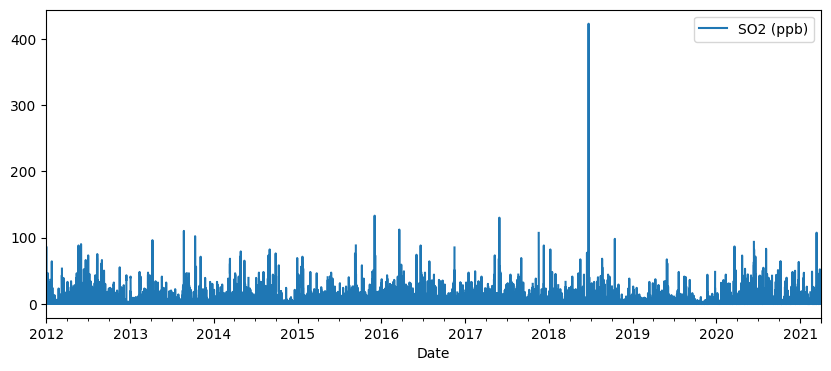

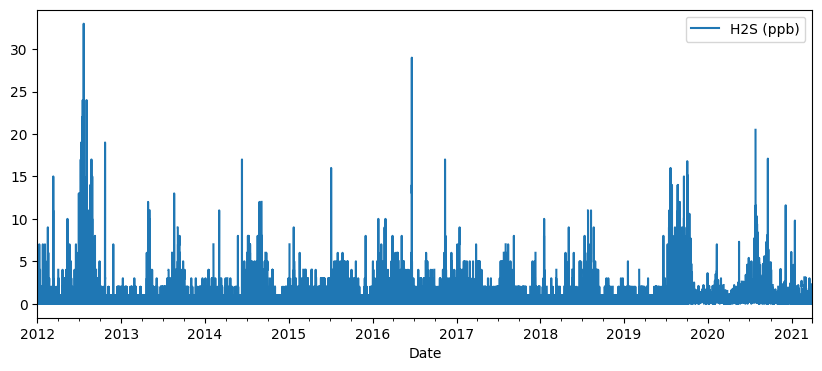

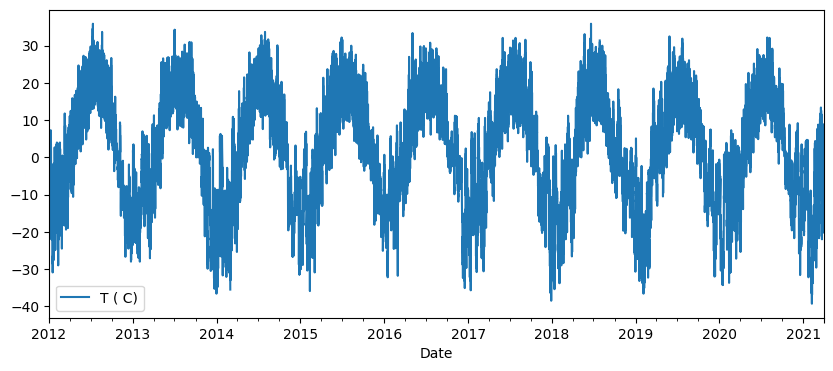

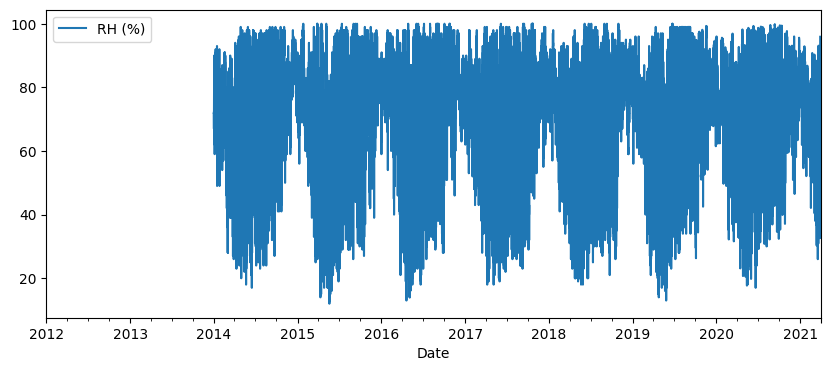

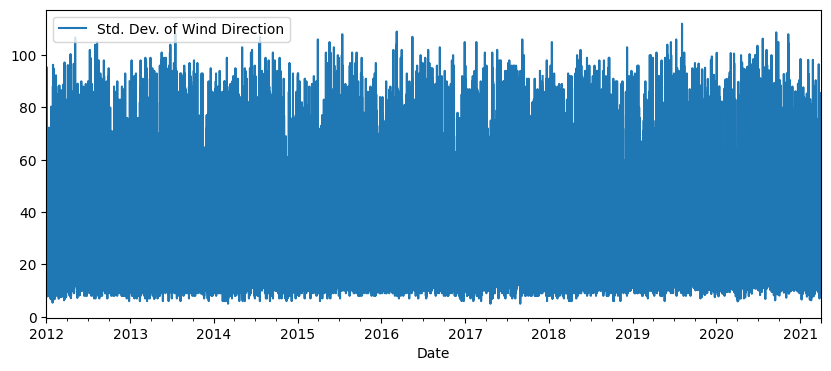

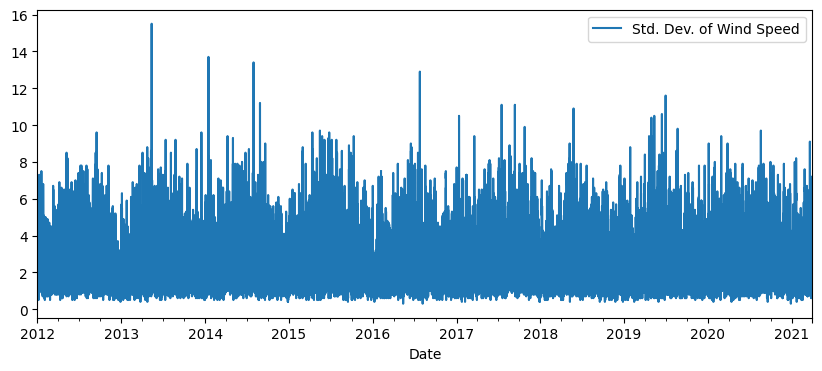

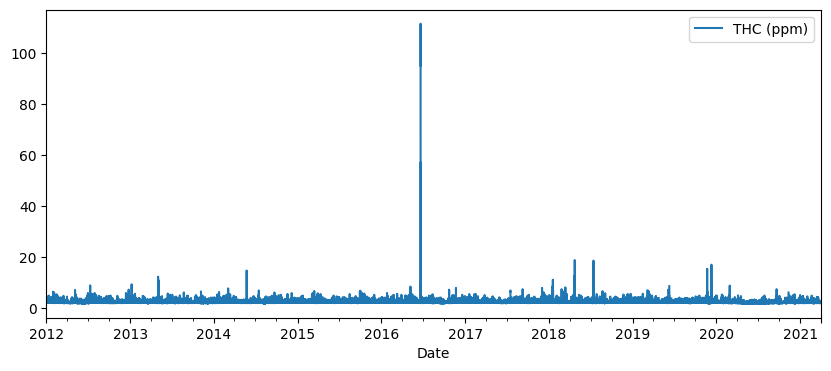

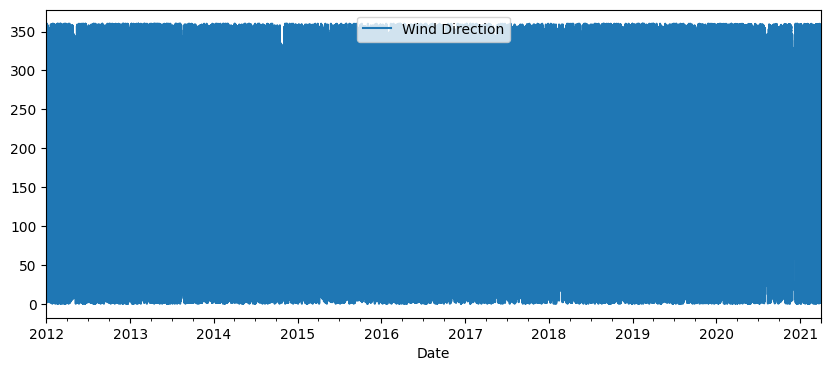

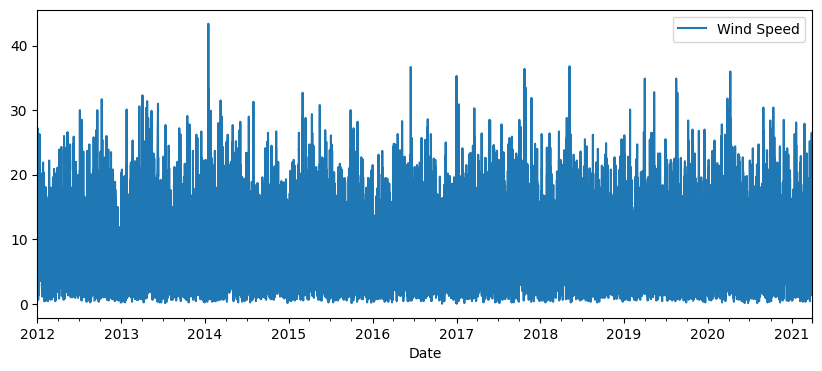

In [ ]:
for i in df1.columns:
  df1[i].plot(legend = True, figsize = (10,4))
  plt.show()

In [ ]:
df1_manix=pd.read_csv('gdrive/My Drive/Colab Notebooks/Industrial/Mannix_Corrected.csv',index_col='Date',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df1

,SO2 (ppb),H2S (ppb),T ( C),RH (%),Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,THC (ppm),Wind Direction,Wind Speed
Date,,,,,,,,,
2012-01-01 00:00:00,39.0,3.0,-9.6,NaN,19.7,5.7,2.6,268.0,17.5
2012-01-01 01:00:00,NaN,1.0,-11.1,NaN,22.1,3.5,NaN,245.0,11.6
2012-01-01 02:00:00,9.0,NaN,-10.7,NaN,21.9,4.2,3.2,257.0,12.3
2012-01-01 03:00:00,11.0,2.0,-10.7,NaN,20.4,4.9,2.8,267.0,16.4
2012-01-01 04:00:00,7.0,1.0,-12.1,NaN,61.1,3.9,2.9,246.0,5.9
...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,0.1,0.1,4.2,59.6,42.2,1.4,2.1,188.6,3.1
2021-03-31 20:00:00,0.4,0.1,3.0,64.7,24.1,2.2,2.0,203.1,7.4
2021-03-31 21:00:00,0.3,0.0,4.4,54.5,26.4,3.0,2.0,226.4,9.0


In [ ]:
df1_manix

,T ( C) 45m,RH (%) 45m,Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,SO2 (ppb),THC (ppm),Wind Direction,Wind Speed,hol,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,
2012-09-01 00:00:00,14.7,67.0,17.0,1.7,0.0,2.5,121.0,5.2,0,0,5,245,12.666667
2012-09-01 01:00:00,13.5,72.0,9.0,1.3,0.5,2.5,111.0,5.3,0,1,5,245,12.666781
2012-09-01 02:00:00,12.8,76.0,12.0,1.9,1.0,2.5,104.0,6.5,0,2,5,245,12.666894
2012-09-01 03:00:00,12.9,75.0,24.0,2.5,1.0,2.5,111.0,4.6,0,3,5,245,12.667008
2012-09-01 04:00:00,12.7,74.0,81.0,0.9,1.0,2.5,178.0,0.3,0,4,5,245,12.667122
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,8.7,39.4,11.5,1.4,0.0,1.9,198.8,8.8,0,19,2,90,21.245332
2021-03-31 20:00:00,7.4,40.3,14.5,2.8,0.0,1.9,211.4,13.8,0,20,2,90,21.245446
2021-03-31 21:00:00,6.4,40.3,9.2,3.0,0.0,1.9,222.0,15.4,0,21,2,90,21.245560


In [ ]:
df1_manix.columns

Index(['T ( C) 45m', 'RH (%) 45m', 'Std. Dev. of Wind Direction',
       'Std. Dev. of Wind Speed', 'SO2 (ppb)', 'THC (ppm)', 'Wind Direction',
       'Wind Speed', 'hol', 'hour', 'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

In [ ]:
df1.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed'],
      dtype='object')

In [ ]:
df1['RH2'] = df1_manix[ 'RH (%) 45m']

In [ ]:
df1.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed', 'RH2'],
      dtype='object')

In [ ]:
df2 = pd.concat([df1, df_we], axis=1)
df2

,SO2 (ppb),H2S (ppb),T ( C),RH (%),Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,THC (ppm),Wind Direction,Wind Speed,RH2,Air Temp. Inst. (Â°C),Humidity Inst. (%),Humidity Avg. (%),Incoming Solar Rad. (W/m2),Precip. Accumulated (mm),Precip. (mm),Snow Depth (cm),Wind Speed 10 m Syno. (km/h),Wind Dir. 10 m Syno. (Â°),Wind Speed 10 m Avg. (km/h),Wind Dir. 10 m Avg. (Â°)
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,39.0,3.0,-9.6,NaN,19.7,5.7,2.6,268.0,17.5,NaN,-11.0,77.9,NaN,0.0,0.0,0.0,NaN,32.8,271.0,NaN,NaN
2012-01-01 01:00:00,NaN,1.0,-11.1,NaN,22.1,3.5,NaN,245.0,11.6,NaN,-12.2,78.4,NaN,0.0,0.0,0.0,NaN,24.5,264.9,NaN,NaN
2012-01-01 02:00:00,9.0,NaN,-10.7,NaN,21.9,4.2,3.2,257.0,12.3,NaN,-12.9,78.0,NaN,0.0,0.0,0.0,NaN,18.1,270.6,NaN,NaN
2012-01-01 03:00:00,11.0,2.0,-10.7,NaN,20.4,4.9,2.8,267.0,16.4,NaN,-12.2,78.0,NaN,0.0,0.0,0.0,NaN,29.8,258.6,NaN,NaN
2012-01-01 04:00:00,7.0,1.0,-12.1,NaN,61.1,3.9,2.9,246.0,5.9,NaN,-13.1,77.1,NaN,0.0,0.0,0.0,NaN,27.5,268.6,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,0.1,0.1,4.2,59.6,42.2,1.4,2.1,188.6,3.1,39.4,6.4,49.0,51.0,34.5,9.9,0.0,4.0,4.4,212.0,5.9,216.0
2021-03-31 20:00:00,0.4,0.1,3.0,64.7,24.1,2.2,2.0,203.1,7.4,40.3,4.6,55.0,52.0,0.0,9.9,0.0,4.0,5.2,199.0,5.3,206.0
2021-03-31 21:00:00,0.3,0.0,4.4,54.5,26.4,3.0,2.0,226.4,9.0,40.3,3.2,59.0,57.0,0.0,9.9,0.0,4.0,5.7,223.0,7.0,214.0


In [ ]:
corr = df2.corr()
mask = np.zeros(corr.shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(100,100))   
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True , ax = ax,annot=True,
    # mask = mask
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);
plt.show()

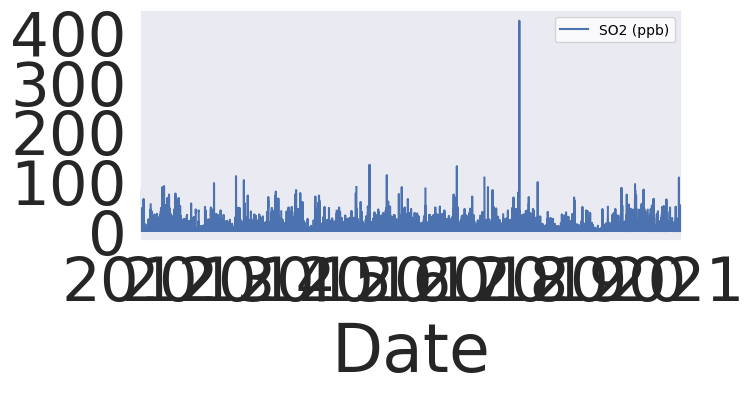

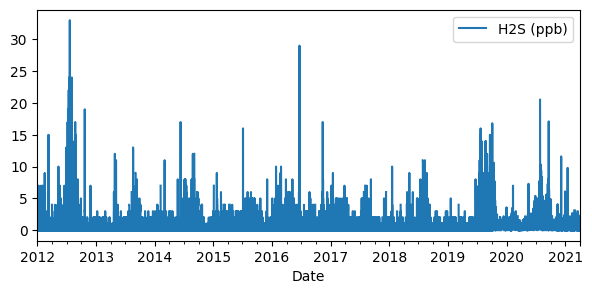

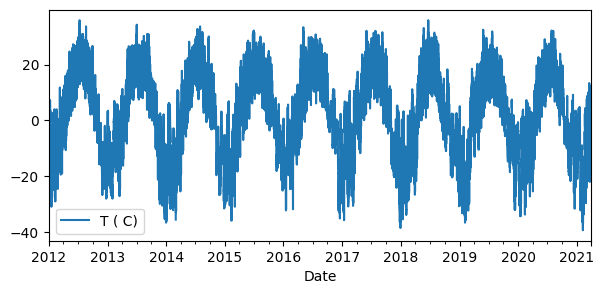

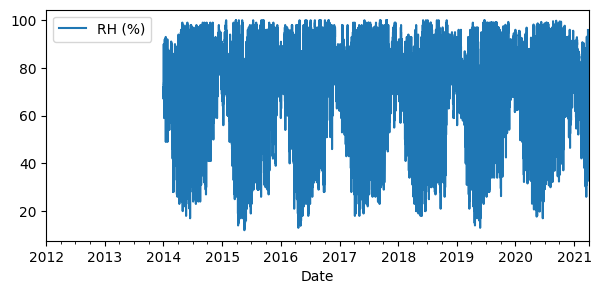

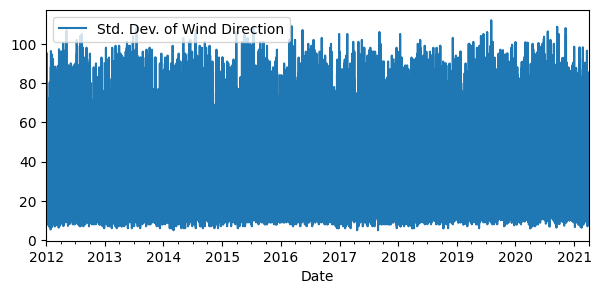

...

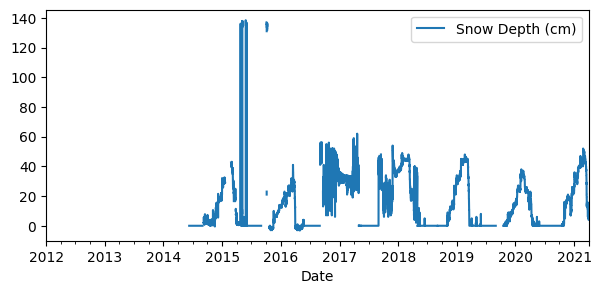

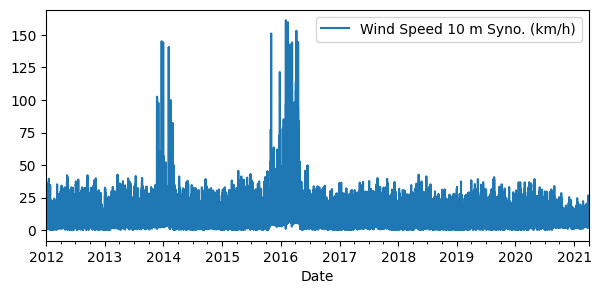

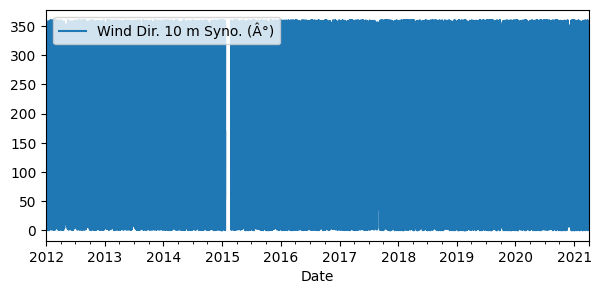

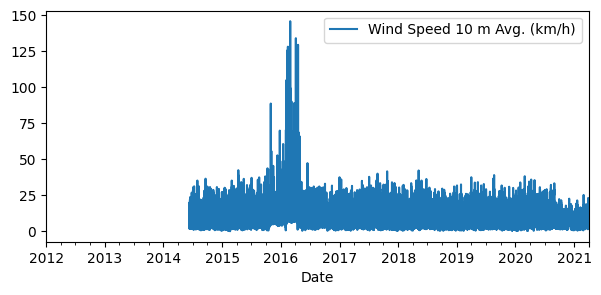

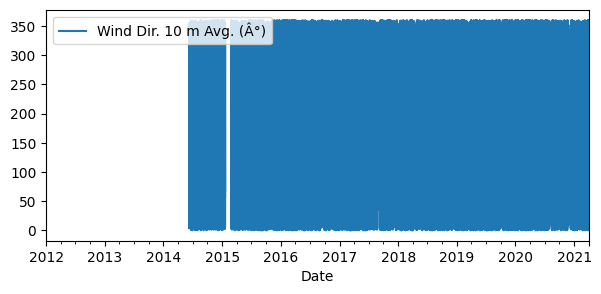

In [ ]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
for i in df2.columns:
  df2[i].plot(figsize = (7,3) , legend = True)
  plt.show()

#RH, RH2


In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed', 'RH2', 'Air Temp. Inst. (Â°C)',
       'Humidity Inst. (%)', 'Humidity Avg. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'Snow Depth (cm)',
       'Wind Speed 10 m Syno. (km/h)', 'Wind Dir. 10 m Syno. (Â°)',
       'Wind Speed 10 m Avg. (km/h)', 'Wind Dir. 10 m Avg. (Â°)'],
      dtype='object')

In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed', 'RH2', 'Air Temp. Inst. (Â°C)',
       'Humidity Inst. (%)', 'Humidity Avg. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'Snow Depth (cm)',
       'Wind Speed 10 m Syno. (km/h)', 'Wind Dir. 10 m Syno. (Â°)',
       'Wind Speed 10 m Avg. (km/h)', 'Wind Dir. 10 m Avg. (Â°)'],
      dtype='object')

In [ ]:
df2.index

DatetimeIndex(['2012-01-01 00:00:00', '2012-01-01 01:00:00',
               '2012-01-01 02:00:00', '2012-01-01 03:00:00',
               '2012-01-01 04:00:00', '2012-01-01 05:00:00',
               '2012-01-01 06:00:00', '2012-01-01 07:00:00',
               '2012-01-01 08:00:00', '2012-01-01 09:00:00',
               ...
               '2021-03-31 14:00:00', '2021-03-31 15:00:00',
               '2021-03-31 16:00:00', '2021-03-31 17:00:00',
               '2021-03-31 18:00:00', '2021-03-31 19:00:00',
               '2021-03-31 20:00:00', '2021-03-31 21:00:00',
               '2021-03-31 22:00:00', '2021-03-31 23:00:00'],
              dtype='datetime64[ns]', name='Date', length=81072, freq='H')

In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'RH (%)',
       'Std. Dev. of Wind Direction', 'Std. Dev. of Wind Speed', 'THC (ppm)',
       'Wind Direction', 'Wind Speed', 'RH2', 'Air Temp. Inst. (Â°C)',
       'Humidity Inst. (%)', 'Humidity Avg. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'Snow Depth (cm)',
       'Wind Speed 10 m Syno. (km/h)', 'Wind Dir. 10 m Syno. (Â°)',
       'Wind Speed 10 m Avg. (km/h)', 'Wind Dir. 10 m Avg. (Â°)'],
      dtype='object')

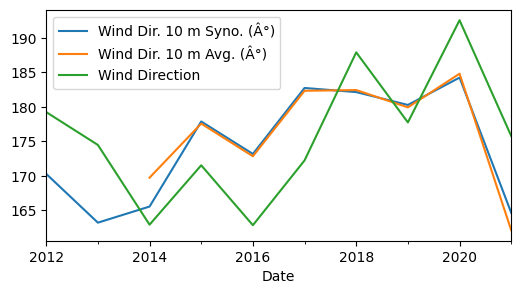

In [ ]:
b = ['Wind Dir. 10 m Syno. (Â°)','Wind Dir. 10 m Avg. (Â°)','Wind Direction']
for i in b:
  df2[i].resample('Y').mean().plot(legend = True, figsize = (6,3))
  # plt.show()
plt.show()

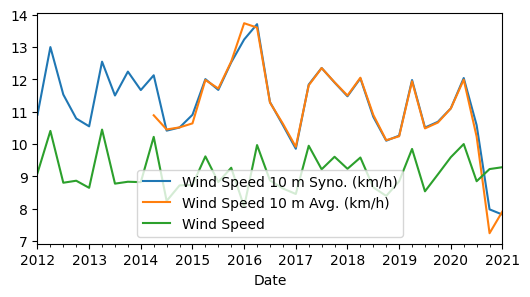

In [ ]:
b = ['Wind Speed 10 m Syno. (km/h)','Wind Speed 10 m Avg. (km/h)','Wind Speed']
for i in b:
  df2[i].resample('Q').mean().plot(legend = True, figsize = (6,3))
  # plt.show()
plt.show()

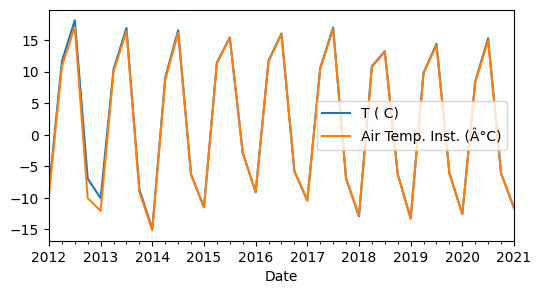

In [ ]:
b = ['T ( C)','Air Temp. Inst. (Â°C)']
for i in b:
  df2[i].resample('Q').mean().plot(legend = True, figsize = (6,3))
  # plt.show()
plt.show()

In [ ]:
a = ['RH (%)' ,'Humidity Inst. (%)', 'RH2',
    #  'Humidity Avg. (%)'
     ]

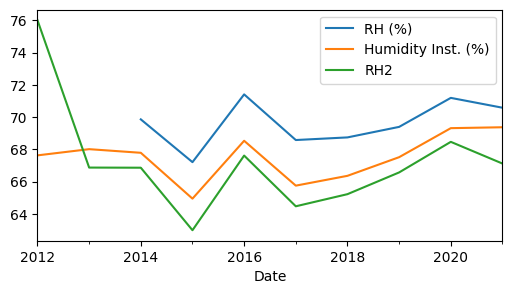

In [ ]:
for i in a:
  df2[i].resample('Y').mean().plot(legend = True, figsize = (6,3))
  # plt.show()
plt.show()

In [ ]:
# ta inja

In [ ]:
df1 = df1.loc['2012-09-01 00:00:00':]
df_we =df_we.loc['2012-09-01 00:00:00':]

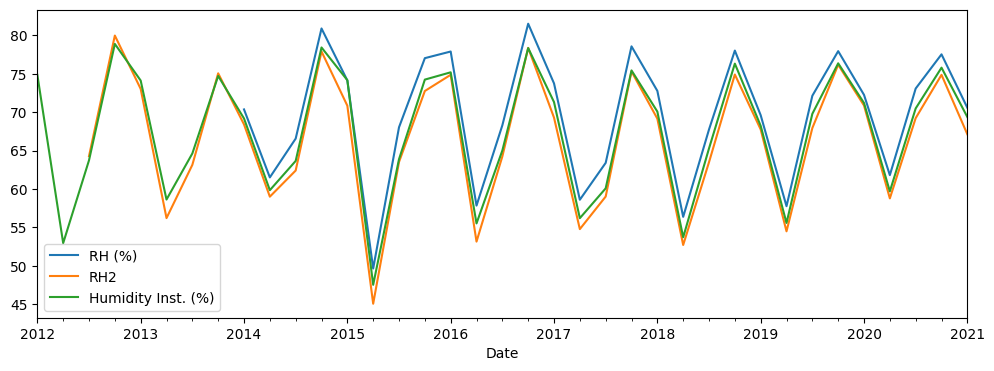

In [ ]:
df1[['RH (%)', 'RH2']].resample('Q').mean().plot(figsize = (12,4) , legend = True)
df2['Humidity Inst. (%)'].resample('Q').mean().plot(figsize = (12,4) , legend = True)
plt.show()

In [ ]:
df2.drop(columns = ['RH (%)', 'RH2', 'Air Temp. Inst. (Â°C)',
      'Humidity Avg. (%)', 'Snow Depth (cm)',
       'Wind Speed 10 m Syno. (km/h)', 'Wind Dir. 10 m Syno. (Â°)',
       'Wind Speed 10 m Avg. (km/h)', 'Wind Dir. 10 m Avg. (Â°)'], inplace = True)

In [ ]:
for i in df2.columns:
  df2[i] = pd.to_numeric(df2[i], errors='coerce')

def angle(firstAngle,secondAngle):
      difference = secondAngle - firstAngle
      if(difference < -180) :
          difference = difference+ 360
      if(difference > 180) :
          difference = difference -  360
      return np.abs(difference);
  
def new_wind(X,df1):
  name = 'New Wind' + str(X)
  df1[name] = 1
  for i in range(1, len(df)):
      if angle(df1['Wind Dir (deg)'].iloc[i], df1['Wind Dir (deg)'].iloc[i-1]) > X :
        df1[name].iloc[i] = 1
      else:
        df1[name].iloc[i] = df1[name].iloc[i-1] + 1
  return df1

from datetime import date
import holidays
holidays = holidays.CountryHoliday('CA', prov='AB')
df2['hol'] = 0
for i in df2.index:
  if i in holidays : 
    df2['hol'].loc[i] =1
# df

# df['SO2(ppm)'].loc['2013-jul'].min()
# df['SO2(ppm)'].loc['2013-jun-14':'2015-aug'].plot(figsize = (12,5))
# plt.show()
# # df['SO2(ppm)'].loc['2013-jun-14':'2015-aug'] = df['SO2(ppm)'].loc['2013-jun-14':'2015-aug'] - 0.001
# df['SO2(ppm)'] = df['SO2(ppm)'] - 0.001
# df['SO2(ppm)'][df['SO2(ppm)'] < 0] = 0
# df['SO2(ppm)'].loc['2013-jun-14':'2015-aug'].plot(figsize = (12,5))
# plt.show()

In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'Std. Dev. of Wind Direction',
       'Std. Dev. of Wind Speed', 'THC (ppm)', 'Wind Direction', 'Wind Speed',
       'Humidity Inst. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'hol'],
      dtype='object')

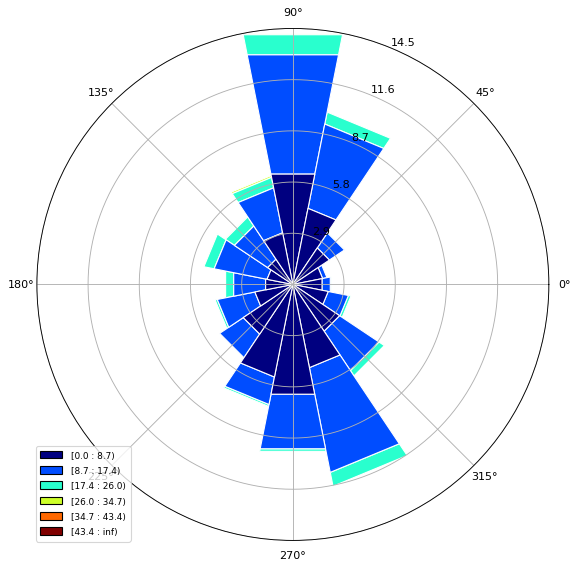

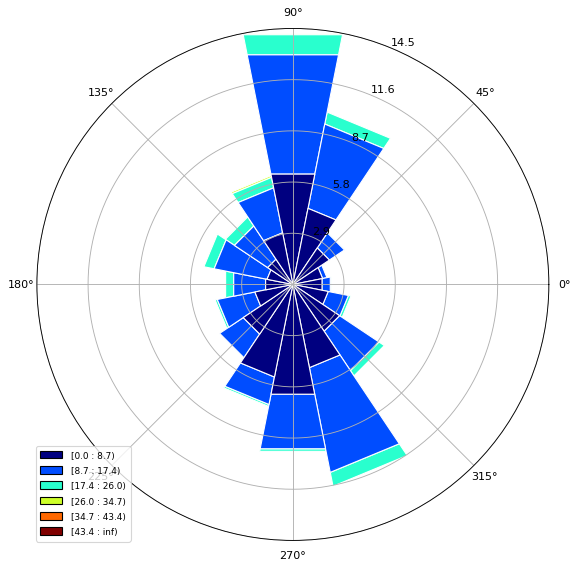

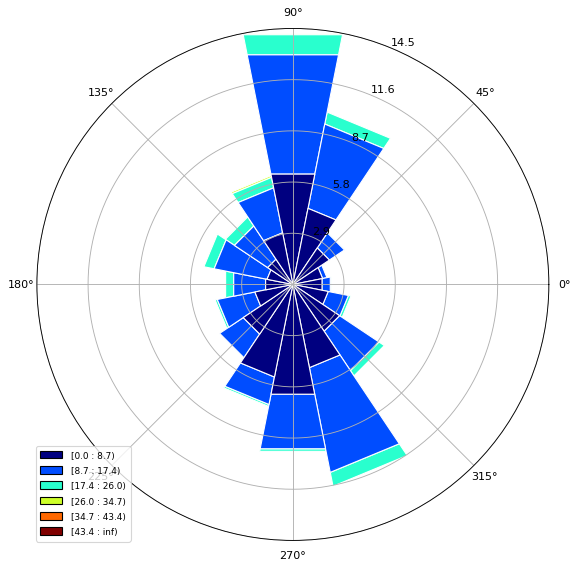

In [ ]:
ws = df2['Wind Speed']
wd = df2['Wind Direction']
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, normed=True, opening=1, edgecolor='white')
ax.set_legend()
plt.show()

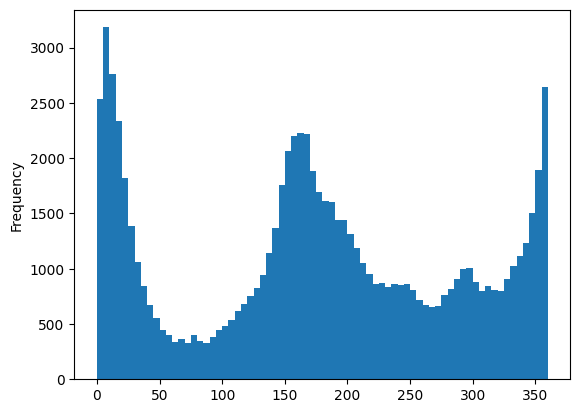

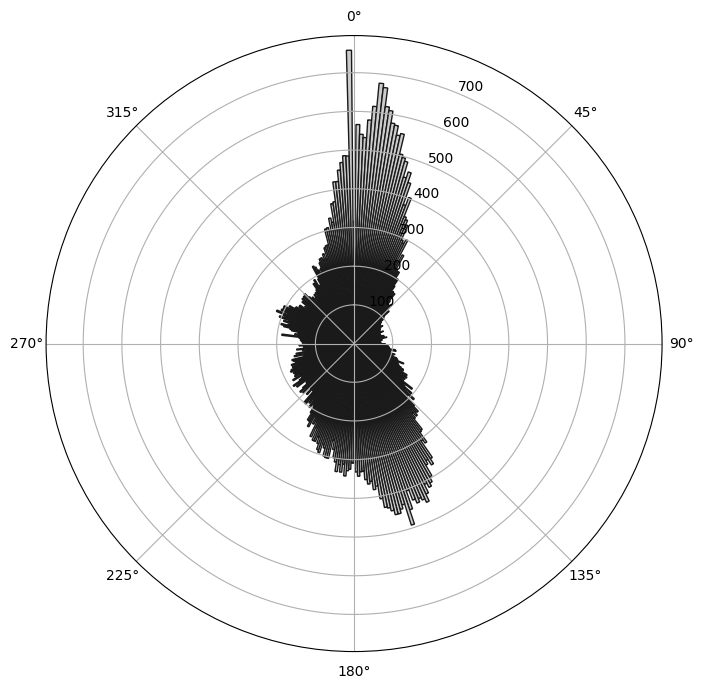

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
n =360
degrees = df2['Wind Direction']
radians = np.deg2rad(degrees)

bin_size = 360/n
a , b=np.histogram(degrees, bins=np.arange(0, 360+bin_size, bin_size))
centers = np.deg2rad(np.ediff1d(b)//2 + b[:-1])

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='polar')
ax.bar(centers, a, width=np.deg2rad(bin_size), bottom=0.0, color='.8', edgecolor='k')
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
plt.show()

In [ ]:
df2['Wind Direction'].plot.hist(bins = 72)

In [ ]:
 def season (x):
      if x  in [1,2,12]:
          return 1
      elif x in [3,4,5]:
          return 2
      elif x in [6,7,8]:
          return 3
      elif x in [9,10,11]:
          return 4
 def dater(df):
  df55 = df.copy() 
  df55['year'] = df55.index.year
  #df55['month'] = df55.index.month
  #df55['day'] = df55.index.day
  df55['hour'] =df55.index.hour
  df55['Date'] = df55.index
  df55['dayofweek_num']=df55.index.weekday  
  #df55['dayofweek_name']=df55.index.day_name()
  #df55['weekend']=np.where(df55.index.weekday>4 , 1 , 0)
  #df55['season'] = df55.Date.dt.month.apply(season)
  df55['Day-year'] = df55.index.dayofyear 
  #df55['hour-year'] =df55['Day-year'] * 24 + df55['hour']
  df55.drop(columns =['Date',], inplace= True)
  min = 2000
  df55['trend'] = 0

  n0 = sum([pd.Period(f'{2000}-{i}-1').daysinmonth for i in range(1,13)])
  n1 = sum([pd.Period(f'{2001}-{i}-1').daysinmonth for i in range(1,13)])
  n2 = sum([pd.Period(f'{2002}-{i}-1').daysinmonth for i in range(1,13)])
  n3 = sum([pd.Period(f'{2003}-{i}-1').daysinmonth for i in range(1,13)])
  n4 = sum([pd.Period(f'{2004}-{i}-1').daysinmonth for i in range(1,13)])
  n5 = sum([pd.Period(f'{2005}-{i}-1').daysinmonth for i in range(1,13)])
  n6 = sum([pd.Period(f'{2006}-{i}-1').daysinmonth for i in range(1,13)])
  n7 = sum([pd.Period(f'{2007}-{i}-1').daysinmonth for i in range(1,13)])
  n8 = sum([pd.Period(f'{2008}-{i}-1').daysinmonth for i in range(1,13)])
  n9 = sum([pd.Period(f'{2009}-{i}-1').daysinmonth for i in range(1,13)])
  n10 = sum([pd.Period(f'{2010}-{i}-1').daysinmonth for i in range(1,13)])
  n11 = sum([pd.Period(f'{2011}-{i}-1').daysinmonth for i in range(1,13)])
  n12 = sum([pd.Period(f'{2012}-{i}-1').daysinmonth for i in range(1,13)])
  n13 = sum([pd.Period(f'{2013}-{i}-1').daysinmonth for i in range(1,13)])
  n14 = sum([pd.Period(f'{2014}-{i}-1').daysinmonth for i in range(1,13)])
  n15 = sum([pd.Period(f'{2015}-{i}-1').daysinmonth for i in range(1,13)])
  n16 = sum([pd.Period(f'{2016}-{i}-1').daysinmonth for i in range(1,13)])
  n17 = sum([pd.Period(f'{2017}-{i}-1').daysinmonth for i in range(1,13)])
  n18 = sum([pd.Period(f'{2018}-{i}-1').daysinmonth for i in range(1,13)])
  n19 = sum([pd.Period(f'{2019}-{i}-1').daysinmonth for i in range(1,13)])
  n20 = sum([pd.Period(f'{2020}-{i}-1').daysinmonth for i in range(1,13)])
  n21 = sum([pd.Period(f'{2021}-{i}-1').daysinmonth for i in range(1,13)])

  df55['trend'][df55['year'] == 2000] = df55[df55['year'] == 2000]['year']-min + (df55[df55['year'] == 2000]['Day-year']-1)/n12 + (df55[df55['year'] == 2000]['hour']/(n12 *24)) 
  df55['trend'][df55['year'] == 2001] = df55[df55['year'] == 2001]['year']-min + (df55[df55['year'] == 2001]['Day-year']-1)/n12 + (df55[df55['year'] == 2001]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2002] = df55[df55['year'] == 2002]['year']-min + (df55[df55['year'] == 2002]['Day-year']-1)/n12 + (df55[df55['year'] == 2002]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2003] = df55[df55['year'] == 2003]['year']-min + (df55[df55['year'] == 2003]['Day-year']-1)/n12 + (df55[df55['year'] == 2003]['hour']/(n12 *24)) 
  df55['trend'][df55['year'] == 2004] = df55[df55['year'] == 2004]['year']-min + (df55[df55['year'] == 2004]['Day-year']-1)/n12 + (df55[df55['year'] == 2004]['hour']/(n12 *24))

  df55['trend'][df55['year'] == 2005] = df55[df55['year'] == 2005]['year']-min + (df55[df55['year'] == 2005]['Day-year']-1)/n12 + (df55[df55['year'] == 2005]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2006] = df55[df55['year'] == 2006]['year']-min + (df55[df55['year'] == 2006]['Day-year']-1)/n12 + (df55[df55['year'] == 2006]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2007] = df55[df55['year'] == 2007]['year']-min + (df55[df55['year'] == 2007]['Day-year']-1)/n12 + (df55[df55['year'] == 2007]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2008] = df55[df55['year'] == 2008]['year']-min + (df55[df55['year'] == 2008]['Day-year']-1)/n12 + (df55[df55['year'] == 2008]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2009] = df55[df55['year'] == 2009]['year']-min + (df55[df55['year'] == 2009]['Day-year']-1)/n12 + (df55[df55['year'] == 2009]['hour']/(n12 *24))

  df55['trend'][df55['year'] == 2010] = df55[df55['year'] == 2010]['year']-min + (df55[df55['year'] == 2010]['Day-year']-1)/n12 + (df55[df55['year'] == 2010]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2011] = df55[df55['year'] == 2011]['year']-min + (df55[df55['year'] == 2011]['Day-year']-1)/n12 + (df55[df55['year'] == 2011]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2012] = df55[df55['year'] == 2012]['year']-min + (df55[df55['year'] == 2012]['Day-year']-1)/n12 + (df55[df55['year'] == 2012]['hour']/(n12 *24)) 
  df55['trend'][df55['year'] == 2013] = df55[df55['year'] == 2013]['year']-min + (df55[df55['year'] == 2013]['Day-year']-1)/n12 + (df55[df55['year'] == 2013]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2014] = df55[df55['year'] == 2014]['year']-min + (df55[df55['year'] == 2014]['Day-year']-1)/n12 + (df55[df55['year'] == 2014]['hour']/(n12 *24))

  df55['trend'][df55['year'] == 2015] = df55[df55['year'] == 2015]['year']-min + (df55[df55['year'] == 2015]['Day-year']-1)/n12 + (df55[df55['year'] == 2015]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2016] = df55[df55['year'] == 2016]['year']-min + (df55[df55['year'] == 2016]['Day-year']-1)/n12 + (df55[df55['year'] == 2016]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2017] = df55[df55['year'] == 2017]['year']-min + (df55[df55['year'] == 2017]['Day-year']-1)/n12 + (df55[df55['year'] == 2017]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2018] = df55[df55['year'] == 2018]['year']-min + (df55[df55['year'] == 2018]['Day-year']-1)/n12 + (df55[df55['year'] == 2018]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2019] = df55[df55['year'] == 2019]['year']-min + (df55[df55['year'] == 2019]['Day-year']-1)/n12 + (df55[df55['year'] == 2019]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2020] = df55[df55['year'] == 2020]['year']-min + (df55[df55['year'] == 2020]['Day-year']-1)/n12 + (df55[df55['year'] == 2020]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2021] = df55[df55['year'] == 2021]['year']-min + (df55[df55['year'] == 2021]['Day-year']-1)/n12 + (df55[df55['year'] == 2021]['hour']/(n12 *24)) 

  df55.drop(columns = ['year'], inplace = True)
  return df55


df2 = dater(df2)
df2.index.freq = 'H'
df2['trend'].plot()

In [ ]:
df2

,SO2 (ppb),H2S (ppb),T ( C),Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,THC (ppm),Wind Direction,Wind Speed,Humidity Inst. (%),Incoming Solar Rad. (W/m2),Precip. Accumulated (mm),Precip. (mm),hol,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,39.0,3.0,-9.6,19.7,5.7,2.6,268.0,17.5,77.9,0.0,0.0,0.0,1,0,6,1,12.000000
2012-01-01 01:00:00,NaN,1.0,-11.1,22.1,3.5,NaN,245.0,11.6,78.4,0.0,0.0,0.0,1,1,6,1,12.000114
2012-01-01 02:00:00,9.0,NaN,-10.7,21.9,4.2,3.2,257.0,12.3,78.0,0.0,0.0,0.0,1,2,6,1,12.000228
2012-01-01 03:00:00,11.0,2.0,-10.7,20.4,4.9,2.8,267.0,16.4,78.0,0.0,0.0,0.0,1,3,6,1,12.000342
2012-01-01 04:00:00,7.0,1.0,-12.1,61.1,3.9,2.9,246.0,5.9,77.1,0.0,0.0,0.0,1,4,6,1,12.000455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-31 19:00:00,0.1,0.1,4.2,42.2,1.4,2.1,188.6,3.1,49.0,34.5,9.9,0.0,0,19,2,90,21.245332
2021-03-31 20:00:00,0.4,0.1,3.0,24.1,2.2,2.0,203.1,7.4,55.0,0.0,9.9,0.0,0,20,2,90,21.245446
2021-03-31 21:00:00,0.3,0.0,4.4,26.4,3.0,2.0,226.4,9.0,59.0,0.0,9.9,0.0,0,21,2,90,21.245560


In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'Std. Dev. of Wind Direction',
       'Std. Dev. of Wind Speed', 'THC (ppm)', 'Wind Direction', 'Wind Speed',
       'Humidity Inst. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'hol', 'hour',
       'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

In [ ]:
df2['SO2 (ppb)'].plot(figsize = (6,4))

In [ ]:
print(len(df2))

81072


In [ ]:
a = 100
print(len(df2[ 'SO2 (ppb)'][df2[ 'SO2 (ppb)']>a]))
df2[df2[ 'SO2 (ppb)']>a]

10


,SO2 (ppb),H2S (ppb),T ( C),Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,THC (ppm),Wind Direction,Wind Speed,Humidity Inst. (%),Incoming Solar Rad. (W/m2),Precip. Accumulated (mm),Precip. (mm),hol,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,,,,,
2013-08-23 13:00:00,110.0,1.0,23.5,71.0,2.4,2.5,186.0,3.8,38.8,678.1,90.7,0.0,0,13,4,235,13.640824
2013-10-11 11:00:00,102.0,1.0,9.2,81.0,2.5,2.4,262.0,4.1,67.3,175.6,43.4,0.0,0,11,4,284,13.774476
2015-12-02 23:00:00,133.0,2.0,3.9,22.0,2.5,2.5,275.0,9.1,70.0,NaN,19.7,0.0,0,23,2,336,15.917919
2016-03-19 10:00:00,112.0,2.0,-2.9,64.0,1.9,2.6,220.0,3.9,78.8,214.9,33.6,0.0,0,10,5,79,16.214253
2017-05-29 15:00:00,130.0,0.0,21.8,52.0,2.6,2.4,303.0,5.4,19.8,735.0,58.8,0.0,0,15,0,149,17.406079
2017-05-29 16:00:00,107.0,0.0,22.0,38.0,1.8,2.3,311.0,5.3,20.2,637.7,58.8,0.0,0,16,0,149,17.406193
2017-11-17 04:00:00,107.0,NaN,-14.8,18.0,3.9,2.3,287.0,12.0,70.0,0.0,27.0,0.0,0,4,4,321,17.874772
2018-06-22 13:00:00,423.0,2.0,27.8,51.0,1.7,2.2,251.0,4.1,46.0,699.4,0.0,0.0,0,13,4,173,18.471425
2018-06-22 14:00:00,156.0,1.0,29.3,75.0,2.3,2.1,247.0,3.0,40.0,748.0,0.0,0.0,0,14,4,173,18.471539


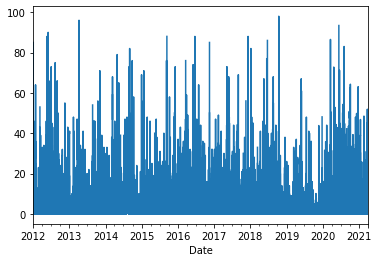

In [ ]:
df2['SO2 (ppb)'][df2[ 'SO2 (ppb)']>100] = np.nan
df2[ 'SO2 (ppb)'].plot()
plt.show()

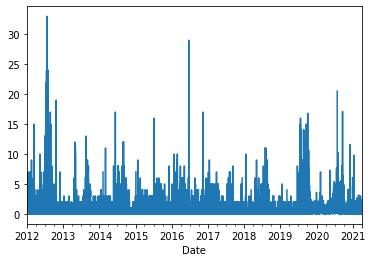

In [ ]:
df2['H2S (ppb)'].plot()

In [ ]:
a =21
print(len(df2[ 'H2S (ppb)'][df2[ 'H2S (ppb)']>a]))
df2[df2[ 'H2S (ppb)']>a]

6


,SO2 (ppb),H2S (ppb),T ( C),Std. Dev. of Wind Direction,Std. Dev. of Wind Speed,THC (ppm),Wind Direction,Wind Speed,Humidity Inst. (%),Incoming Solar Rad. (W/m2),Precip. Accumulated (mm),Precip. (mm),hol,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,,,,,
2012-07-14 08:00:00,8.0,22.0,19.9,19.0,2.2,3.2,141.0,9.6,55.7,284.4,147.4,0.0,0,8,5,196,12.533698
2012-07-16 20:00:00,2.0,24.0,24.2,11.0,1.9,4.5,161.0,9.3,36.6,68.2,0.0,0.0,0,20,0,198,12.540528
2012-07-21 02:00:00,1.0,33.0,18.6,10.0,1.6,5.5,163.0,10.1,65.6,0.0,15.4,0.0,0,2,5,203,12.552140
2012-08-02 15:00:00,43.0,24.0,18.1,34.0,1.8,2.1,325.0,5.1,80.9,182.0,29.2,0.0,0,15,3,215,12.586407
2016-06-20 05:00:00,12.0,22.0,8.9,47.0,1.3,95.1,339.0,2.7,70.2,41.6,66.8,0.0,0,5,0,172,16.467782
2016-06-20 06:00:00,16.0,29.0,11.2,44.0,1.0,111.5,338.0,2.8,62.9,146.4,66.8,0.0,0,6,0,172,16.467896


In [ ]:
df2['H2S (ppb)'][df2[ 'H2S (ppb)']>21] = np.nan

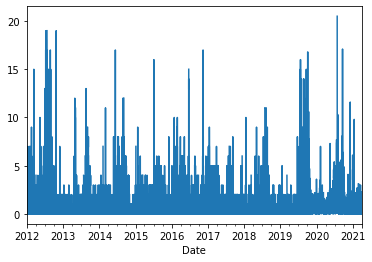

In [ ]:
df2[ 'H2S (ppb)'].plot()

In [ ]:
df2.columns

Index(['SO2 (ppb)', 'H2S (ppb)', 'T ( C)', 'Std. Dev. of Wind Direction',
       'Std. Dev. of Wind Speed', 'THC (ppm)', 'Wind Direction', 'Wind Speed',
       'Humidity Inst. (%)', 'Incoming Solar Rad. (W/m2)',
       'Precip. Accumulated (mm)', 'Precip. (mm)', 'hol', 'hour',
       'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

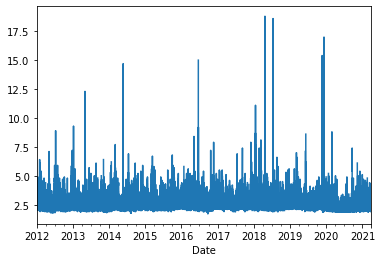

In [ ]:
# df2['THC (ppm)'].plot()
df2['THC (ppm)'][df2['THC (ppm)']>20]= np.nan
df2['THC (ppm)'].plot()

0


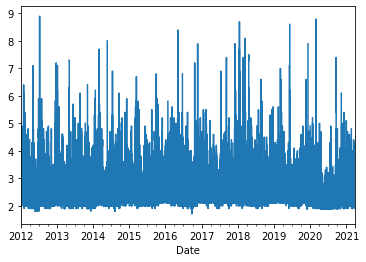

In [ ]:
a = 10
print(len(df2[df2['THC (ppm)']>a]))
df2[df2['THC (ppm)']>a]
df2['THC (ppm)'][df2['THC (ppm)']>a]= np.nan
df2['THC (ppm)'].plot()

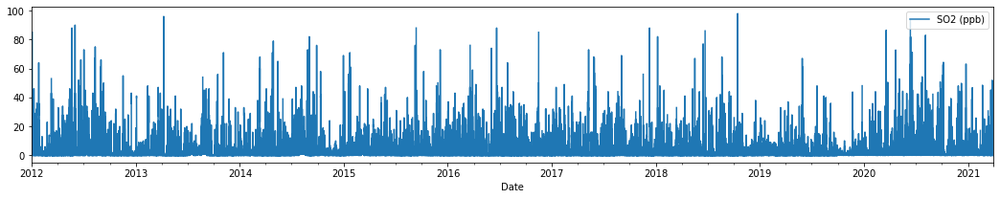

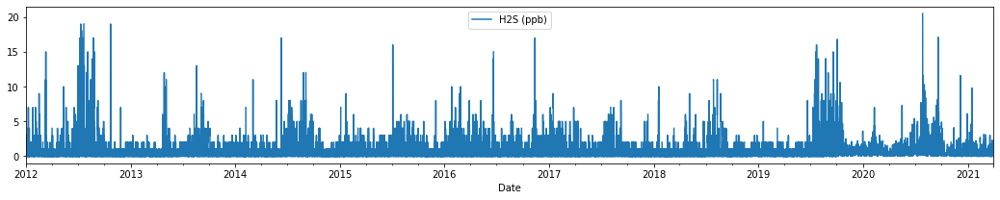

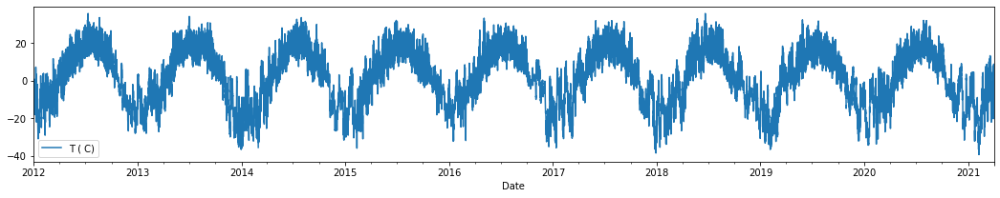

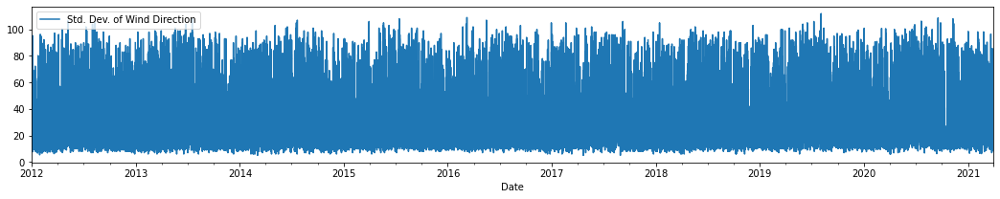

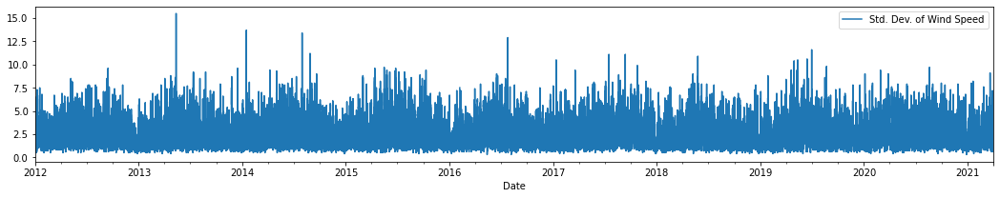

...

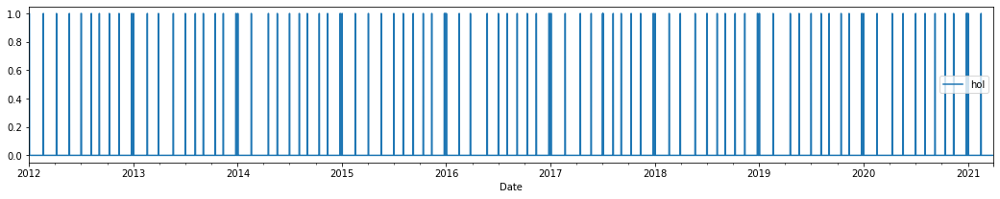

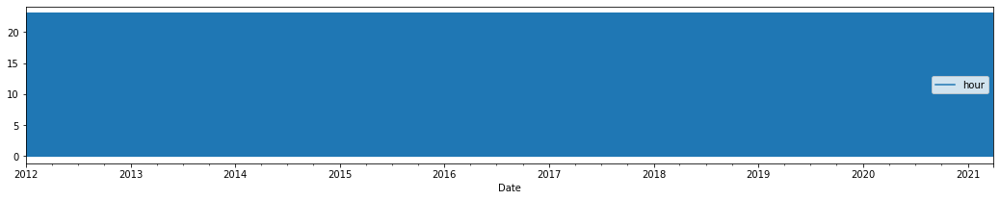

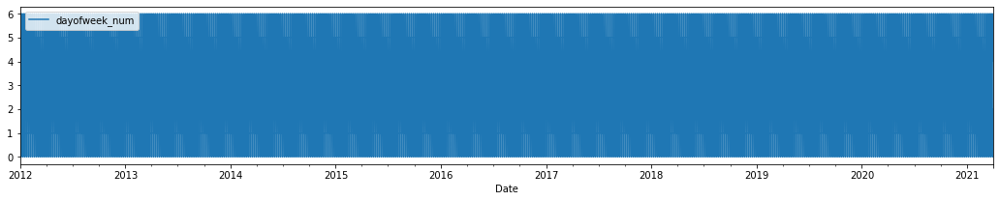

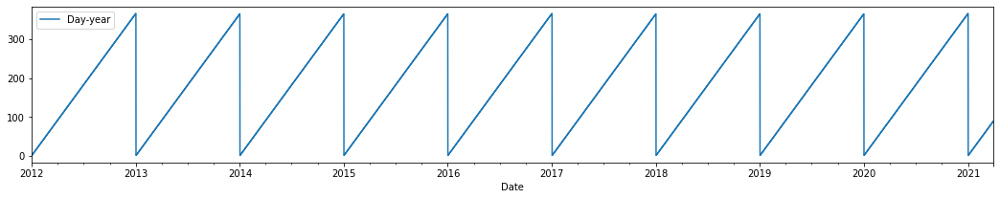

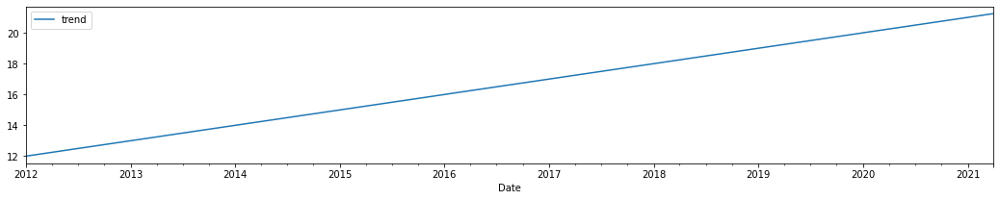

In [ ]:
for i in df2.columns:
  df2[i].plot(figsize = (18,3), legend = True)
  plt.show()

In [ ]:
print(df2.isna().sum())
df2.info()

SO2 (ppb)                      4100
H2S (ppb)                      4221
T ( C)                          108
Std. Dev. of Wind Direction     530
Std. Dev. of Wind Speed         530
THC (ppm)                      4560
Wind Direction                  530
Wind Speed                      530
Humidity Inst. (%)               10
Incoming Solar Rad. (W/m2)     1704
Precip. Accumulated (mm)         10
Precip. (mm)                     10
hol                               0
hour                              0
dayofweek_num                     0
Day-year                          0
trend                             0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 81072 entries, 2012-01-01 00:00:00 to 2021-03-31 23:00:00
Freq: H
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SO2 (ppb)                    76972 non-null  float64
 1   H2S (ppb)                    76851 non-null 

In [ ]:
df4=df2.interpolate(method='time', limit = 6)
print(df4.isna().sum())
df4 = df4.dropna(axis='rows')
print(df4.isna().sum())
# df_mobility_interpolated.info()
# df_mob = df_mobility_interpolated.dropna(axis='rows')
# df_mob.isna().sum()

SO2 (ppb)                        93
H2S (ppb)                       170
T ( C)                           39
Std. Dev. of Wind Direction     320
Std. Dev. of Wind Speed         320
THC (ppm)                       403
Wind Direction                  320
Wind Speed                      320
Humidity Inst. (%)                0
Incoming Solar Rad. (W/m2)     1181
Precip. Accumulated (mm)          0
Precip. (mm)                      0
hol                               0
hour                              0
dayofweek_num                     0
Day-year                          0
trend                             0
dtype: int64
SO2 (ppb)                      0
H2S (ppb)                      0
T ( C)                         0
Std. Dev. of Wind Direction    0
Std. Dev. of Wind Speed        0
THC (ppm)                      0
Wind Direction                 0
Wind Speed                     0
Humidity Inst. (%)             0
Incoming Solar Rad. (W/m2)     0
Precip. Accumulated (mm)       0
Precip. (mm)

In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Industrial/Mildred Lake_Corrected.csv', 'w') as f:
  df4.to_csv(f)

In [ ]:
#######################################

In [ ]:
df_premob =  df2_s.loc[:'2020-01-12'].copy()

In [ ]:
df_premob

,CO(ppm),NO(ppm),NO2(ppm),T©,O3(ppm),PM2.5 Mass ug/m3,Std Dev Wind Direction,SO2(ppm),THC(ppm),NOX(ppm),Wind Direction,Wind Speed,driving,transit,walking,Incoming Solar Rad. (W/m2)_E,RH_E_C,hol,between 70-260,not 70-260,hour,dayofweek_num,Day-year,trend,between 70-260 shift,not 70-260 shift,Wind direction shift,Wind speed shift,T(C) shift,RH(%) shift
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-09-01 01:00:00,0.2,0.0,0.01,4.9,0.01,2.5,23.0,0.0,2.00,0.01,190.0,2.2,NaN,NaN,NaN,0.0,85.0,1,2.2,0.0,1,0,245,8.666781,3.5,0.0,218.0,3.5,6.0,80.0
2008-09-01 02:00:00,0.2,0.0,0.01,5.1,0.00,4.0,9.0,0.0,2.10,0.01,179.0,4.5,NaN,NaN,NaN,0.1,88.0,1,4.5,0.0,2,0,245,8.666894,2.2,0.0,190.0,2.2,4.9,85.0
2008-09-01 03:00:00,0.2,0.0,0.01,5.3,0.00,4.0,8.0,0.0,2.10,0.01,194.0,3.7,NaN,NaN,NaN,0.1,90.0,1,3.7,0.0,3,0,245,8.667008,4.5,0.0,179.0,4.5,5.1,88.0
2008-09-01 04:00:00,0.1,0.0,0.01,4.3,0.00,3.0,11.0,0.0,2.10,0.01,189.0,2.8,NaN,NaN,NaN,0.0,91.0,1,2.8,0.0,4,0,245,8.667122,3.7,0.0,194.0,3.7,5.3,90.0
2008-09-01 05:00:00,0.2,0.0,0.01,3.5,0.00,3.4,9.0,0.0,2.10,0.01,183.0,3.0,NaN,NaN,NaN,0.0,93.0,1,3.0,0.0,5,0,245,8.667236,2.8,0.0,189.0,2.8,4.3,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-12 19:00:00,0.2,0.0,0.01,-24.9,0.03,2.4,25.0,0.0,1.96,0.01,301.0,10.2,NaN,NaN,NaN,0.0,62.0,0,0.0,10.2,19,6,12,20.032218,0.0,9.8,291.6,9.8,-25.0,58.0
2020-01-12 20:00:00,0.1,0.0,0.01,-24.9,0.03,2.6,26.0,0.0,1.96,0.01,297.2,9.1,NaN,NaN,NaN,0.0,61.0,0,0.0,9.1,20,6,12,20.032332,0.0,10.2,301.0,10.2,-24.9,62.0
2020-01-12 21:00:00,0.1,0.0,0.01,-25.1,0.03,3.1,23.0,0.0,1.97,0.01,306.5,10.1,NaN,NaN,NaN,0.0,66.0,0,0.0,10.1,21,6,12,20.032445,0.0,9.1,297.2,9.1,-24.9,61.0


In [ ]:
df_premob.columns

Index(['CO(ppm)', 'NO(ppm)', 'NO2(ppm)', 'T©', 'O3(ppm)', 'PM2.5 Mass ug/m3',
       'Std Dev Wind Direction', 'SO2(ppm)', 'THC(ppm)', 'NOX(ppm)',
       'Wind Direction', 'Wind Speed', 'driving', 'transit', 'walking',
       'Incoming Solar Rad. (W/m2)_E', 'RH_E_C', 'hol', 'between 70-260',
       'not 70-260', 'hour', 'dayofweek_num', 'Day-year', 'trend',
       'between 70-260 shift', 'not 70-260 shift', 'Wind direction shift',
       'Wind speed shift', 'T(C) shift', 'RH(%) shift'],
      dtype='object')

In [ ]:
df_premob.drop(columns = [ 'driving', 'transit', 'walking'], inplace = True)

In [ ]:
# df_all =df_premob.loc['2012': ].copy() 

In [ ]:
# for i in col:
#   df_all[i].plot(figsize = (12,6), legend = True)
#   plt.show()

In [ ]:
df_all.columns

NameError: ignored

In [ ]:
df_all.isna().sum()

CO(ppm)                         2024
NO(ppm)                         2851
NO2(ppm)                        2852
T©                              3030
O3(ppm)                         2610
PM2.5 Mass ug/m3                6342
Std Dev Wind Direction          2102
SO2(ppm)                        2010
THC(ppm)                        3913
NOX(ppm)                        2852
Wind Direction                  1483
Wind Speed                      2789
Incoming Solar Rad. (W/m2)_E      25
RH_E_C                          1149
hol                                0
hour                               0
dayofweek_num                      0
Day-year                           0
trend                              0
Wind direction shift            1483
Wind speed shift                2789
T(C) shift                      3030
RH(%) shift                     1149
dtype: int64

In [ ]:
df_allt=df_all.interpolate(method='time', limit = 6)

In [ ]:
df_allt.isna().sum()

CO(ppm)                          581
NO(ppm)                          865
NO2(ppm)                         865
T©                              2395
O3(ppm)                         1168
PM2.5 Mass ug/m3                3254
Std Dev Wind Direction          1650
SO2(ppm)                         595
THC(ppm)                        2362
NOX(ppm)                         865
Wind Direction                  1022
Wind Speed                      2284
Incoming Solar Rad. (W/m2)_E       0
RH_E_C                           969
hol                                0
hour                               0
dayofweek_num                      0
Day-year                           0
trend                              0
Wind direction shift            1022
Wind speed shift                2284
T(C) shift                      2395
RH(%) shift                      969
dtype: int64

In [ ]:
df_allt.dropna(inplace= True)
df_allt.isna().sum()

CO(ppm)                         0
NO(ppm)                         0
NO2(ppm)                        0
T©                              0
O3(ppm)                         0
PM2.5 Mass ug/m3                0
Std Dev Wind Direction          0
SO2(ppm)                        0
THC(ppm)                        0
NOX(ppm)                        0
Wind Direction                  0
Wind Speed                      0
Incoming Solar Rad. (W/m2)_E    0
RH_E_C                          0
hol                             0
hour                            0
dayofweek_num                   0
Day-year                        0
trend                           0
Wind direction shift            0
Wind speed shift                0
T(C) shift                      0
RH(%) shift                     0
dtype: int64

In [ ]:
df_allt.loc['2018-11-10':'2018-11-29']

,CO(ppm),NO(ppm),NO2(ppm),T©,O3(ppm),PM2.5 Mass ug/m3,Std Dev Wind Direction,SO2(ppm),THC(ppm),NOX(ppm),Wind Direction,Wind Speed,Incoming Solar Rad. (W/m2)_E,RH_E_C,hol,hour,dayofweek_num,Day-year,trend,Wind direction shift,Wind speed shift,T(C) shift,RH(%) shift
Date,,,,,,,,,,,,,,,,,,,,,,,
2018-11-10 00:00:00,0.2,0.00,0.00,1.0,0.03,3.0,18.0,0.0,2.00,0.00,314.0,12.9,0.0,87.0,0,0,5,314,18.855191,304.0,13.5,1.5,87.0
2018-11-10 01:00:00,0.2,0.00,0.00,0.6,0.03,3.0,13.0,0.0,2.00,0.00,343.0,18.2,0.0,86.0,0,1,5,314,18.855305,314.0,12.9,1.0,87.0
2018-11-10 02:00:00,0.2,0.00,0.00,-0.3,0.03,3.0,14.0,0.0,2.00,0.00,331.0,16.9,0.0,78.0,0,2,5,314,18.855419,343.0,18.2,0.6,86.0
2018-11-10 03:00:00,0.2,0.00,0.00,-0.1,0.03,3.0,14.0,0.0,2.05,0.00,332.0,20.1,0.0,82.0,0,3,5,314,18.855533,331.0,16.9,-0.3,78.0
2018-11-10 04:00:00,0.2,0.00,0.00,-0.5,0.03,4.0,13.0,0.0,2.10,0.00,333.0,20.0,0.0,78.0,0,4,5,314,18.855647,332.0,20.1,-0.1,82.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-29 19:00:00,0.4,0.02,0.03,0.7,0.00,7.0,12.0,0.0,2.30,0.05,203.0,3.6,0.0,62.0,0,19,3,333,18.909267,200.0,4.3,1.3,61.0
2018-11-29 20:00:00,0.4,0.03,0.03,-0.4,0.00,7.0,14.0,0.0,2.40,0.06,181.0,2.2,0.0,65.0,0,20,3,333,18.909381,203.0,3.6,0.7,62.0
2018-11-29 21:00:00,0.5,0.04,0.03,-0.3,0.00,11.0,37.0,0.0,2.40,0.07,200.0,3.0,0.0,69.0,0,21,3,333,18.909495,181.0,2.2,-0.4,65.0


In [ ]:
df_allt.columns

Index(['CO(ppm)', 'NO(ppm)', 'NO2(ppm)', 'T©', 'O3(ppm)', 'PM2.5 Mass ug/m3',
       'Std Dev Wind Direction', 'SO2(ppm)', 'THC(ppm)', 'NOX(ppm)',
       'Wind Direction', 'Wind Speed', 'Incoming Solar Rad. (W/m2)_E',
       'RH_E_C', 'hol', 'hour', 'dayofweek_num', 'Day-year', 'trend',
       'Wind direction shift', 'Wind speed shift', 'T(C) shift',
       'RH(%) shift'],
      dtype='object')

In [ ]:
df_allt['New Wind45.0'].loc['2018-11'].plot()

KeyError: ignored

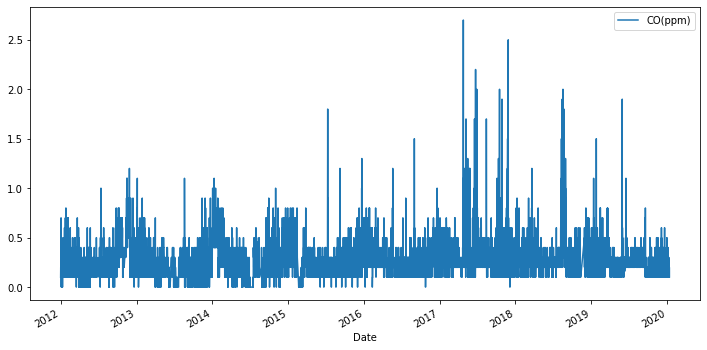

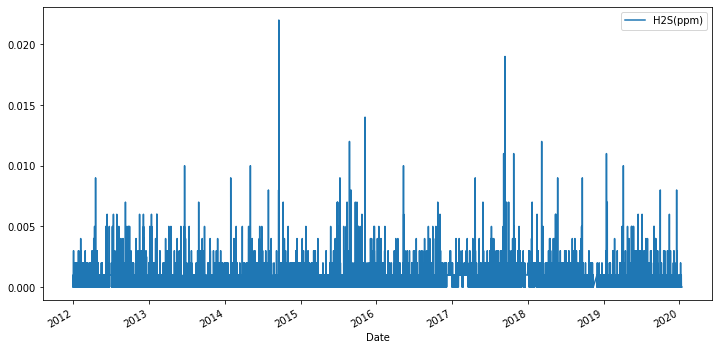

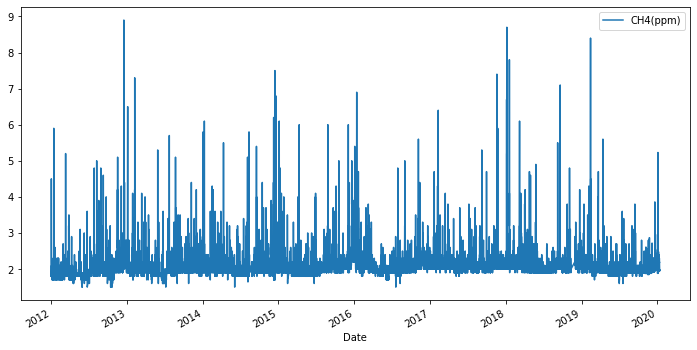

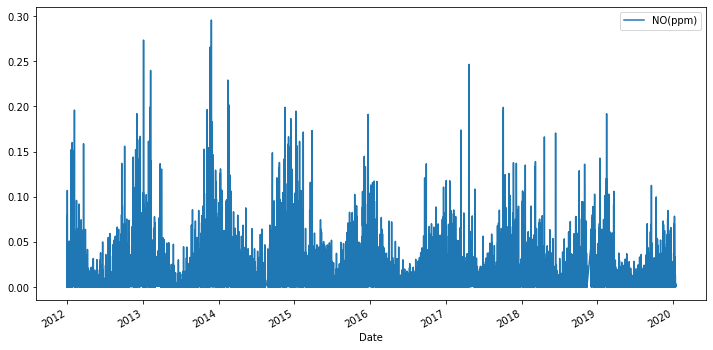

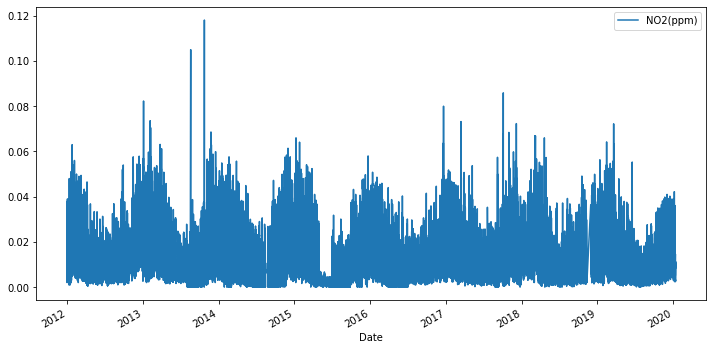

...

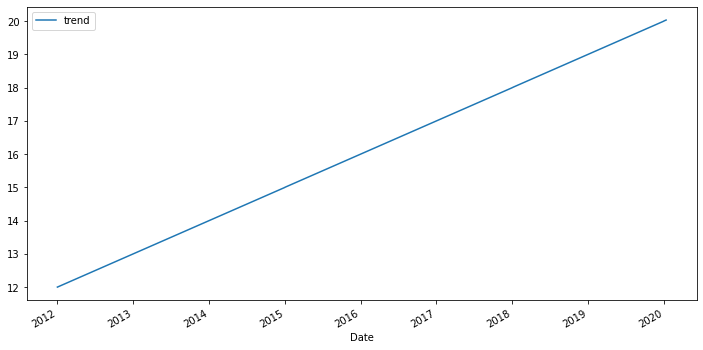

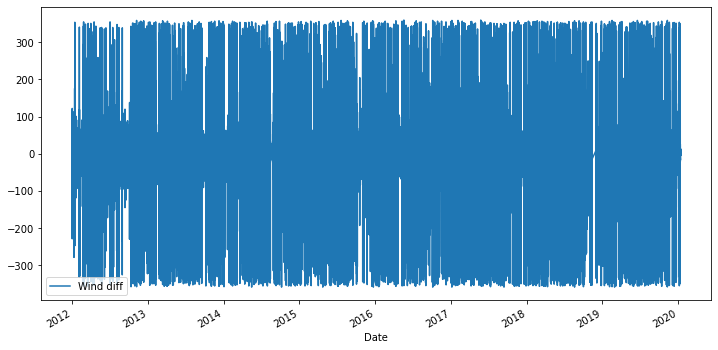

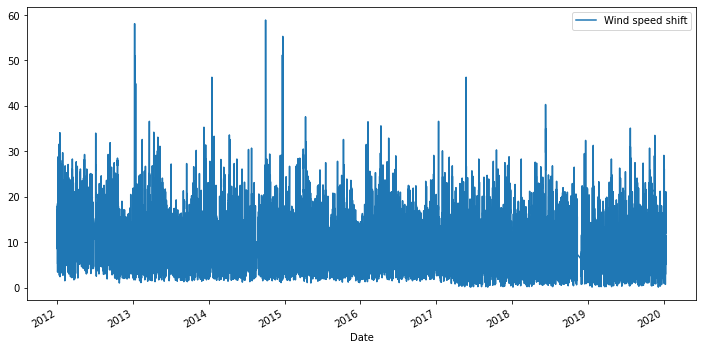

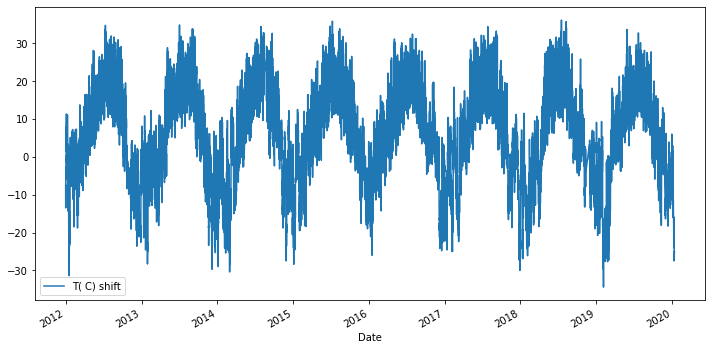

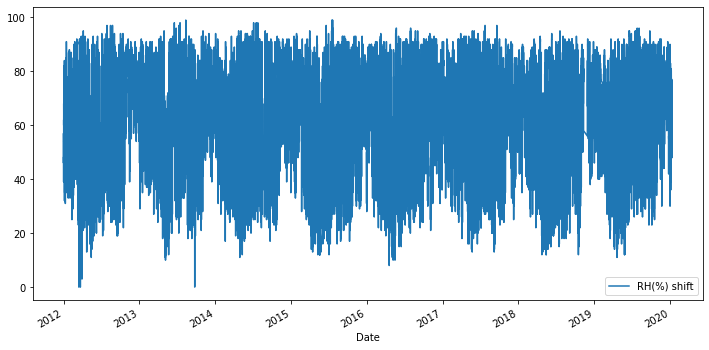

In [ ]:
for i in df_allt.columns:
  df_allt[i].plot(figsize = (12,6), legend = True)
  plt.show()

In [ ]:
# with open('gdrive/My Drive/Colab Notebooks/Stations/Edmonton_east_OK_beforecovid_2015allfeatures.csv', 'w') as f:
#   df_allt.to_csv(f)

In [ ]:
####################

In [ ]:
df_premob

,CO(ppm),NO(ppm),NO2(ppm),T©,O3(ppm),PM2.5 Mass ug/m3,Std Dev Wind Direction,SO2(ppm),THC(ppm),NOX(ppm),Wind Direction,Wind Speed,Incoming Solar Rad. (W/m2)_E,RH_E_C,hol,between 70-260,not 70-260,hour,dayofweek_num,Day-year,trend,between 70-260 shift,not 70-260 shift,Wind direction shift,Wind speed shift,T(C) shift,RH(%) shift
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-09-01 01:00:00,0.2,0.0,0.01,4.9,0.01,2.5,23.0,0.0,2.00,0.01,190.0,2.2,0.0,85.0,1,2.2,0.0,1,0,245,8.666781,3.5,0.0,218.0,3.5,6.0,80.0
2008-09-01 02:00:00,0.2,0.0,0.01,5.1,0.00,4.0,9.0,0.0,2.10,0.01,179.0,4.5,0.1,88.0,1,4.5,0.0,2,0,245,8.666894,2.2,0.0,190.0,2.2,4.9,85.0
2008-09-01 03:00:00,0.2,0.0,0.01,5.3,0.00,4.0,8.0,0.0,2.10,0.01,194.0,3.7,0.1,90.0,1,3.7,0.0,3,0,245,8.667008,4.5,0.0,179.0,4.5,5.1,88.0
2008-09-01 04:00:00,0.1,0.0,0.01,4.3,0.00,3.0,11.0,0.0,2.10,0.01,189.0,2.8,0.0,91.0,1,2.8,0.0,4,0,245,8.667122,3.7,0.0,194.0,3.7,5.3,90.0
2008-09-01 05:00:00,0.2,0.0,0.01,3.5,0.00,3.4,9.0,0.0,2.10,0.01,183.0,3.0,0.0,93.0,1,3.0,0.0,5,0,245,8.667236,2.8,0.0,189.0,2.8,4.3,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-12 19:00:00,0.2,0.0,0.01,-24.9,0.03,2.4,25.0,0.0,1.96,0.01,301.0,10.2,0.0,62.0,0,0.0,10.2,19,6,12,20.032218,0.0,9.8,291.6,9.8,-25.0,58.0
2020-01-12 20:00:00,0.1,0.0,0.01,-24.9,0.03,2.6,26.0,0.0,1.96,0.01,297.2,9.1,0.0,61.0,0,0.0,9.1,20,6,12,20.032332,0.0,10.2,301.0,10.2,-24.9,62.0
2020-01-12 21:00:00,0.1,0.0,0.01,-25.1,0.03,3.1,23.0,0.0,1.97,0.01,306.5,10.1,0.0,66.0,0,0.0,10.1,21,6,12,20.032445,0.0,9.1,297.2,9.1,-24.9,61.0


In [ ]:
df_premob.columns

Index(['CO(ppm)', 'NO(ppm)', 'NO2(ppm)', 'T©', 'O3(ppm)', 'PM2.5 Mass ug/m3',
       'Std Dev Wind Direction', 'SO2(ppm)', 'THC(ppm)', 'NOX(ppm)',
       'Wind Direction', 'Wind Speed', 'Incoming Solar Rad. (W/m2)_E',
       'RH_E_C', 'hol', 'between 70-260', 'not 70-260', 'hour',
       'dayofweek_num', 'Day-year', 'trend', 'between 70-260 shift',
       'not 70-260 shift', 'Wind direction shift', 'Wind speed shift',
       'T(C) shift', 'RH(%) shift'],
      dtype='object')

In [ ]:
# df_premob.drop(columns = ['CH4(ppm)',' Non-methane Hydrocarbons (ppm)',], inplace = True)

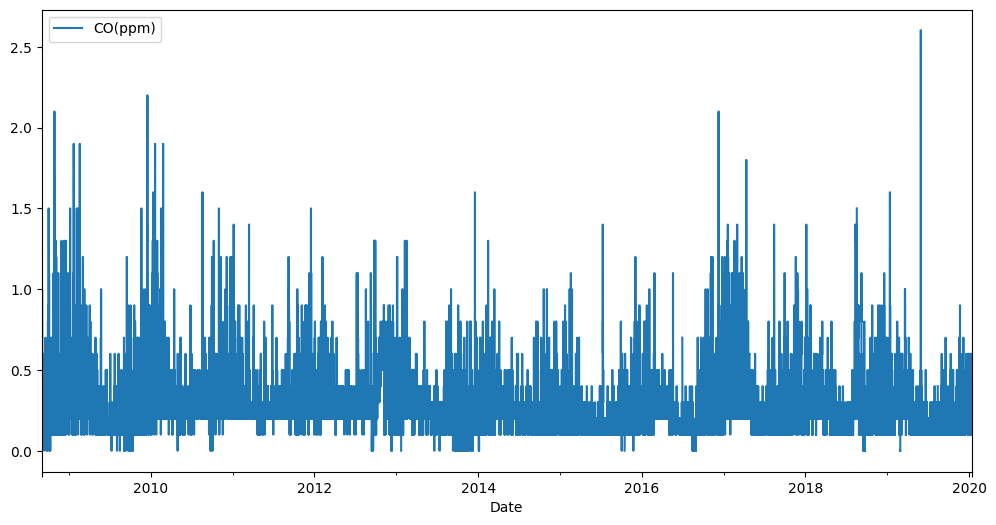

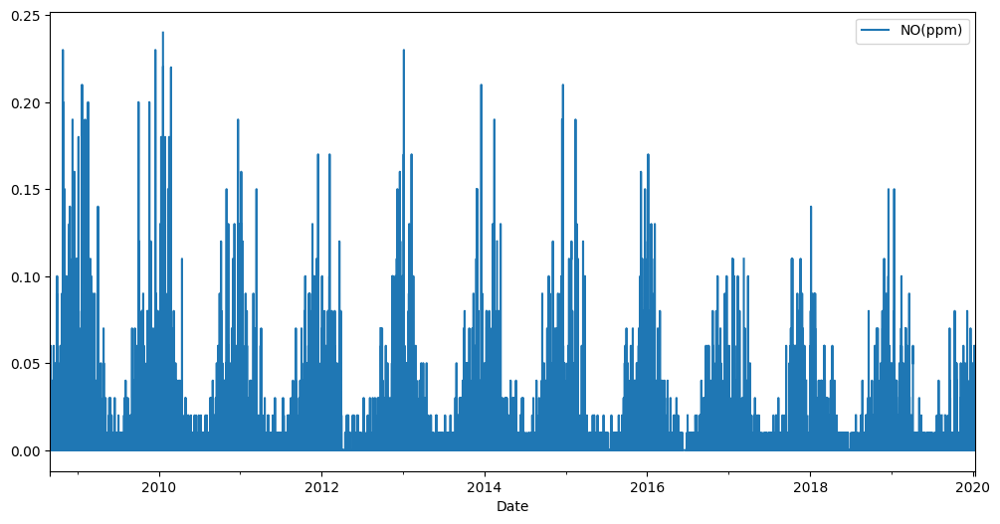

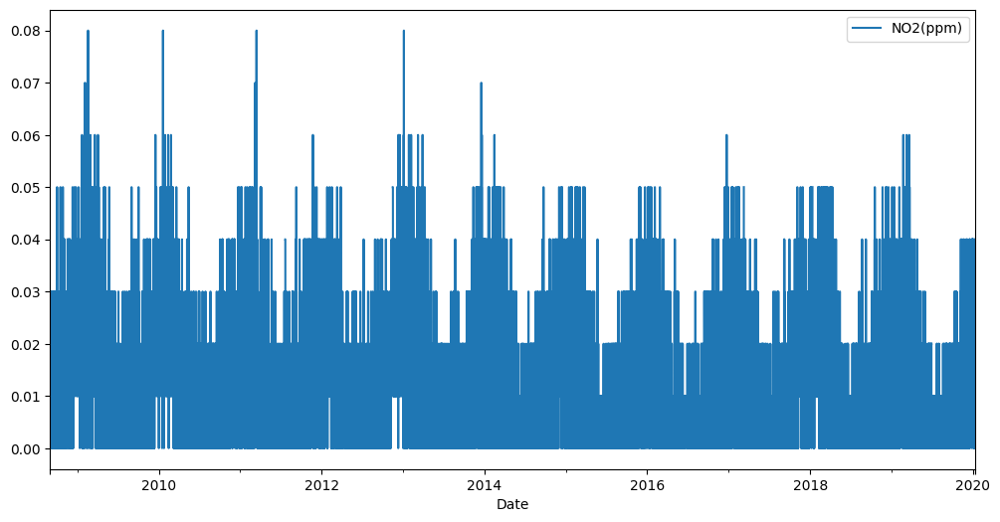

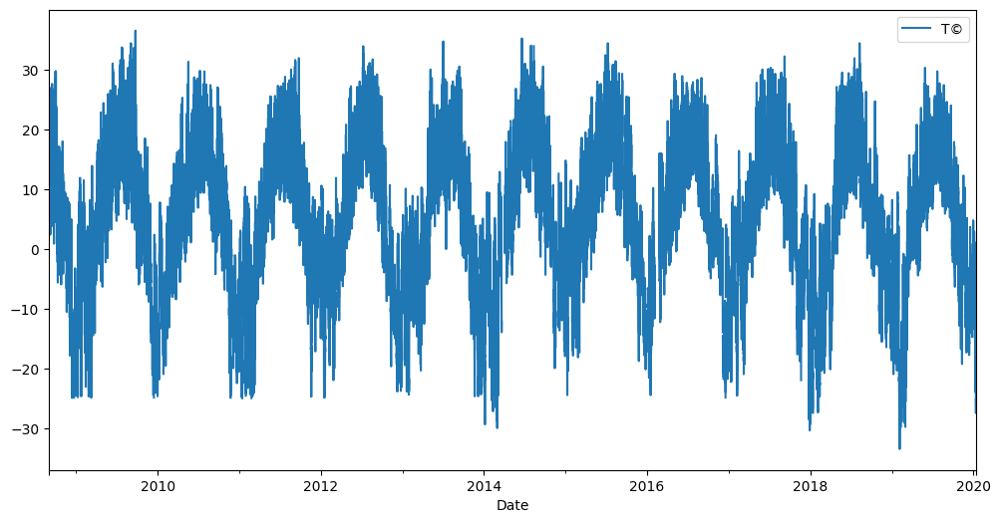

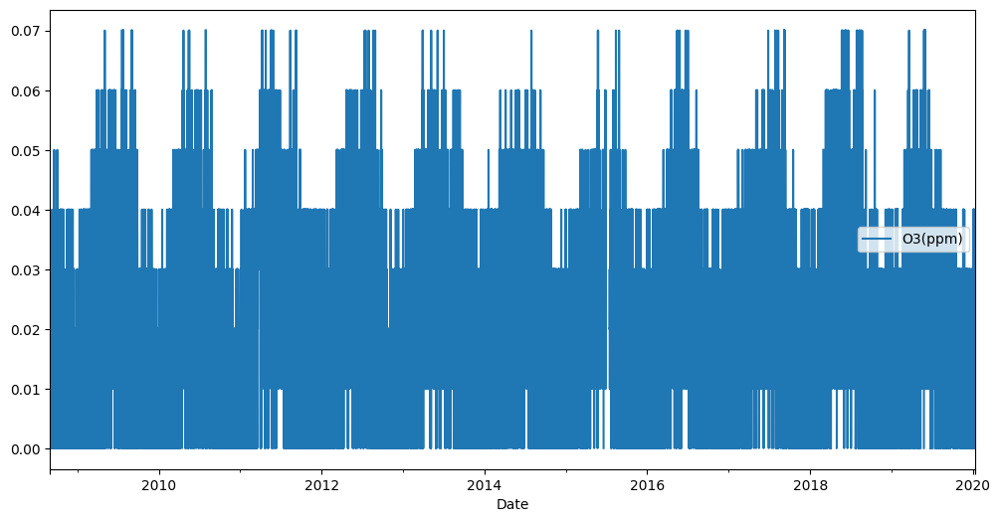

...

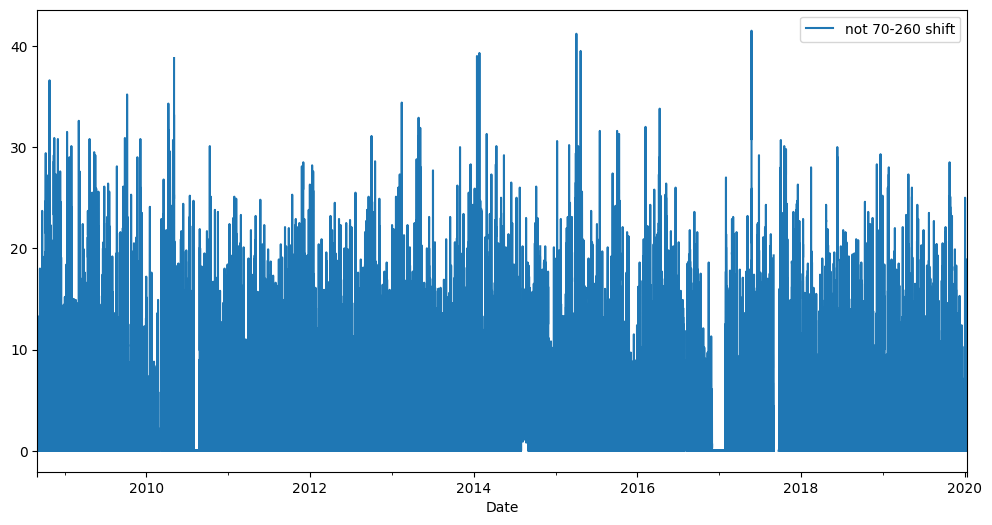

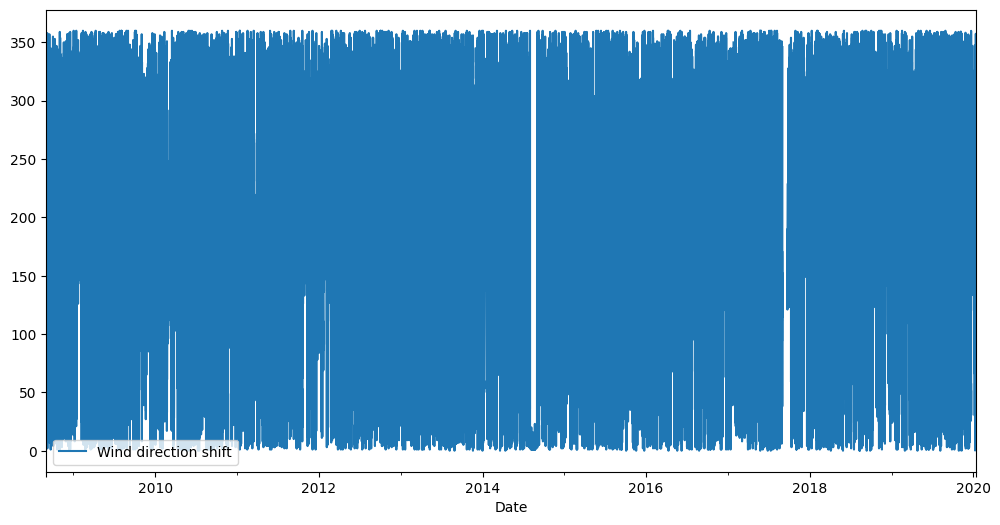

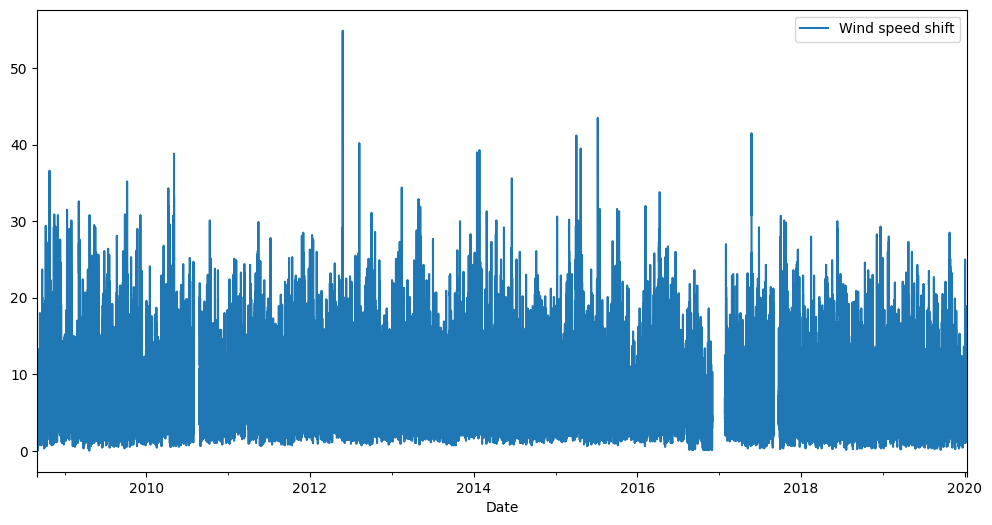

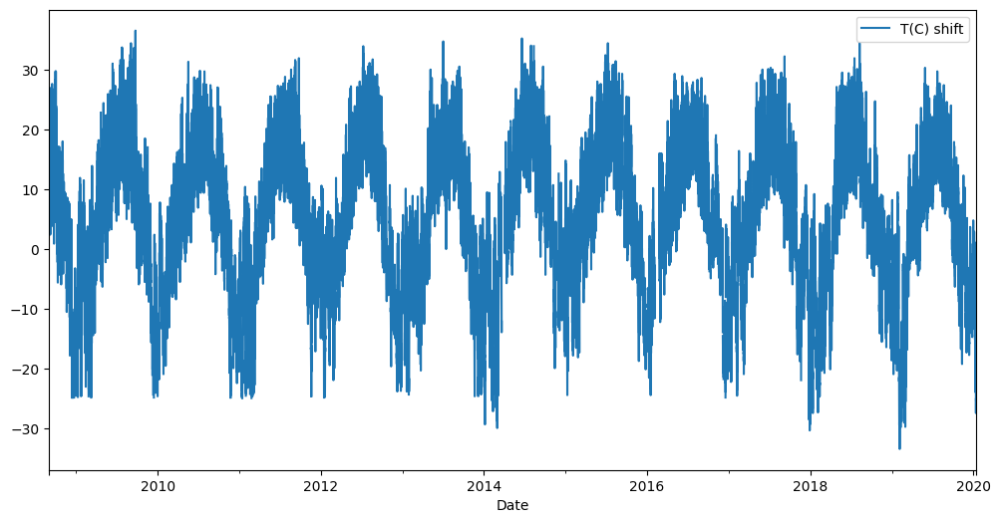

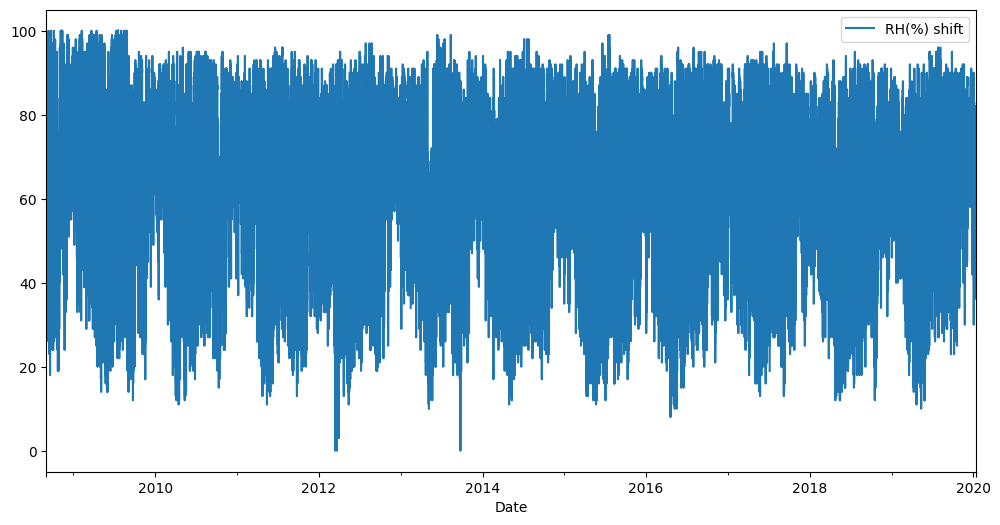

In [ ]:
for i in df_premob.columns:
  df_premob[i].plot(figsize = (12,6), legend = True)
  plt.show()

In [ ]:
df_premob.isna().sum()

CO(ppm)                         2246
NO(ppm)                         3591
NO2(ppm)                        3586
T©                              3546
O3(ppm)                         2840
PM2.5 Mass ug/m3                7404
Std Dev Wind Direction          2165
SO2(ppm)                        2608
THC(ppm)                        4511
NOX(ppm)                        3589
Wind Direction                  1552
Wind Speed                      3430
Incoming Solar Rad. (W/m2)_E      28
RH_E_C                          1159
hol                                0
between 70-260                  1092
not 70-260                      2338
hour                               0
dayofweek_num                      0
Day-year                           0
trend                              0
between 70-260 shift            1092
not 70-260 shift                2338
Wind direction shift            1552
Wind speed shift                3430
T(C) shift                      3546
RH(%) shift                     1159
d

In [ ]:
df_premob_t=df_premob.interpolate(method='time', limit = 4)

In [ ]:
df_premob_t.isna().sum()

CO(ppm)                          704
NO(ppm)                         1670
NO2(ppm)                        1669
T©                              2852
O3(ppm)                         1297
PM2.5 Mass ug/m3                3792
Std Dev Wind Direction          1755
SO2(ppm)                        1036
THC(ppm)                        2872
NOX(ppm)                        1669
Wind Direction                  1126
Wind Speed                      2958
Incoming Solar Rad. (W/m2)_E       0
RH_E_C                          1018
hol                                0
between 70-260                   796
not 70-260                      1669
hour                               0
dayofweek_num                      0
Day-year                           0
trend                              0
between 70-260 shift             796
not 70-260 shift                1669
Wind direction shift            1126
Wind speed shift                2958
T(C) shift                      2852
RH(%) shift                     1018
d

In [ ]:
df_precov = df_premob_t.dropna(axis='rows')

In [ ]:
df_precov.isna().sum()

CO(ppm)                         0
NO(ppm)                         0
NO2(ppm)                        0
T©                              0
O3(ppm)                         0
PM2.5 Mass ug/m3                0
Std Dev Wind Direction          0
SO2(ppm)                        0
THC(ppm)                        0
NOX(ppm)                        0
Wind Direction                  0
Wind Speed                      0
Incoming Solar Rad. (W/m2)_E    0
RH_E_C                          0
hol                             0
between 70-260                  0
not 70-260                      0
hour                            0
dayofweek_num                   0
Day-year                        0
trend                           0
between 70-260 shift            0
not 70-260 shift                0
Wind direction shift            0
Wind speed shift                0
T(C) shift                      0
RH(%) shift                     0
dtype: int64

In [ ]:
df_precov[df_precov['hol']==1]

,CO(ppm),NO(ppm),NO2(ppm),T©,O3(ppm),PM2.5 Mass ug/m3,Std Dev Wind Direction,SO2(ppm),THC(ppm),NOX(ppm),Wind Direction,Wind Speed,Incoming Solar Rad. (W/m2)_E,RH_E_C,hol,between 70-260,not 70-260,hour,dayofweek_num,Day-year,trend,between 70-260 shift,not 70-260 shift,Wind direction shift,Wind speed shift,T(C) shift,RH(%) shift
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-09-01 01:00:00,0.2,0.00,0.01,4.9,0.01,2.5,23.0,0.0,2.00,0.01,190.0,2.2,0.0,85.0,1,2.2,0.0,1,0,245,8.666781,3.5,0.0,218.0,3.5,6.0,80.0
2008-09-01 02:00:00,0.2,0.00,0.01,5.1,0.00,4.0,9.0,0.0,2.10,0.01,179.0,4.5,0.1,88.0,1,4.5,0.0,2,0,245,8.666894,2.2,0.0,190.0,2.2,4.9,85.0
2008-09-01 03:00:00,0.2,0.00,0.01,5.3,0.00,4.0,8.0,0.0,2.10,0.01,194.0,3.7,0.1,90.0,1,3.7,0.0,3,0,245,8.667008,4.5,0.0,179.0,4.5,5.1,88.0
2008-09-01 04:00:00,0.1,0.00,0.01,4.3,0.00,3.0,11.0,0.0,2.10,0.01,189.0,2.8,0.0,91.0,1,2.8,0.0,4,0,245,8.667122,3.7,0.0,194.0,3.7,5.3,90.0
2008-09-01 05:00:00,0.2,0.00,0.01,3.5,0.00,3.4,9.0,0.0,2.10,0.01,183.0,3.0,0.0,93.0,1,3.0,0.0,5,0,245,8.667236,2.8,0.0,189.0,2.8,4.3,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-01 19:00:00,0.5,0.02,0.03,-4.5,0.00,16.3,14.0,0.0,2.14,0.05,175.0,4.1,0.0,85.0,1,4.1,0.0,19,2,1,20.002163,3.6,0.0,174.5,3.6,-3.9,82.0
2020-01-01 20:00:00,0.5,0.02,0.03,-4.6,0.00,16.9,17.0,0.0,2.08,0.05,181.7,5.1,0.0,87.0,1,5.1,0.0,20,2,1,20.002277,4.1,0.0,175.0,4.1,-4.5,85.0
2020-01-01 21:00:00,0.4,0.01,0.03,-4.6,0.00,19.2,11.0,0.0,2.12,0.04,167.2,5.3,0.0,87.0,1,5.3,0.0,21,2,1,20.002391,5.1,0.0,181.7,5.1,-4.6,87.0


In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Stations/Edmonton_South_beforecovid_v1.csv', 'w') as f:
  df_precov.to_csv(f)

In [ ]:
df_precov

,CO(ppm),NO(ppm),NO2(ppm),T©,O3(ppm),PM2.5 Mass ug/m3,Std Dev Wind Direction,SO2(ppm),THC(ppm),NOX(ppm),Wind Direction,Wind Speed,Incoming Solar Rad. (W/m2)_E,RH_E_C,hol,between 70-260,not 70-260,hour,dayofweek_num,Day-year,trend,between 70-260 shift,not 70-260 shift,Wind direction shift,Wind speed shift,T(C) shift,RH(%) shift
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-09-01 01:00:00,0.2,0.0,0.01,4.9,0.01,2.5,23.0,0.0,2.00,0.01,190.0,2.2,0.0,85.0,1,2.2,0.0,1,0,245,8.666781,3.5,0.0,218.0,3.5,6.0,80.0
2008-09-01 02:00:00,0.2,0.0,0.01,5.1,0.00,4.0,9.0,0.0,2.10,0.01,179.0,4.5,0.1,88.0,1,4.5,0.0,2,0,245,8.666894,2.2,0.0,190.0,2.2,4.9,85.0
2008-09-01 03:00:00,0.2,0.0,0.01,5.3,0.00,4.0,8.0,0.0,2.10,0.01,194.0,3.7,0.1,90.0,1,3.7,0.0,3,0,245,8.667008,4.5,0.0,179.0,4.5,5.1,88.0
2008-09-01 04:00:00,0.1,0.0,0.01,4.3,0.00,3.0,11.0,0.0,2.10,0.01,189.0,2.8,0.0,91.0,1,2.8,0.0,4,0,245,8.667122,3.7,0.0,194.0,3.7,5.3,90.0
2008-09-01 05:00:00,0.2,0.0,0.01,3.5,0.00,3.4,9.0,0.0,2.10,0.01,183.0,3.0,0.0,93.0,1,3.0,0.0,5,0,245,8.667236,2.8,0.0,189.0,2.8,4.3,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-12 19:00:00,0.2,0.0,0.01,-24.9,0.03,2.4,25.0,0.0,1.96,0.01,301.0,10.2,0.0,62.0,0,0.0,10.2,19,6,12,20.032218,0.0,9.8,291.6,9.8,-25.0,58.0
2020-01-12 20:00:00,0.1,0.0,0.01,-24.9,0.03,2.6,26.0,0.0,1.96,0.01,297.2,9.1,0.0,61.0,0,0.0,9.1,20,6,12,20.032332,0.0,10.2,301.0,10.2,-24.9,62.0
2020-01-12 21:00:00,0.1,0.0,0.01,-25.1,0.03,3.1,23.0,0.0,1.97,0.01,306.5,10.1,0.0,66.0,0,0.0,10.1,21,6,12,20.032445,0.0,9.1,297.2,9.1,-24.9,61.0


In [ ]:
#############
# DONE

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn.cluster import DBSCAN


In [ ]:
a = StandardScaler().fit_transform( df_precov)

In [ ]:
db = DBSCAN(eps=3, min_samples=100).fit(a)

In [ ]:
db.labels_

array([-1, -1, -1, ..., -1, -1, -1])

Estimated number of clusters: 0
Estimated number of noise points: 166186


NameError: ignored

CO(ppm)


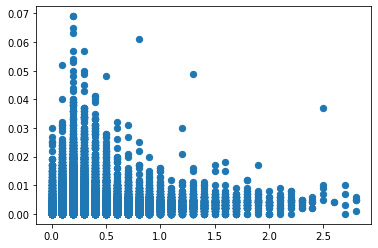

H2S(ppm)


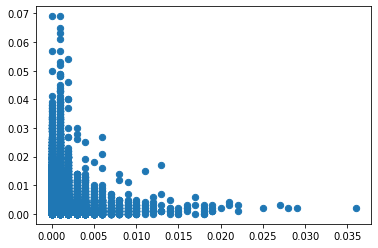

CH4(ppm)


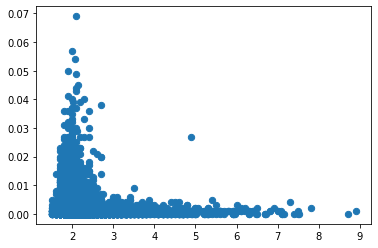

NO(ppm)


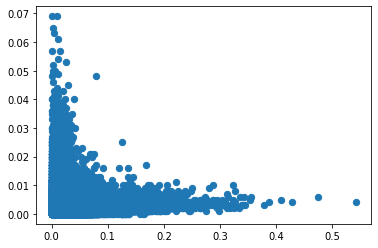

NO2(ppm)


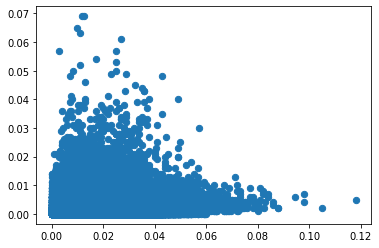

 Non-methane Hydrocarbons (ppm)


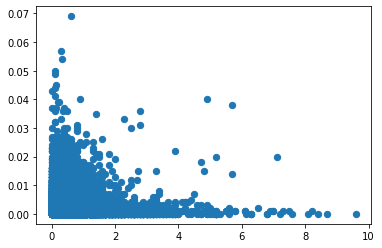

T( C)


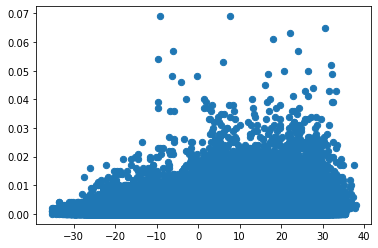

O3(ppm)


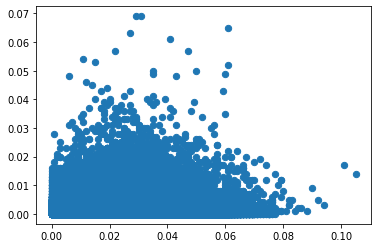

RH(%)


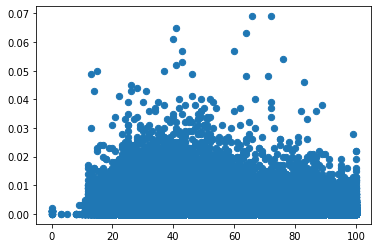

Wind Dir (STD)Unknown 


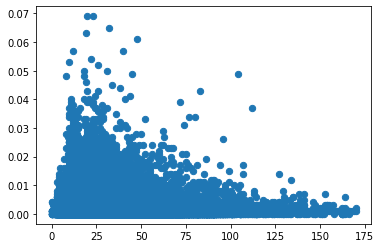

SO2(ppm)


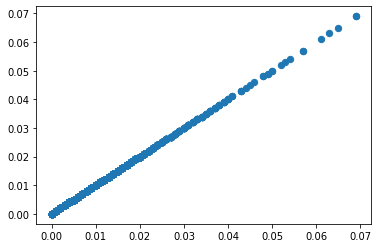

THC(ppm)


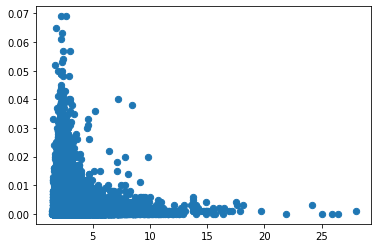

NOX(ppm)


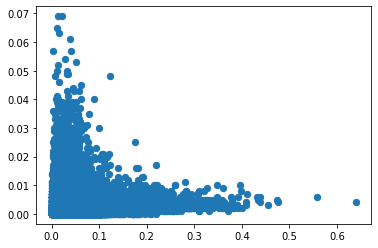

Wind Dir (deg)


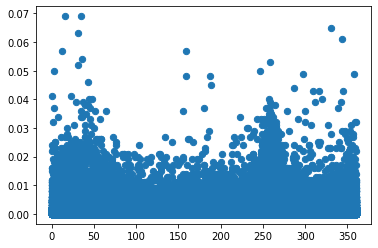

Wind speed


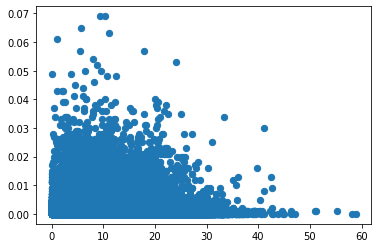

driving


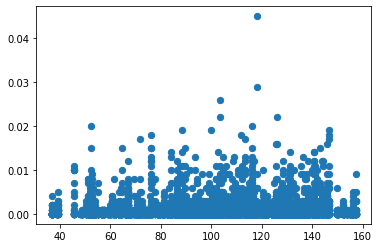

transit


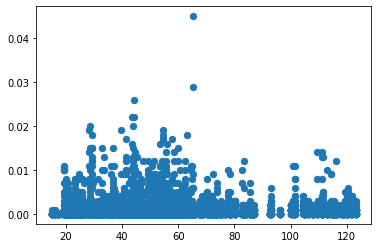

walking


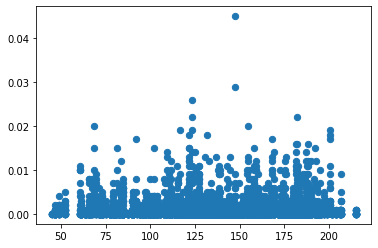

New wind


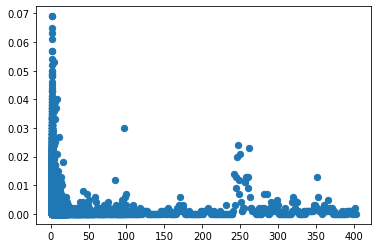

hour


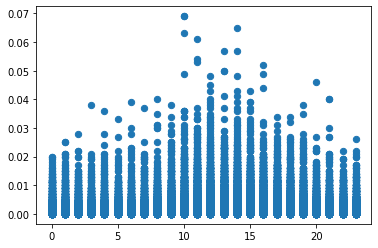

dayofweek_num


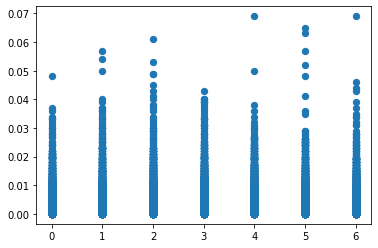

Day-year


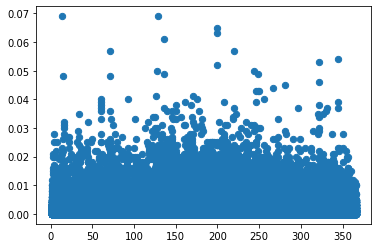

trend


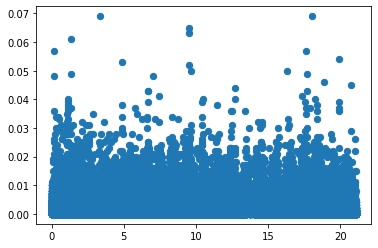

In [ ]:
for i in df1_s.columns:
  plt.scatter(df1_s[i],df1_s['SO2(ppm)'],s=40)
  print(i)
  plt.legend = True
  plt.show()

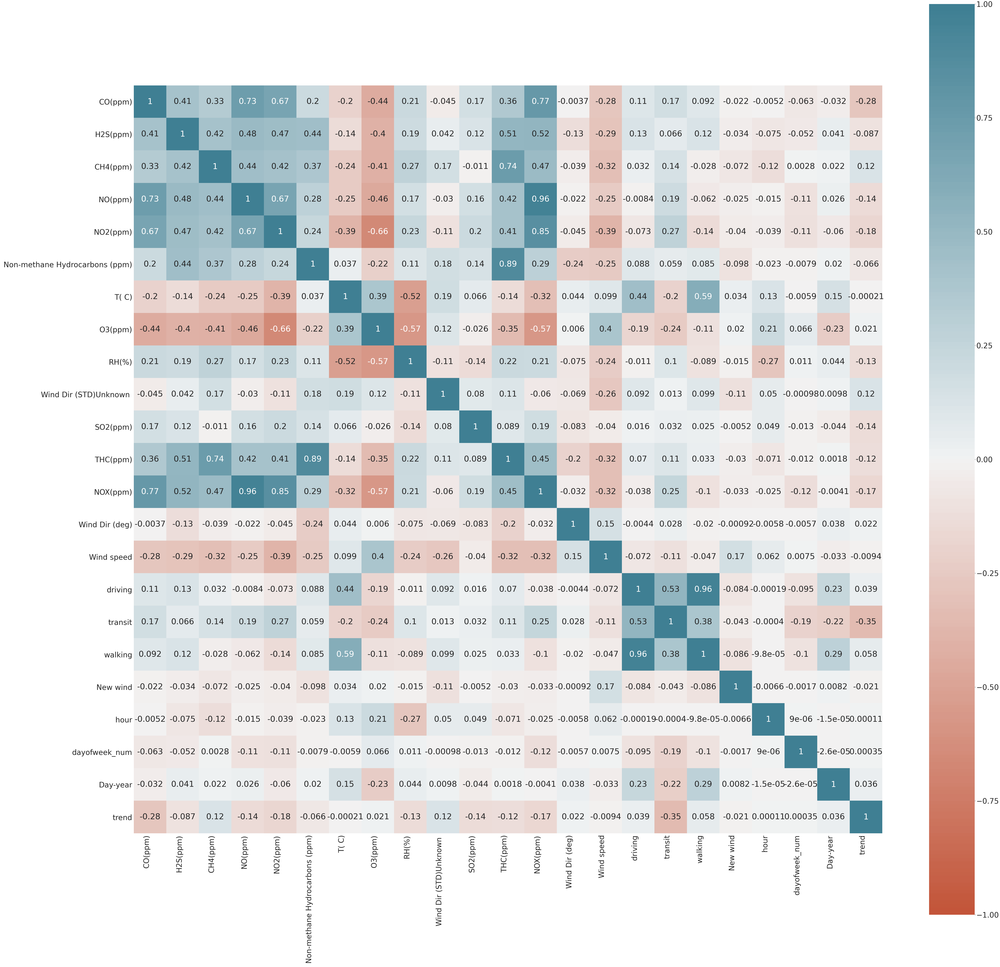

In [ ]:
corr = df1_s.corr()
mask = np.zeros(corr.shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
sns.set(font_scale=4)
fig, ax = plt.subplots(figsize=(100,100))   
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True , ax = ax,annot=True,
    # mask = mask
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

In [ ]:
df1_s.columns

Index(['SO2(ppb)-s1', 'H2S(ppb)-s1', 'Temp-2m-st1', 'Temp -20m-st1',
       'Temp-45m-st1', 'Temp-75m-st1', 'RH-20m-st1', 'Wind Speed-20m-st1',
       'Wind Speed-45m-st1', 'Wind Speed-75m-st1', 'Wind Dir-20m-st1',
       'Wind Dir-45m-st1', 'Wind Dir-75m-st1', 'Vertical Wind Speed-20m-st1',
       'Vertical Wind Speed-45m-st1', 'Vertical Wind Speed-75m-st1'],
      dtype='object')

In [ ]:
df1_s.drop(columns = [ 'Wind Speed-20m-st1',
                        'Wind Speed-75m-st1', 'Wind Dir-20m-st1',
                        'Wind Dir-75m-st1',
                      'Temp -20m-st1',
       'Temp-45m-st1', 'Temp-75m-st1'], inplace = True)

In [ ]:
# corr = df1_s.corr()
# mask = np.zeros(corr.shape, dtype=bool)
# mask[np.triu_indices(len(mask))] = True
# sns.set(font_scale=4)
# fig, ax = plt.subplots(figsize=(100,100))   
# ax = sns.heatmap(
#     corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sns.diverging_palette(20, 220, n=200),
#     square=True , ax = ax,annot=True,
#     # mask = mask
# )
# ax.set_xticklabels(
#     ax.get_xticklabels(),
#     rotation=90,
#     horizontalalignment='right'
# );

In [ ]:
# corr = df1_s.corr()
# mask = np.zeros(corr.shape, dtype=bool)
# mask[np.triu_indices(len(mask))] = True
# sns.set(font_scale=4)
# fig, ax = plt.subplots(figsize=(100,100))   
# ax = sns.heatmap(
#     corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sns.diverging_palette(20, 220, n=200),
#     square=True , ax = ax,annot=True,
#     # mask = mask
# )
# ax.set_xticklabels(
#     ax.get_xticklabels(),
#     rotation=90,
#     horizontalalignment='right'
# );

In [ ]:
# for i in df1_s.columns:
#   plt.scatter(df1_s[i],df1_s['SO2(ppb)-s1'],s=40)
#   print(i)
#   plt.legend = True
#   plt.show()

In [ ]:
df1_s.index.dayofyear

Int64Index([275, 275, 275, 275, 275, 275, 275, 275, 275, 275,
            ...
            213, 213, 213, 213, 213, 213, 213, 213, 213, 213],
           dtype='int64', name='Date', length=68664)

In [ ]:
year=2016
number_of_days = sum([pd.Period(f'{year}-{i}-1').daysinmonth for i in range(1,13)])
number_of_days

366

In [ ]:
df1_s.index

DatetimeIndex(['2012-10-01 00:00:00', '2012-10-01 01:00:00',
               '2012-10-01 02:00:00', '2012-10-01 03:00:00',
               '2012-10-01 04:00:00', '2012-10-01 05:00:00',
               '2012-10-01 06:00:00', '2012-10-01 07:00:00',
               '2012-10-01 08:00:00', '2012-10-01 09:00:00',
               ...
               '2020-07-31 14:00:00', '2020-07-31 15:00:00',
               '2020-07-31 16:00:00', '2020-07-31 17:00:00',
               '2020-07-31 18:00:00', '2020-07-31 19:00:00',
               '2020-07-31 20:00:00', '2020-07-31 21:00:00',
               '2020-07-31 22:00:00', '2020-07-31 23:00:00'],
              dtype='datetime64[ns]', name='Date', length=68664, freq=None)

In [ ]:
 def season (x):
      if x  in [1,2,12]:
          return 1
      elif x in [3,4,5]:
          return 2
      elif x in [6,7,8]:
          return 3
      elif x in [9,10,11]:
          return 4
 def dater(df):
  df55 = df.copy() 
  df55['year'] = df55.index.year
  #df55['month'] = df55.index.month
  #df55['day'] = df55.index.day
  df55['hour'] =df55.index.hour
  df55['Date'] = df55.index
  df55['dayofweek_num']=df55.index.weekday  
  #df55['dayofweek_name']=df55.index.day_name()
  #df55['weekend']=np.where(df55.index.weekday>4 , 1 , 0)
  #df55['season'] = df55.Date.dt.month.apply(season)
  df55['Day-year'] = df55.index.dayofyear 
  #df55['hour-year'] =df55['Day-year'] * 24 + df55['hour']
  df55.drop(columns =['Date',], inplace= True)
  min = 2012
  df55['trend'] = 0

  n12 = sum([pd.Period(f'{2012}-{i}-1').daysinmonth for i in range(1,13)])
  n13 = sum([pd.Period(f'{2013}-{i}-1').daysinmonth for i in range(1,13)])
  n14 = sum([pd.Period(f'{2014}-{i}-1').daysinmonth for i in range(1,13)])
  n15 = sum([pd.Period(f'{2015}-{i}-1').daysinmonth for i in range(1,13)])
  n16 = sum([pd.Period(f'{2016}-{i}-1').daysinmonth for i in range(1,13)])
  n17 = sum([pd.Period(f'{2017}-{i}-1').daysinmonth for i in range(1,13)])
  n18 = sum([pd.Period(f'{2018}-{i}-1').daysinmonth for i in range(1,13)])
  n19 = sum([pd.Period(f'{2019}-{i}-1').daysinmonth for i in range(1,13)])
  n20 = sum([pd.Period(f'{2020}-{i}-1').daysinmonth for i in range(1,13)])

  df55['trend'][df55['year'] == 2012] = df55[df55['year'] == 2012]['year']-min + (df55[df55['year'] == 2012]['Day-year']-1)/n12 + (df55[df55['year'] == 2012]['hour']/(n12 *24)) 
  df55['trend'][df55['year'] == 2013] = df55[df55['year'] == 2013]['year']-min + (df55[df55['year'] == 2013]['Day-year']-1)/n12 + (df55[df55['year'] == 2013]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2014] = df55[df55['year'] == 2014]['year']-min + (df55[df55['year'] == 2014]['Day-year']-1)/n12 + (df55[df55['year'] == 2014]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2015] = df55[df55['year'] == 2015]['year']-min + (df55[df55['year'] == 2015]['Day-year']-1)/n12 + (df55[df55['year'] == 2015]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2016] = df55[df55['year'] == 2016]['year']-min + (df55[df55['year'] == 2016]['Day-year']-1)/n12 + (df55[df55['year'] == 2016]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2017] = df55[df55['year'] == 2017]['year']-min + (df55[df55['year'] == 2017]['Day-year']-1)/n12 + (df55[df55['year'] == 2017]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2018] = df55[df55['year'] == 2018]['year']-min + (df55[df55['year'] == 2018]['Day-year']-1)/n12 + (df55[df55['year'] == 2018]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2019] = df55[df55['year'] == 2019]['year']-min + (df55[df55['year'] == 2019]['Day-year']-1)/n12 + (df55[df55['year'] == 2019]['hour']/(n12 *24))
  df55['trend'][df55['year'] == 2020] = df55[df55['year'] == 2020]['year']-min + (df55[df55['year'] == 2020]['Day-year']-1)/n12 + (df55[df55['year'] == 2020]['hour']/(n12 *24))
  
  df55.drop(columns = ['year'], inplace = True)
  return df55

In [ ]:
df1_s_w = dater(df1_s)
df1_s_w


,SO2(ppb)-s1,H2S(ppb)-s1,Temp-2m-st1,RH-20m-st1,Wind Speed-45m-st1,Wind Dir-45m-st1,Vertical Wind Speed-20m-st1,Vertical Wind Speed-45m-st1,Vertical Wind Speed-75m-st1,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,
2012-10-01 00:00:00,0.000,10.325,5.052,64.724,14.696,246.236,-0.155,-0.281,-0.437,0,0,275,0.748634
2012-10-01 01:00:00,0.000,12.628,4.848,64.243,13.850,253.369,-0.130,-0.209,-0.437,1,0,275,0.748748
2012-10-01 02:00:00,0.000,139.065,4.960,66.263,9.309,323.738,-0.121,-0.135,0.025,2,0,275,0.748862
2012-10-01 03:00:00,0.000,86.431,4.523,70.661,10.695,239.559,-0.136,-0.045,-0.127,3,0,275,0.748975
2012-10-01 04:00:00,0.000,33.797,3.645,75.116,13.088,180.832,0.048,0.162,-0.095,4,0,275,0.749089
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,6.298,1.145,26.213,33.508,2.513,110.122,-0.020,0.192,0.040,19,4,213,8.581398
2020-07-31 20:00:00,5.352,1.540,23.857,35.895,6.536,53.032,0.370,0.533,0.373,20,4,213,8.581512
2020-07-31 21:00:00,2.725,1.784,22.435,41.615,10.890,53.923,0.341,0.495,0.034,21,4,213,8.581626


In [ ]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn

In [ ]:
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots()
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]

    ax.scatter( x, y, c=z, **kwargs )

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')

    return ax


In [ ]:
df1_s_w.columns

Index(['SO2(ppb)-s1', 'H2S(ppb)-s1', 'Temp-2m-st1', 'RH-20m-st1',
       'Wind Speed-45m-st1', 'Wind Dir-45m-st1', 'Vertical Wind Speed-20m-st1',
       'Vertical Wind Speed-45m-st1', 'Vertical Wind Speed-75m-st1', 'hour',
       'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

In [ ]:
# for i in df1_s_w.columns:
#   print(i)
#   fig = plt.figure()
#   density_scatter(df1_s_w[i],df1_s_w['SO2(ppb)-s1'])
#   plt.show()

In [ ]:
# corr = df1_s_w.corr()
# mask = np.zeros(corr.shape, dtype=bool)
# mask[np.triu_indices(len(mask))] = True
# sns.set(font_scale=1)
# fig, ax = plt.subplots(figsize=(25,25))   
# ax = sns.heatmap(
#     corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sns.diverging_palette(20, 220, n=200),
#     square=True , ax = ax,annot=True,
#     # mask = mask
# )
# ax.set_xticklabels(
#     ax.get_xticklabels(),
#     rotation=90,
#     horizontalalignment='right'
# );

In [ ]:
df1_s_w.index.freq = 'H'

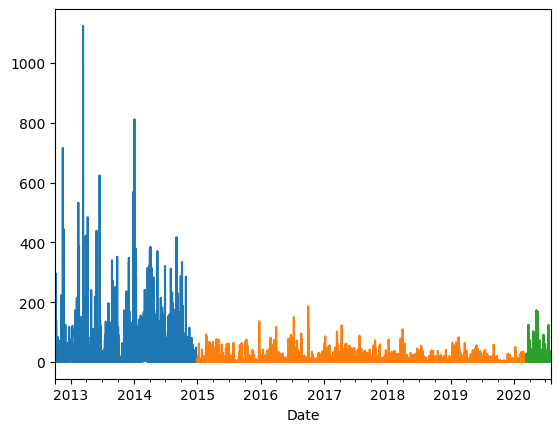

In [ ]:
df1_b2015=df1_s_w.loc[:'2014']
df1_bcov=df1_s_w.loc['2015':'2020-03-11']
df1_acov = df1_s_w.loc['2020-03-11':]
df1_b2015['SO2(ppb)-s1'].plot()
df1_bcov['SO2(ppb)-s1'].plot()
df1_acov['SO2(ppb)-s1'].plot()


In [ ]:
df1_s_w.columns

Index(['SO2(ppb)-s1', 'H2S(ppb)-s1', 'Temp-2m-st1', 'RH-20m-st1',
       'Wind Speed-45m-st1', 'Wind Dir-45m-st1', 'Vertical Wind Speed-20m-st1',
       'Vertical Wind Speed-45m-st1', 'Vertical Wind Speed-75m-st1', 'hour',
       'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

In [ ]:
# def trend_plot(df,value):
    
#     # Prepare data
#     df['year'] = [d.year for d in df.Date]
#     df['month'] = [d.strftime('%b') for d in df.Date]
#     years = df['year'].unique()

#     # Draw Plot
#     fig, axes = plt.subplots(1, 2, figsize=(14,6), dpi= 80)
#     sns.boxplot(x='year', y=value, data=df, ax=axes[0])
#     sns.pointplot(x='month', y=value, data=df.loc[~df.year.isin([2015, 2020]), :])

#     # Set Title
#     axes[0].set_title('Year-wise Box Plot \n(The Trend)', fontsize=18); 
#     axes[1].set_title('Month-wise Plot \n(The Seasonality)', fontsize=18)
#     plt.show()

In [ ]:
# df11 = df1_s_w.copy()
# df11['Date'] = df11.index
# for i in df11.columns:
#   trend_plot(df11,i)

In [ ]:
# for i in list(df1_s_w.columns):
#   plt.figure()
#   df1_s_w[i].plot(legend = True)

In [ ]:
df1_s_w

,SO2(ppb)-s1,H2S(ppb)-s1,Temp-2m-st1,RH-20m-st1,Wind Speed-45m-st1,Wind Dir-45m-st1,Vertical Wind Speed-20m-st1,Vertical Wind Speed-45m-st1,Vertical Wind Speed-75m-st1,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,
2012-10-01 00:00:00,0.000,10.325,5.052,64.724,14.696,246.236,-0.155,-0.281,-0.437,0,0,275,0.748634
2012-10-01 01:00:00,0.000,12.628,4.848,64.243,13.850,253.369,-0.130,-0.209,-0.437,1,0,275,0.748748
2012-10-01 02:00:00,0.000,139.065,4.960,66.263,9.309,323.738,-0.121,-0.135,0.025,2,0,275,0.748862
2012-10-01 03:00:00,0.000,86.431,4.523,70.661,10.695,239.559,-0.136,-0.045,-0.127,3,0,275,0.748975
2012-10-01 04:00:00,0.000,33.797,3.645,75.116,13.088,180.832,0.048,0.162,-0.095,4,0,275,0.749089
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,6.298,1.145,26.213,33.508,2.513,110.122,-0.020,0.192,0.040,19,4,213,8.581398
2020-07-31 20:00:00,5.352,1.540,23.857,35.895,6.536,53.032,0.370,0.533,0.373,20,4,213,8.581512
2020-07-31 21:00:00,2.725,1.784,22.435,41.615,10.890,53.923,0.341,0.495,0.034,21,4,213,8.581626


In [ ]:
#df1_s_w[ df1_s_w['Temp-2m-st1']<-40]

In [ ]:
# from google.colab import drive 
# drive.mount('/content/gdrive')

In [ ]:
# with open('gdrive/My Drive/Colab Notebooks/Stations_dec/df1_china.csv', 'w') as f:
#   df1_s_w.to_csv(f)

In [ ]:
df_st2=pd.read_csv('gdrive/My Drive/Colab Notebooks/Stations/4.6mb-2.csv',index_col='Date',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df2 = df_st2.copy()
df2.index.freq = 'H'

In [ ]:
print(df2.isna().sum())
df2.info()

SO2(ppb)-s2           35145
H2S(ppb)-s2           35170
THC(ppm)-s2           35138
NO(ppb)-s2           153639
NO2(ppb)-s2          153639
NOX(ppb)-s2          153639
O3(ppb)-s2           153639
PM2.5(ug/m3)-s2      152759
CH4(ppm)-s2           39291
NMHC(ppm)-s2          39291
Temp-2m-s2            30378
RH-s2                130250
Wind Speed-10m-s2     30215
Wind Dir-10m-s2       30215
dtype: int64
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 178991 entries, 2000-03-01 01:00:00 to 2020-07-31 23:00:00
Freq: H
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   SO2(ppb)-s2        143846 non-null  object 
 1   H2S(ppb)-s2        143821 non-null  object 
 2   THC(ppm)-s2        143853 non-null  object 
 3   NO(ppb)-s2         25352 non-null   object 
 4   NO2(ppb)-s2        25352 non-null   object 
 5   NOX(ppb)-s2        25352 non-null   object 
 6   O3(ppb)-s2         25352 non-null   object 
 

In [ ]:
for i in df2.columns:
  df2[i] = pd.to_numeric(df2[i], errors='coerce')

In [ ]:
df2.columns

Index(['SO2(ppb)-s2', 'H2S(ppb)-s2', 'THC(ppm)-s2', 'NO(ppb)-s2',
       'NO2(ppb)-s2', 'NOX(ppb)-s2', 'O3(ppb)-s2', 'PM2.5(ug/m3)-s2',
       'CH4(ppm)-s2', 'NMHC(ppm)-s2', 'Temp-2m-s2', 'RH-s2',
       'Wind Speed-10m-s2', 'Wind Dir-10m-s2'],
      dtype='object')

In [ ]:
# corr = df2.corr()
# mask = np.zeros(corr.shape, dtype=bool)
# mask[np.triu_indices(len(mask))] = True
# sns.set(font_scale=1)
# fig, ax = plt.subplots(figsize=(25,25))   
# ax = sns.heatmap(
#     corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sns.diverging_palette(20, 220, n=200),
#     square=True , ax = ax,annot=True,
#     # mask = mask
# )
# ax.set_xticklabels(
#     ax.get_xticklabels(),
#     rotation=90,
#     horizontalalignment='right'
# );

In [ ]:
# mpl.rcParams.update(mpl.rcParamsDefault)

In [ ]:
# for i in df2.columns:
#   print(i)
#   df2[i].plot(figsize = (10,10))
#   plt.show()

In [ ]:
df2 = df2.loc['2015' :]

In [ ]:
df2.columns

Index(['SO2(ppb)-s2', 'H2S(ppb)-s2', 'THC(ppm)-s2', 'NO(ppb)-s2',
       'NO2(ppb)-s2', 'NOX(ppb)-s2', 'O3(ppb)-s2', 'PM2.5(ug/m3)-s2',
       'CH4(ppm)-s2', 'NMHC(ppm)-s2', 'Temp-2m-s2', 'RH-s2',
       'Wind Speed-10m-s2', 'Wind Dir-10m-s2'],
      dtype='object')

In [ ]:
df2

,SO2(ppb)-s2,H2S(ppb)-s2,THC(ppm)-s2,NO(ppb)-s2,NO2(ppb)-s2,NOX(ppb)-s2,O3(ppb)-s2,PM2.5(ug/m3)-s2,CH4(ppm)-s2,NMHC(ppm)-s2,Temp-2m-s2,RH-s2,Wind Speed-10m-s2,Wind Dir-10m-s2
Date,,,,,,,,,,,,,,
2015-01-01 00:00:00,1.523,3.820,438.783,NaN,NaN,NaN,NaN,NaN,0.000,0.00,-13.362,NaN,8.620,4.234
2015-01-01 01:00:00,1.610,4.570,438.664,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-13.299,NaN,10.387,15.206
2015-01-01 02:00:00,NaN,4.432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-14.004,NaN,10.872,20.840
2015-01-01 03:00:00,1.806,NaN,441.908,NaN,NaN,NaN,NaN,NaN,0.000,0.00,-14.586,NaN,8.191,22.845
2015-01-01 04:00:00,1.730,6.721,444.600,NaN,NaN,NaN,NaN,NaN,0.000,0.00,-15.001,NaN,8.305,13.957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.835,0.562,2.038,0.070,2.722,2.792,42.141,13.451,2.038,0.00,26.288,41.769,6.101,64.368
2020-07-31 20:00:00,4.188,1.779,2.124,0.045,3.320,3.365,45.768,21.545,2.124,0.00,25.455,41.801,4.562,103.123
2020-07-31 21:00:00,4.886,0.992,2.176,0.000,2.689,2.442,31.622,17.754,2.176,0.00,23.482,51.751,4.673,74.429


In [ ]:
# for i in list(df2.columns):
#   plt.figure()
#   df2[i].plot(legend = True)

In [ ]:
df2.drop(columns = [ 'THC(ppm)-s2', 'NO(ppb)-s2',
       'NO2(ppb)-s2', 'NOX(ppb)-s2', 'O3(ppb)-s2', 'PM2.5(ug/m3)-s2',
       'CH4(ppm)-s2', 'NMHC(ppm)-s2'], inplace = True)

SO2(ppb)-s2


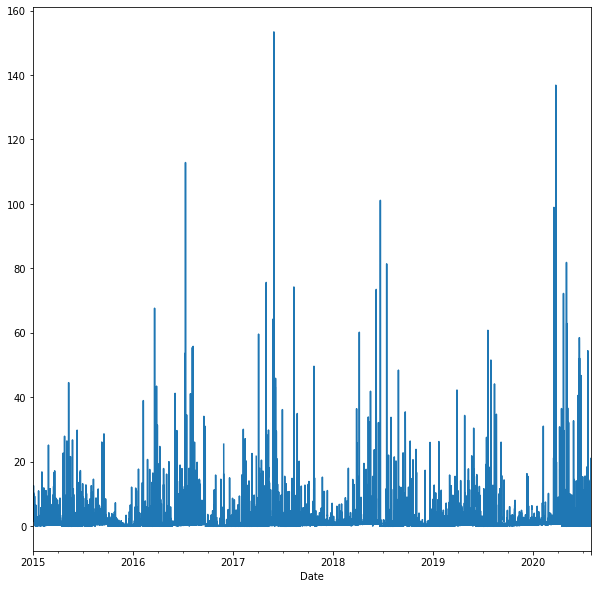

H2S(ppb)-s2


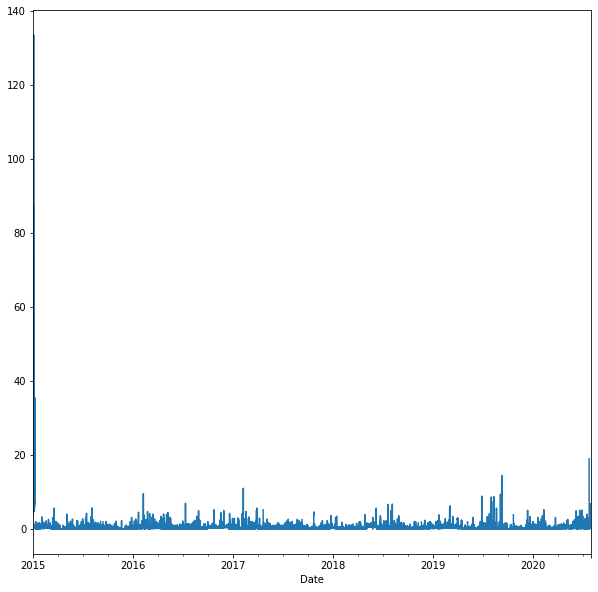

Temp-2m-s2


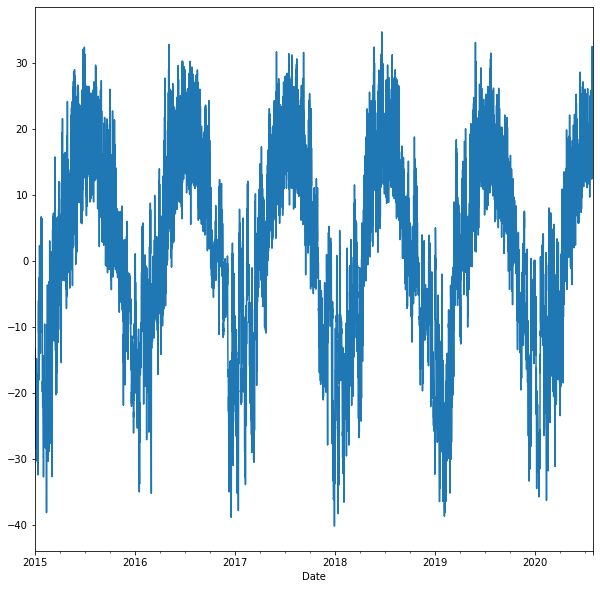

RH-s2


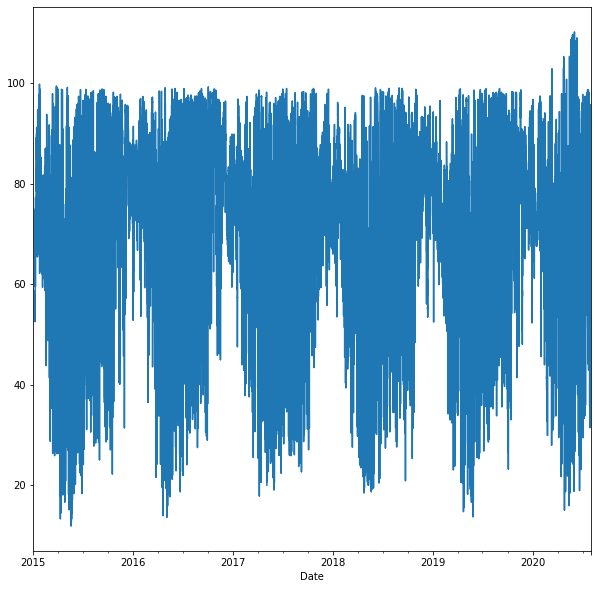

Wind Speed-10m-s2


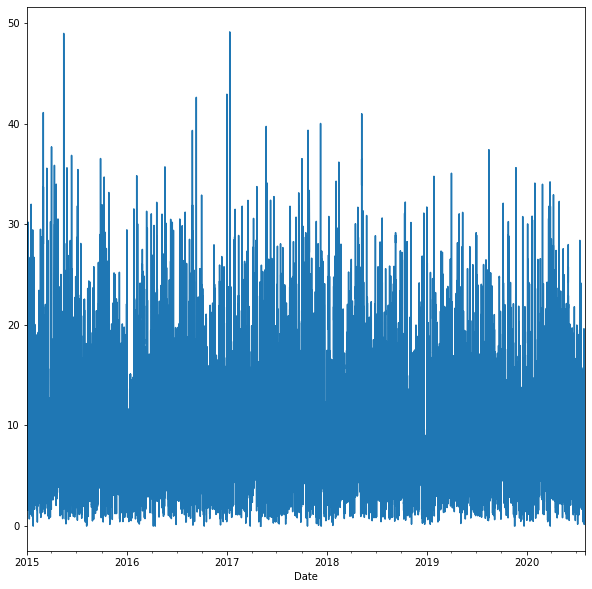

Wind Dir-10m-s2


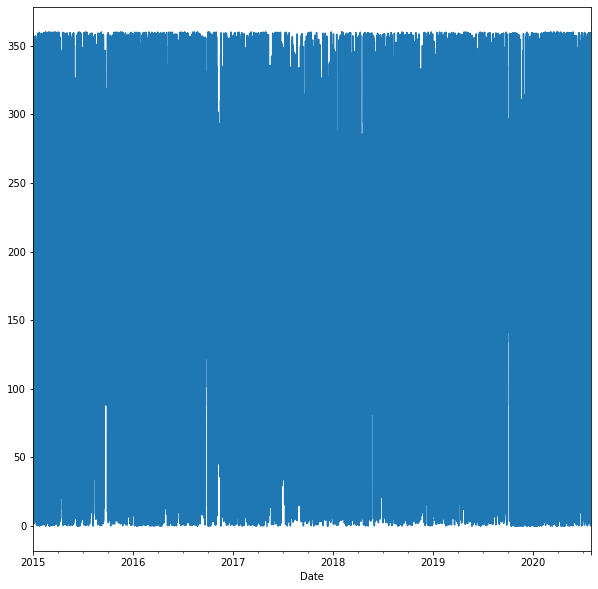

In [ ]:
for i in df2.columns:
  print(i)
  df2[i].plot(figsize = (10,10))
  plt.show()

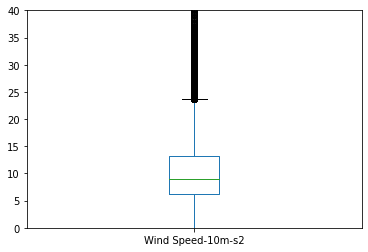

In [ ]:
df2['Wind Speed-10m-s2'].plot.box(ylim = [0,40])

In [ ]:
df2.sort_values(by =['Wind Speed-10m-s2'], ascending=False )

,SO2(ppb)-s2,H2S(ppb)-s2,Temp-2m-s2,RH-s2,Wind Speed-10m-s2,Wind Dir-10m-s2
Date,,,,,,
2017-01-11 12:00:00,0.09,0.079,-20.942,79.697,49.124,354.538
2015-05-15 20:00:00,0.00,0.011,15.497,52.554,48.973,352.812
2015-05-15 22:00:00,0.00,0.018,11.148,60.398,45.822,356.609
2015-05-16 00:00:00,0.00,0.093,7.612,67.071,45.403,356.589
2015-05-15 23:00:00,0.00,0.000,9.187,64.767,44.774,355.295
...,...,...,...,...,...,...
2018-06-27 09:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-07-12 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-07-12 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# #df2_s = wind(df2,'Wind Speed-10m-s2','Wind Dir-10m-s2')
# df2_s = df2
# df2_s_w = dater(df2_s)
# df2 = df2_s_w

In [ ]:
# df2_bcov = df2.loc['2015-feb':]

In [ ]:
df2.isna().sum()

SO2(ppb)-s2          2434
H2S(ppb)-s2          2447
Temp-2m-s2             40
RH-s2                 195
Wind Speed-10m-s2      17
Wind Dir-10m-s2        17
dtype: int64

In [ ]:
# df2['RH-s2'].loc[:'2015-01-08 11:00:00']=df1_s_w['RH-20m-st1'].loc[:'2015-01-08 11:00:00']

In [ ]:
# a = df2[df2['Temp-2m-s2'].isna()==True].index
# df2['Temp-2m-s2'].loc[a] = df1['Temp-2m-st1'].loc[a]

# b = df2[df2['RH-s2'].isna()==True].index
# df2['RH-s2'].loc[b] = df1['RH-20m-st1'].loc[b]

In [ ]:
df2.isna().sum()

SO2(ppb)-s2          2434
H2S(ppb)-s2          2447
Temp-2m-s2             40
RH-s2                 195
Wind Speed-10m-s2      17
Wind Dir-10m-s2        17
dtype: int64

In [ ]:
df22 = dater(df2)

In [ ]:
df22

,SO2(ppb)-s2,H2S(ppb)-s2,Temp-2m-s2,RH-s2,Wind Speed-10m-s2,Wind Dir-10m-s2,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,
2015-01-01 00:00:00,1.523,3.820,-13.362,NaN,8.620,4.234,0,3,1,3.000000
2015-01-01 01:00:00,1.610,4.570,-13.299,NaN,10.387,15.206,1,3,1,3.000114
2015-01-01 02:00:00,NaN,4.432,-14.004,NaN,10.872,20.840,2,3,1,3.000228
2015-01-01 03:00:00,1.806,NaN,-14.586,NaN,8.191,22.845,3,3,1,3.000342
2015-01-01 04:00:00,1.730,6.721,-15.001,NaN,8.305,13.957,4,3,1,3.000455
...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.835,0.562,26.288,41.769,6.101,64.368,19,4,213,8.581398
2020-07-31 20:00:00,4.188,1.779,25.455,41.801,4.562,103.123,20,4,213,8.581512
2020-07-31 21:00:00,4.886,0.992,23.482,51.751,4.673,74.429,21,4,213,8.581626


In [ ]:
df22.isna().sum()

SO2(ppb)-s2          2434
H2S(ppb)-s2          2447
Temp-2m-s2             40
RH-s2                 195
Wind Speed-10m-s2      17
Wind Dir-10m-s2        17
hour                    0
dayofweek_num           0
Day-year                0
trend                   0
dtype: int64

SO2(ppb)-s2


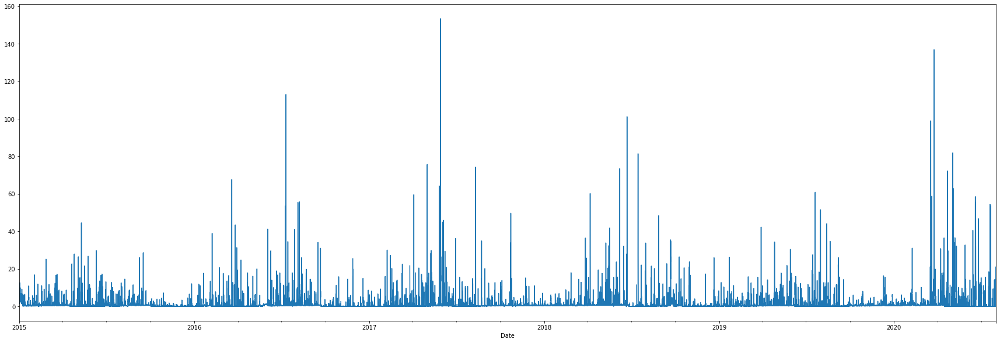

H2S(ppb)-s2


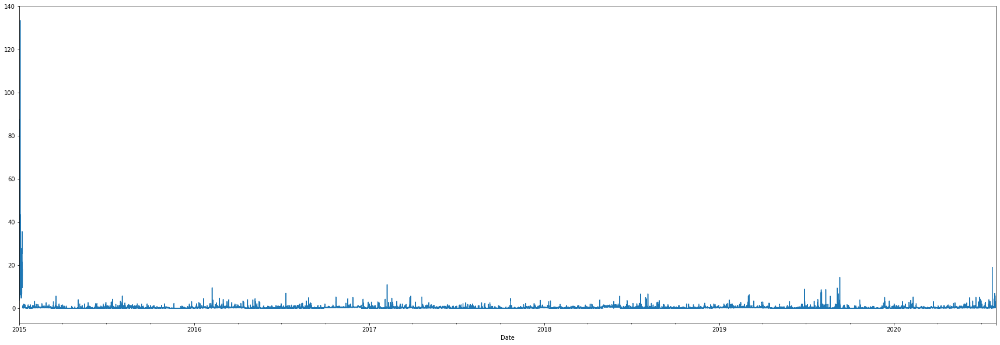

Temp-2m-s2


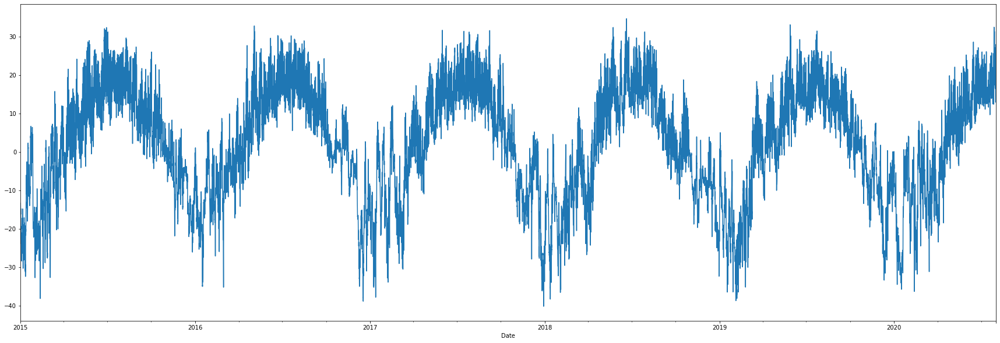

RH-s2


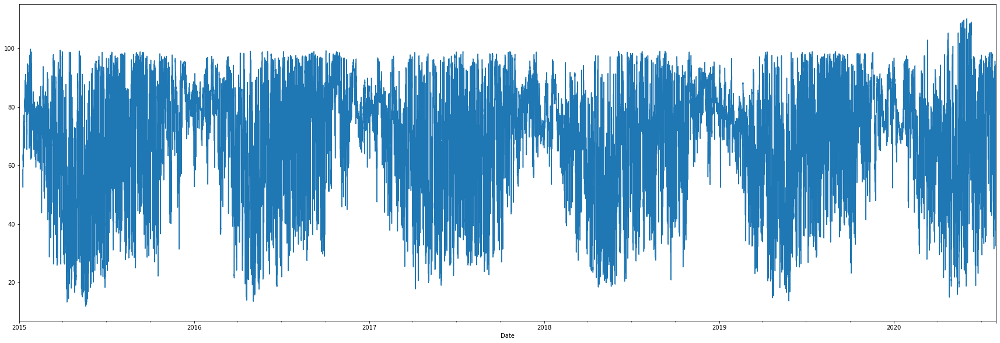

Wind Speed-10m-s2


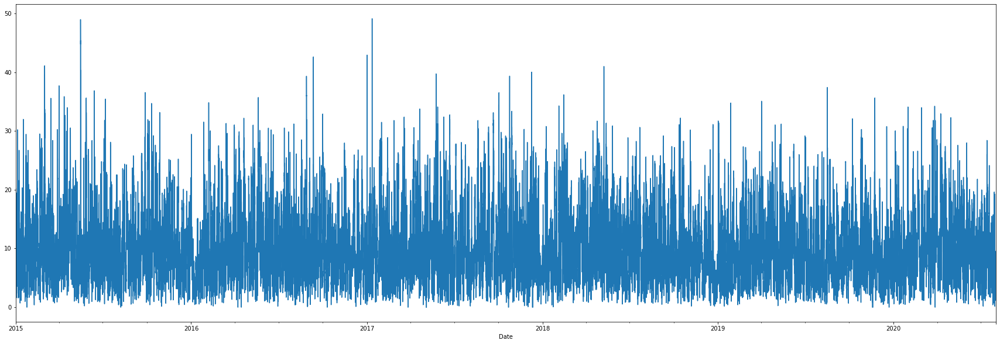

Wind Dir-10m-s2


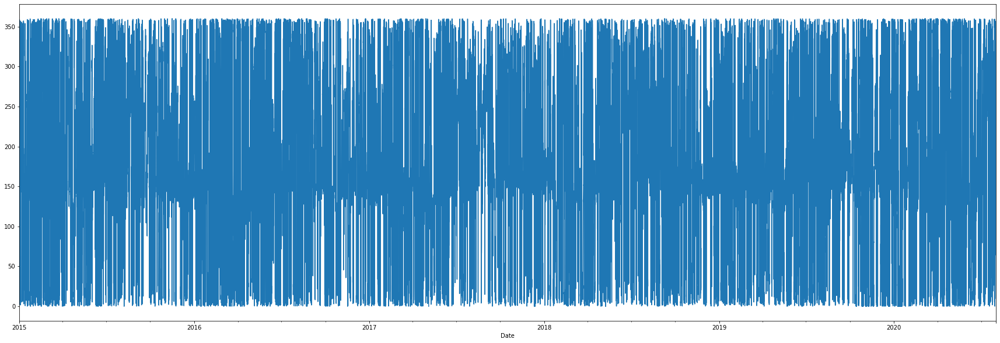

hour


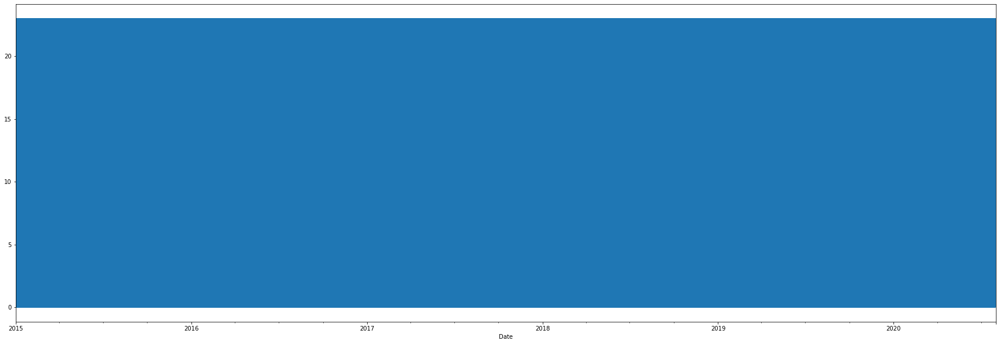

dayofweek_num


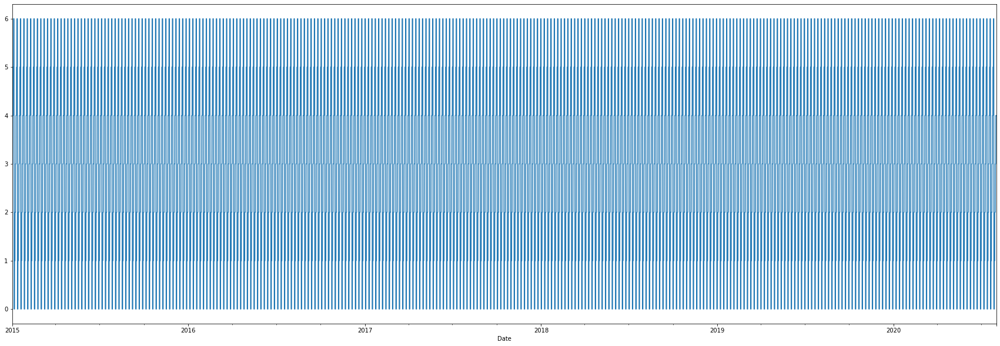

Day-year


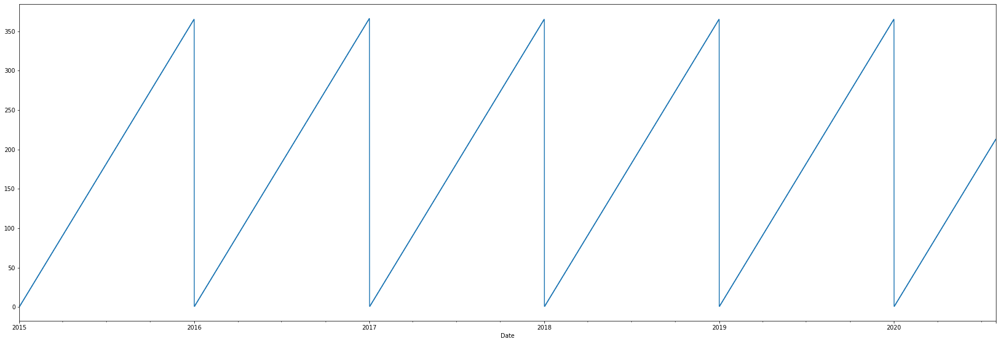

trend


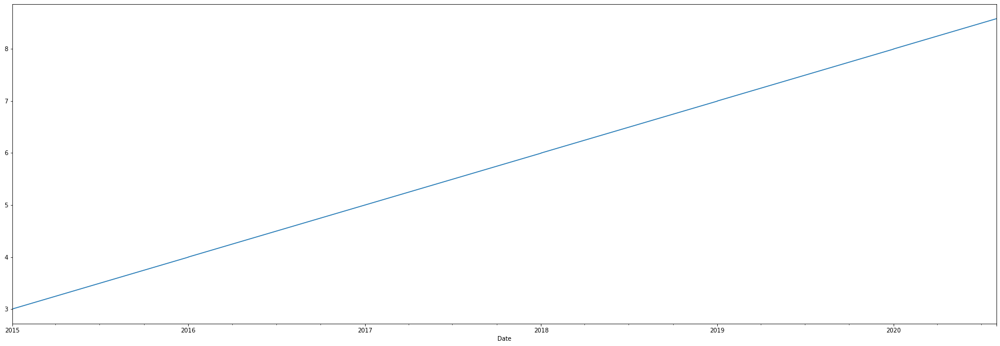

In [ ]:
for i in df22.columns:
  print(i)
  df22[i].plot(figsize = (30,10))
  plt.show()

In [ ]:
# df2[df2['SO2(ppb)-s2'].isna()==True].loc['2016']

In [ ]:
# df2[df2['SO2(ppb)-s2'].isna()==True]

In [ ]:
# for i in list(df2_bcov.columns):
#   plt.figure()
#   df2_bcov[i].plot(legend = True)

In [ ]:
print(df22.isna().sum())

SO2(ppb)-s2          2434
H2S(ppb)-s2          2447
Temp-2m-s2             40
RH-s2                 195
Wind Speed-10m-s2      17
Wind Dir-10m-s2        17
hour                    0
dayofweek_num           0
Day-year                0
trend                   0
dtype: int64


In [ ]:
df222=df22.loc['2015-feb':]

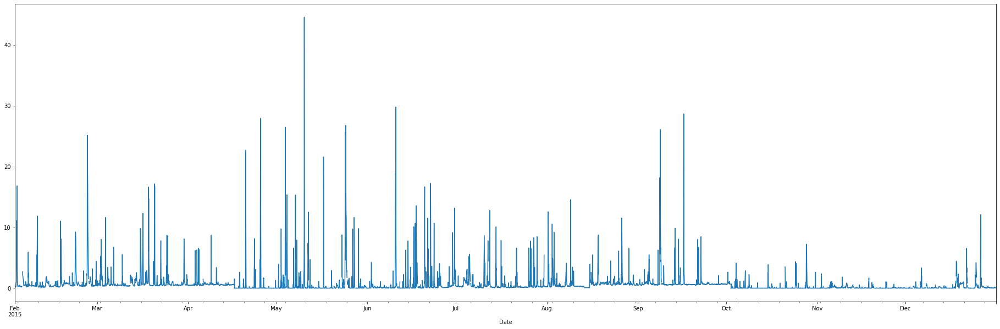

In [ ]:
df222['SO2(ppb)-s2'].loc['2015'].plot(figsize = (32,10))

In [ ]:
df222[df222['SO2(ppb)-s2'].isna()==True]

,SO2(ppb)-s2,H2S(ppb)-s2,Temp-2m-s2,RH-s2,Wind Speed-10m-s2,Wind Dir-10m-s2,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,
2015-02-01 03:00:00,NaN,0.385,-28.176,76.848,9.068,164.817,3,6,32,3.085041
2015-02-02 04:00:00,NaN,0.194,-20.272,76.199,11.499,248.635,4,0,33,3.087887
2015-02-03 05:00:00,NaN,0.487,-22.482,79.462,5.027,344.530,5,1,34,3.090733
2015-02-03 11:00:00,NaN,0.324,-23.833,70.492,7.068,5.154,11,1,34,3.091416
2015-02-03 12:00:00,NaN,0.212,-23.088,66.775,9.199,355.407,12,1,34,3.091530
...,...,...,...,...,...,...,...,...,...,...
2020-07-27 02:00:00,NaN,0.831,14.235,84.012,7.094,151.171,2,0,209,8.568534
2020-07-28 03:00:00,NaN,0.416,18.641,68.882,6.877,149.023,3,1,210,8.571380
2020-07-29 05:00:00,NaN,1.452,17.881,91.133,4.728,281.270,5,2,211,8.574340


In [ ]:
df222=df222.interpolate(method='time')
print(df222.isna().sum())

SO2(ppb)-s2          0
H2S(ppb)-s2          0
Temp-2m-s2           0
RH-s2                0
Wind Speed-10m-s2    0
Wind Dir-10m-s2      0
hour                 0
dayofweek_num        0
Day-year             0
trend                0
dtype: int64


SO2(ppb)-s2


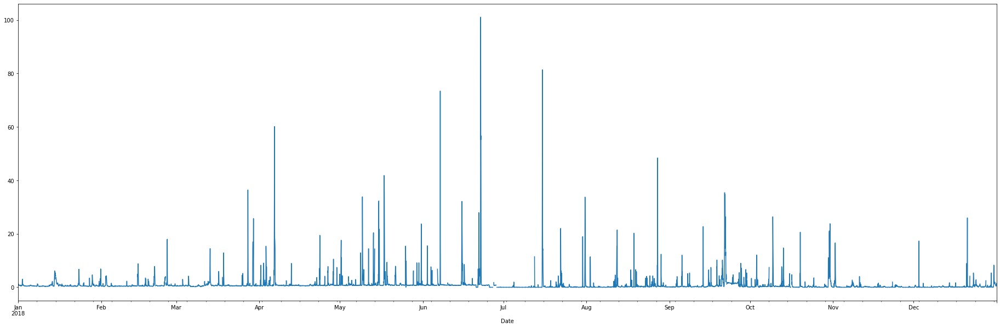

H2S(ppb)-s2


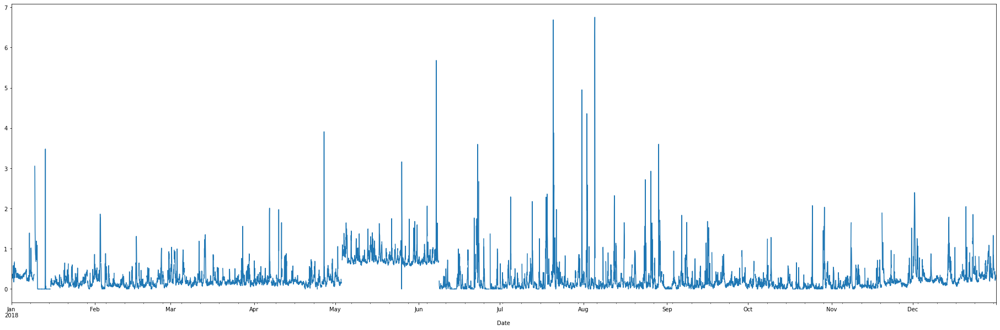

Temp-2m-s2


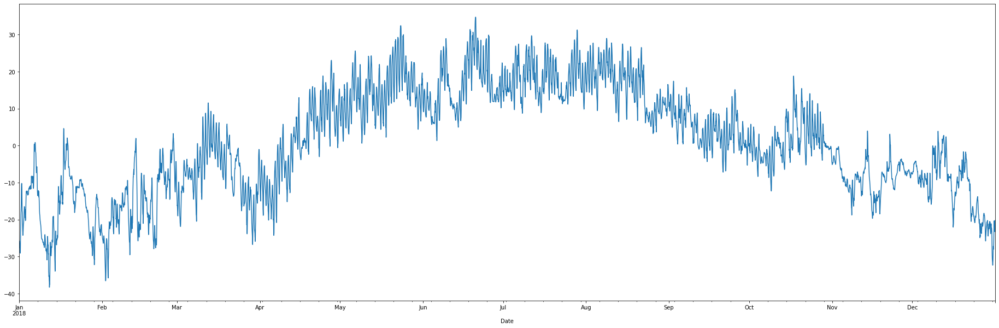

RH-s2


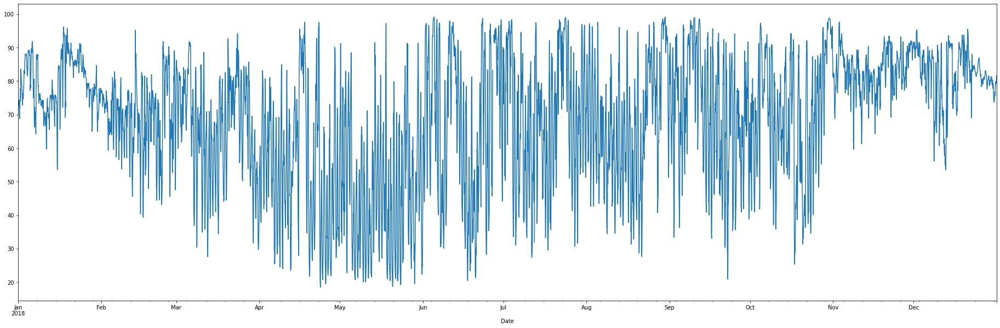

Wind Speed-10m-s2


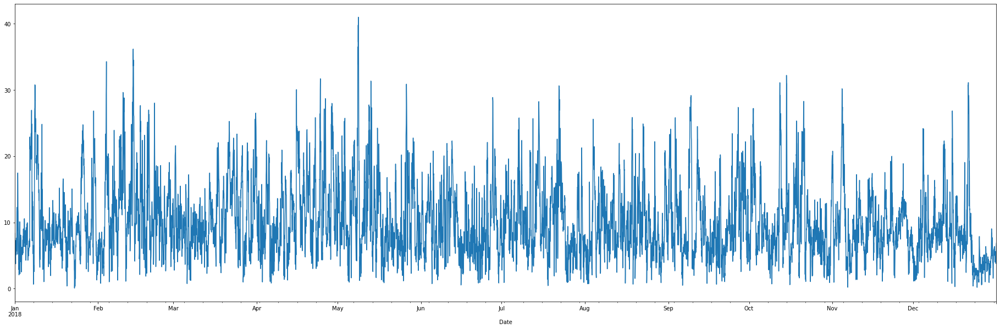

Wind Dir-10m-s2


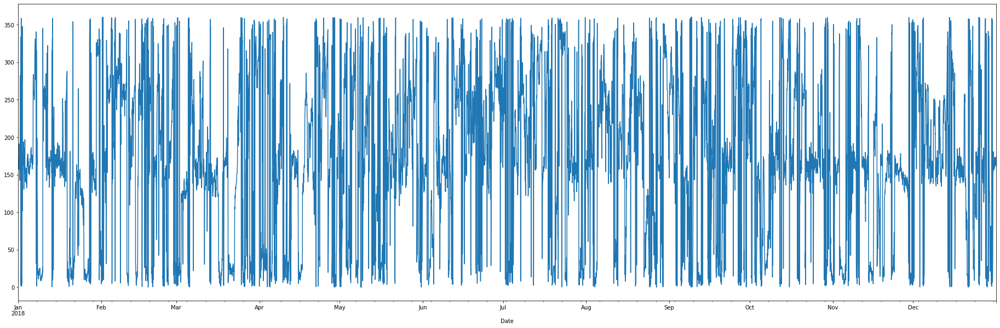

hour


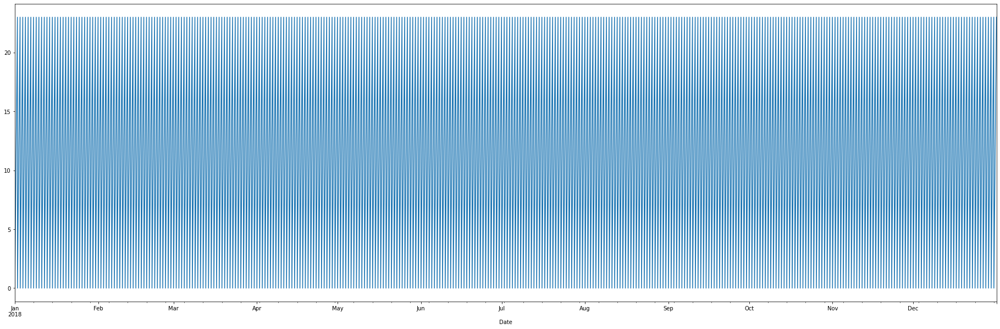

dayofweek_num


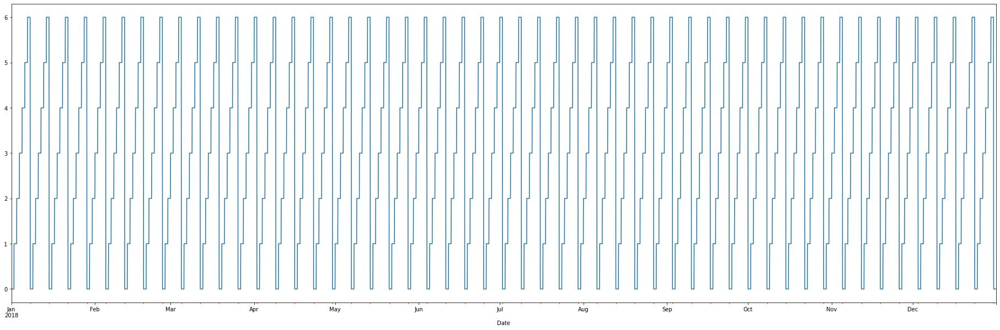

Day-year


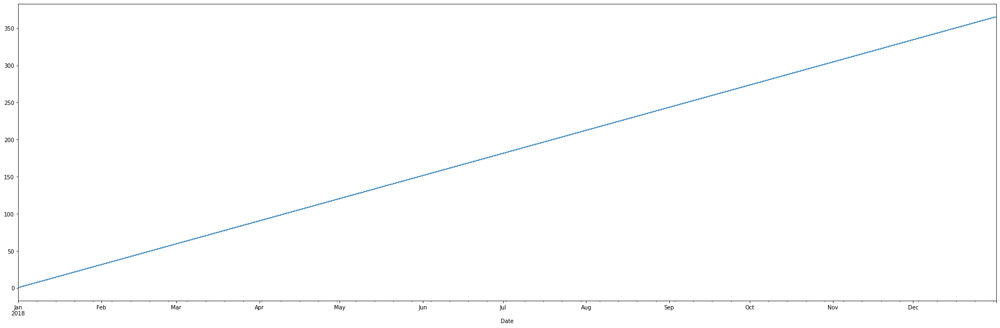

trend


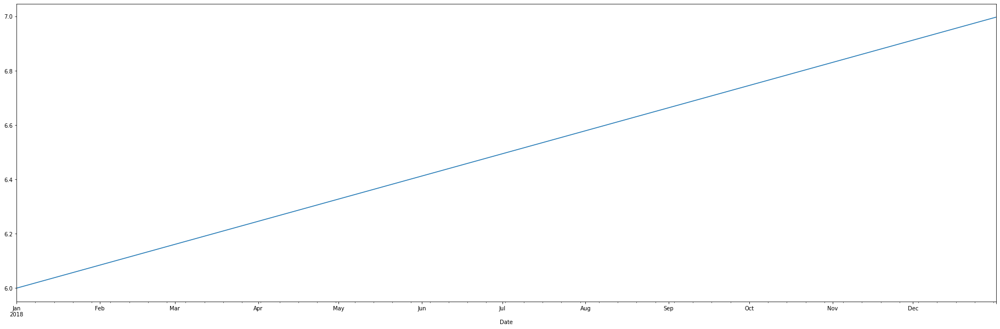

In [ ]:
 for i in df22.columns:
   print(i) 
   df22[i].loc['2018'].plot(figsize = (32,10))
   plt.show()

SO2(ppb)-s2


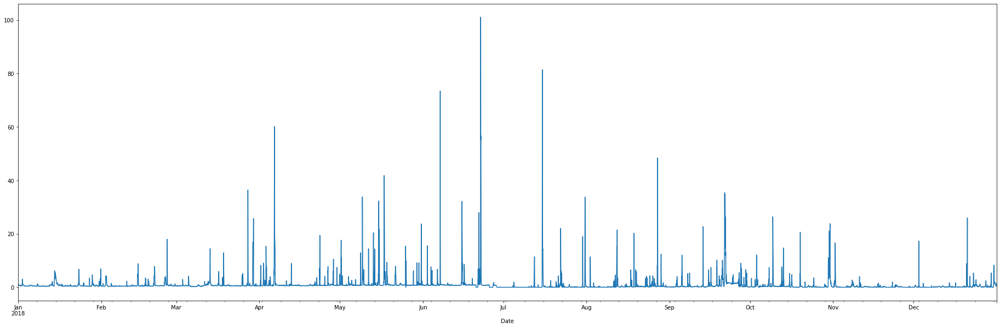

H2S(ppb)-s2


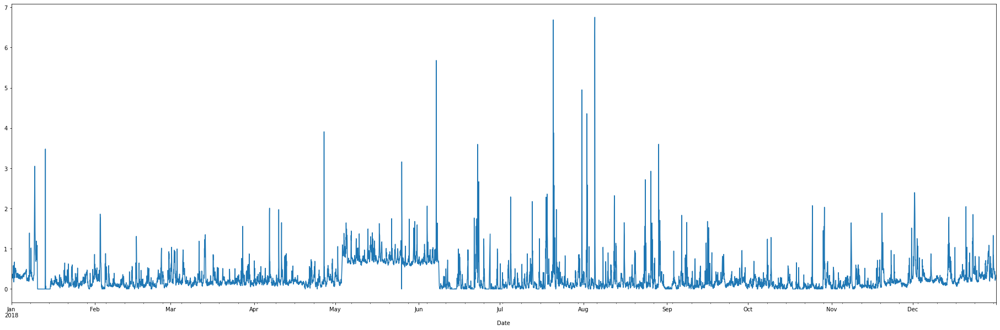

Temp-2m-s2


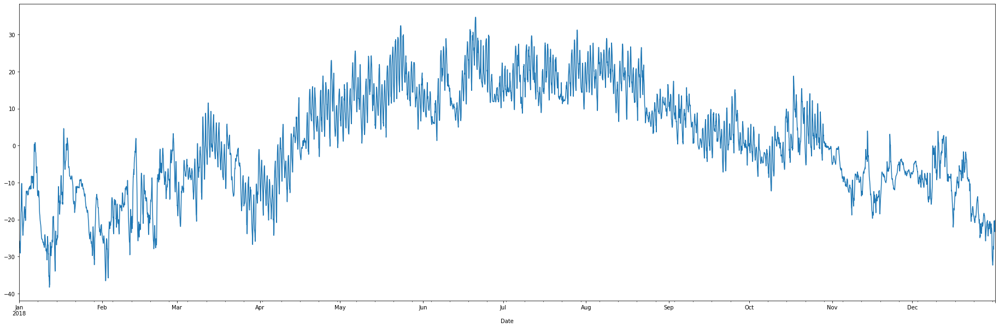

RH-s2


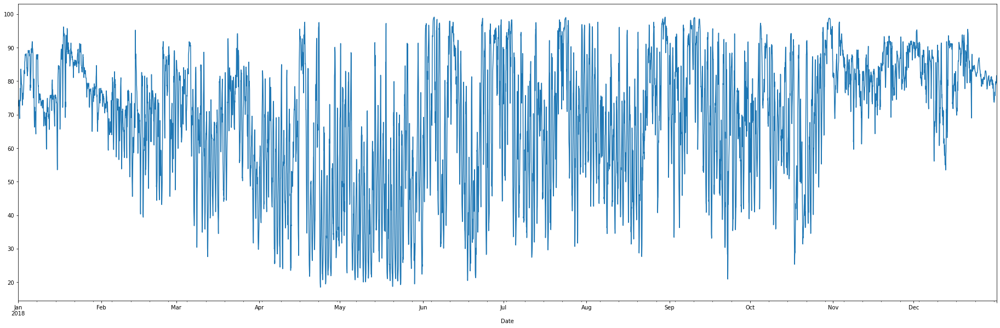

Wind Speed-10m-s2


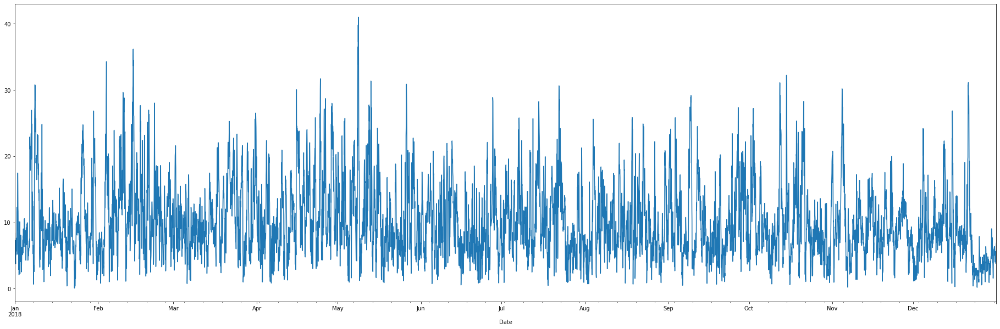

Wind Dir-10m-s2


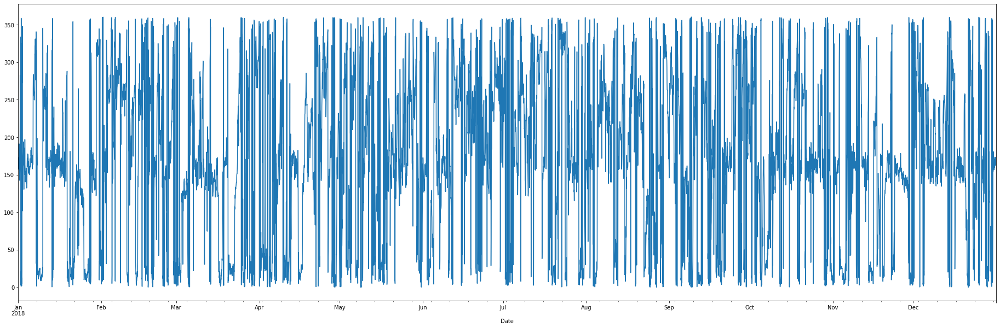

hour


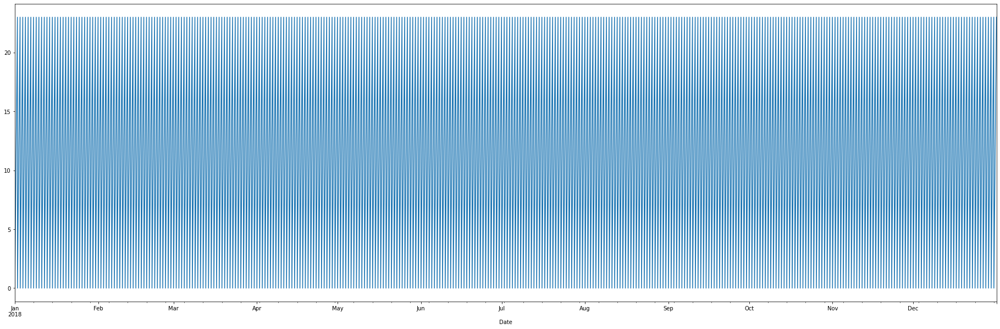

dayofweek_num


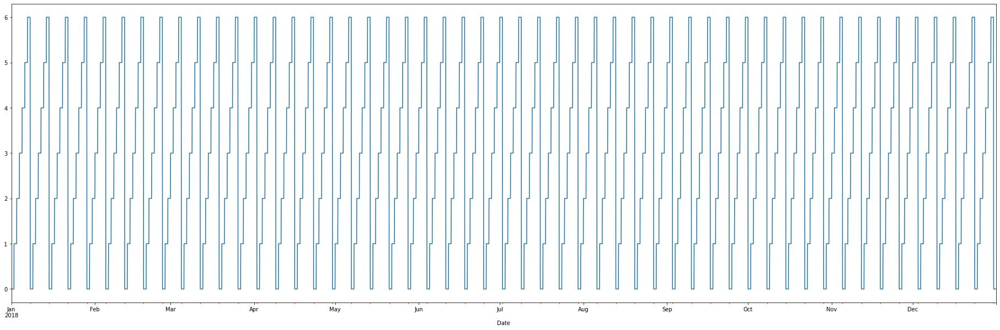

Day-year


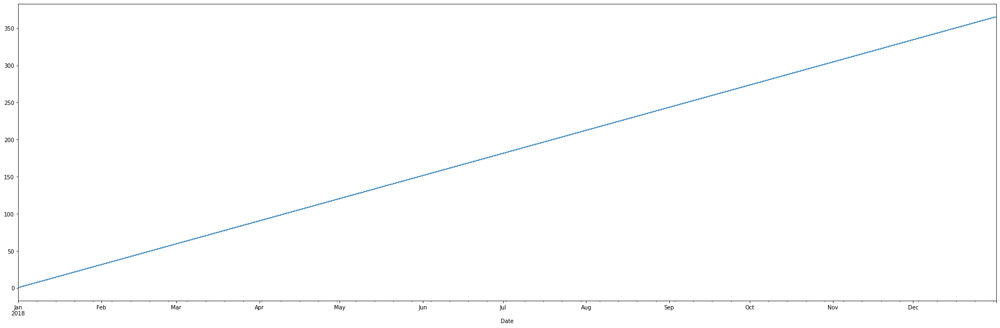

trend


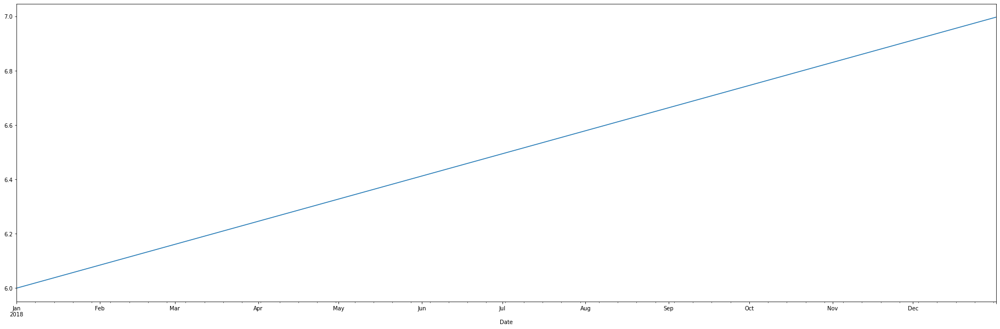

In [ ]:
 for i in df222.columns:
   print(i) 
   df222[i].loc['2018'].plot(figsize = (32,10))
   plt.show()

In [ ]:
df222=df222

,SO2(ppb)-s2,H2S(ppb)-s2,Temp-2m-s2,RH-s2,Wind Speed-10m-s2,Wind Dir-10m-s2,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,
2015-01-01 00:00:00,1.523,3.8200,-13.362,NaN,8.620,4.234,0,3,1,3.000000
2015-01-01 01:00:00,1.610,4.5700,-13.299,NaN,10.387,15.206,1,3,1,3.000114
2015-01-01 02:00:00,1.708,4.4320,-14.004,NaN,10.872,20.840,2,3,1,3.000228
2015-01-01 03:00:00,1.806,5.5765,-14.586,NaN,8.191,22.845,3,3,1,3.000342
2015-01-01 04:00:00,1.730,6.7210,-15.001,NaN,8.305,13.957,4,3,1,3.000455
...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.835,0.5620,26.288,41.769,6.101,64.368,19,4,213,8.581398
2020-07-31 20:00:00,4.188,1.7790,25.455,41.801,4.562,103.123,20,4,213,8.581512
2020-07-31 21:00:00,4.886,0.9920,23.482,51.751,4.673,74.429,21,4,213,8.581626


In [ ]:
# df2.isna().sum()

In [ ]:
# df22=df2_bcov.copy()
# for i in df22.columns:
#   print(i)
#   fig = plt.figure()
#   density_scatter(df22[i],df22['SO2(ppb)-s2'])
#   plt.show()

In [ ]:
# df22 = df2_bcov.copy()
# df22['Date'] = df22.index
# for i in df22.columns:
#   trend_plot(df22,i)

In [ ]:
# df2_bcov

In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Stations_dec/df2_covid_2015.csv', 'w') as f:
  df222.to_csv(f)


In [ ]:
##########################################################DF2
##############################################

In [ ]:
df_st3=pd.read_csv('gdrive/My Drive/Colab Notebooks/Stations/4.2mb-3.csv',index_col='Date',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df3 = df_st3.copy()

In [ ]:
for i in df3.columns:
  df3[i] = pd.to_numeric(df3[i], errors='coerce')

In [ ]:
print(df3.isna().sum())
#df1['RH-2m-st1'].resample('M').mean().loc['2013':].plot(figsize = (12,10))


SO2(ppb)-s3           35165
H2S(ppb)-s3           35484
THC(ppm)-s3           35300
NMHC(ppm)-s3          51164
CH4(ppm)-s3           51164
Temp-2m-s3            29657
RH-s3                111215
Wind Speed-10m-s3     29647
Wind Dir-10m-s3       29647
dtype: int64


In [ ]:
# for i in list(df3.columns):
#   plt.figure()
#   df3[i].plot(legend = True)

In [ ]:
df3.columns

Index(['SO2(ppb)-s3', 'H2S(ppb)-s3', 'THC(ppm)-s3', 'NMHC(ppm)-s3',
       'CH4(ppm)-s3', 'Temp-2m-s3', 'RH-s3', 'Wind Speed-10m-s3',
       'Wind Dir-10m-s3'],
      dtype='object')

In [ ]:
df3.drop(columns = [ 
                    #'H2S(ppb)-s3',
                    'THC(ppm)-s3', 'NMHC(ppm)-s3',
       'CH4(ppm)-s3'], inplace = True)

In [ ]:
df3 = df3.loc['aug-2007':]

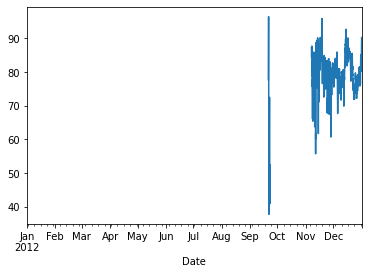

In [ ]:
df3.loc['2012']['RH-s3'].plot()

In [ ]:
df3 = df3.loc['2013':]

In [ ]:
print(df3.isna().sum())
#df1['RH-2m-st1'].resample('M').mean().loc['2013':].plot(figsize = (12,10))


SO2(ppb)-s3          3261
H2S(ppb)-s3          3602
Temp-2m-s3             47
RH-s3                  41
Wind Speed-10m-s3      41
Wind Dir-10m-s3        41
dtype: int64


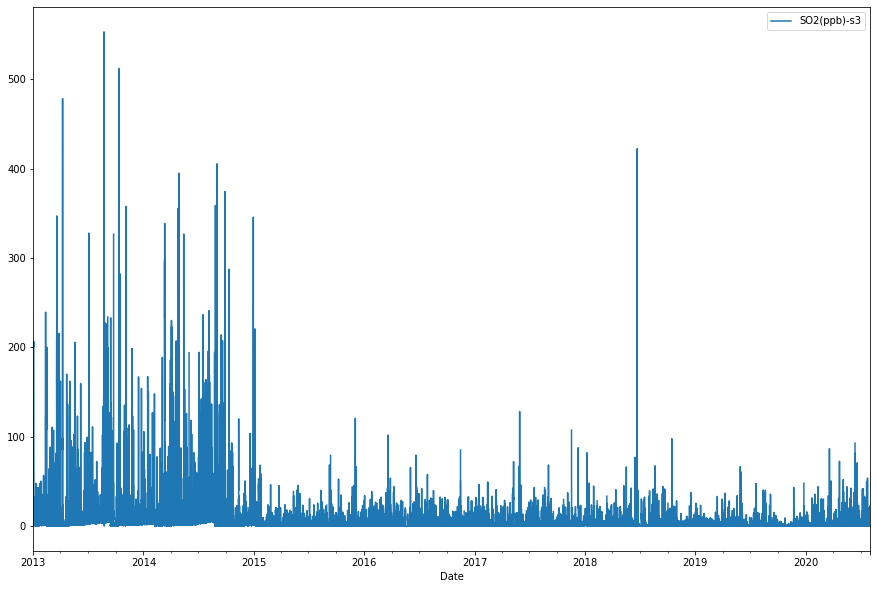

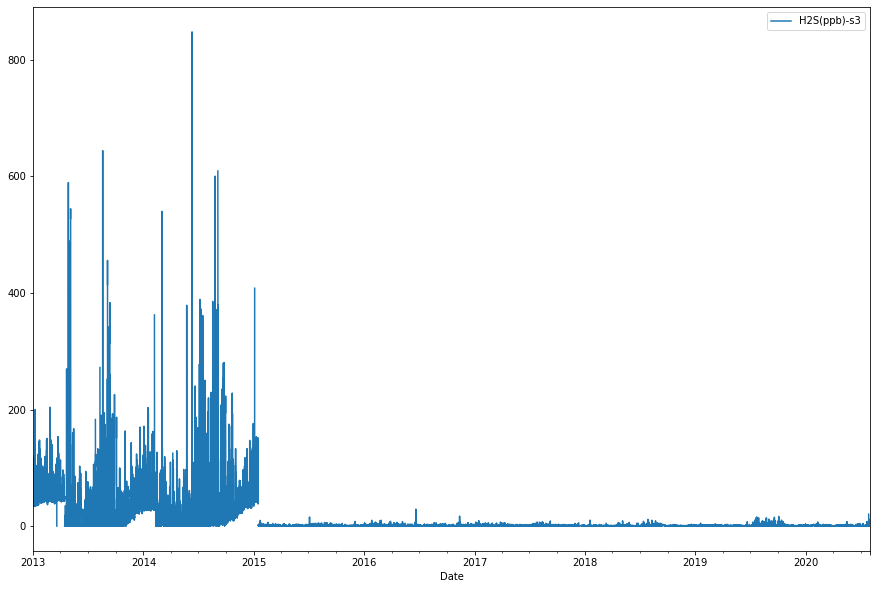

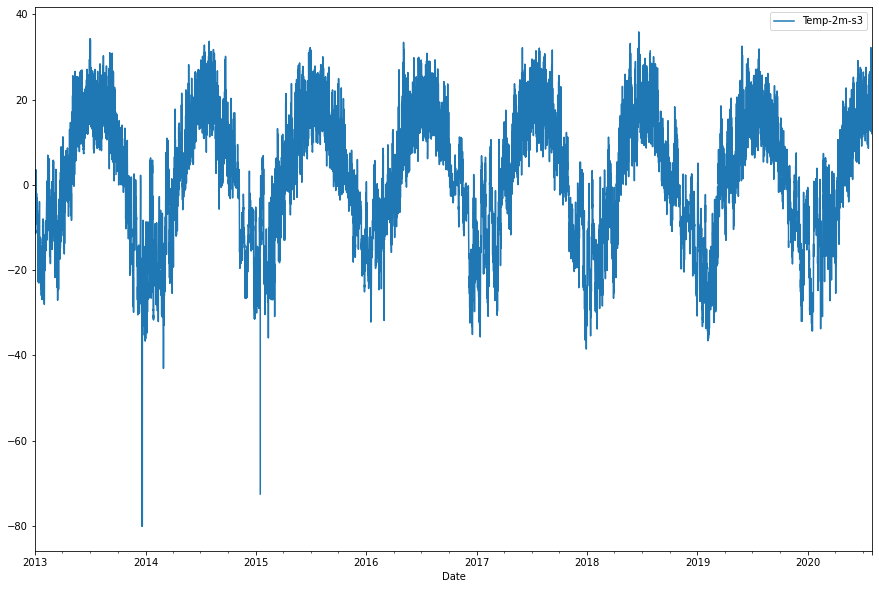

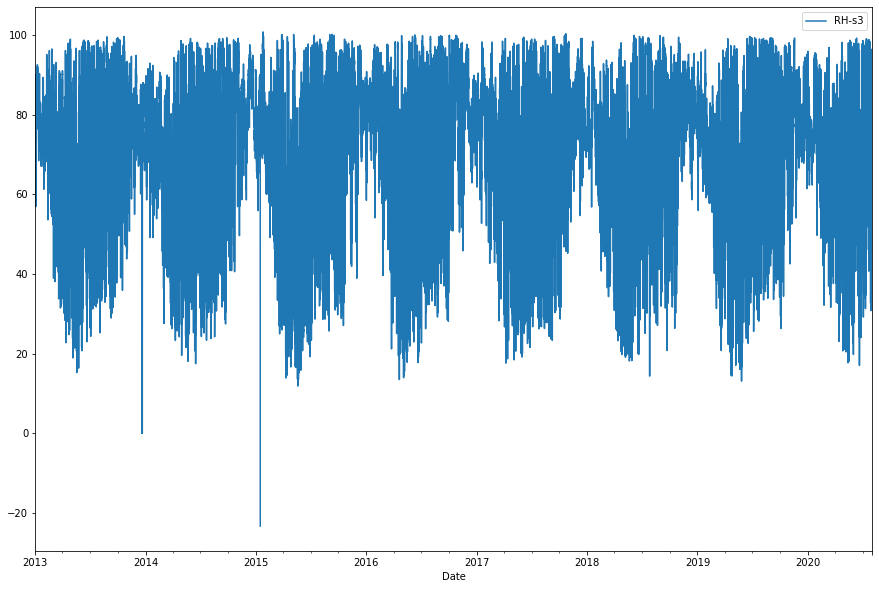

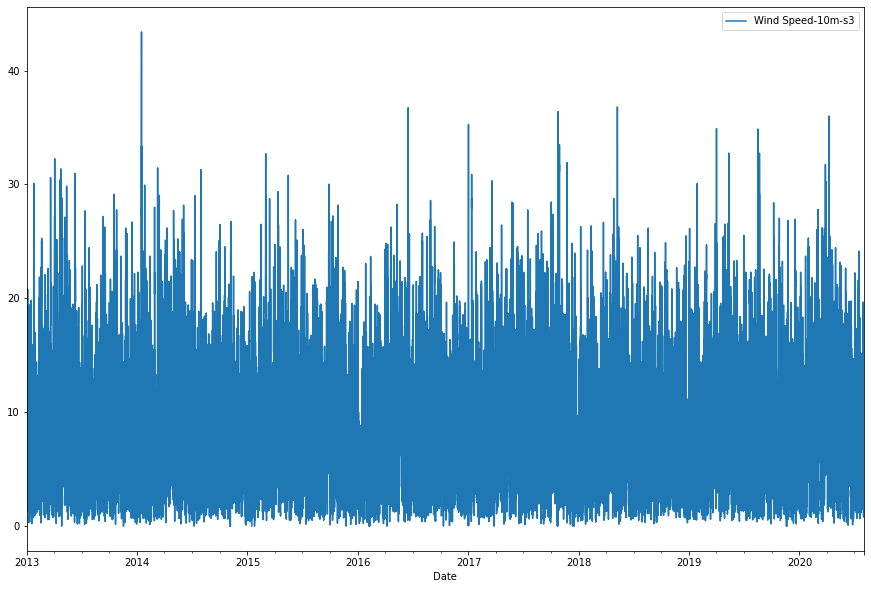

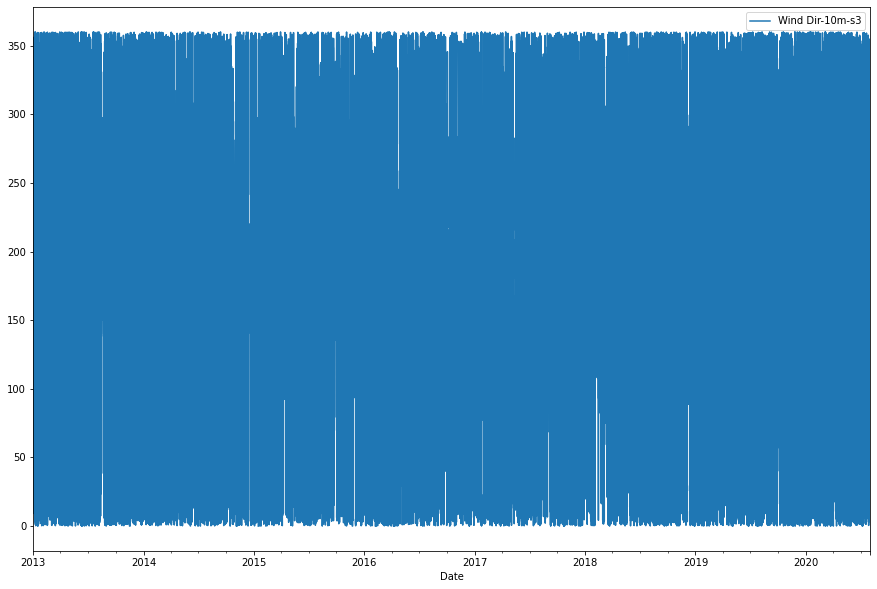

In [ ]:
for i in list(df3.columns):
  plt.figure(figsize = (15,10))
  df3[i].plot(legend = True)

In [ ]:
df3.columns

Index(['SO2(ppb)-s3', 'H2S(ppb)-s3', 'Temp-2m-s3', 'RH-s3',
       'Wind Speed-10m-s3', 'Wind Dir-10m-s3'],
      dtype='object')

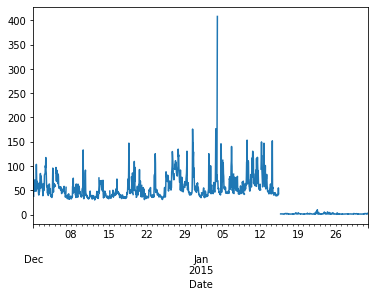

In [ ]:
df3['H2S(ppb)-s3'].loc['dec-2014':'jan-2015'].plot()

In [ ]:
df3['Temp-2m-s3'][df3['Temp-2m-s3'] <-40]= np.nan

In [ ]:
df3['RH-s3'][df3['RH-s3'] <3]= np.nan

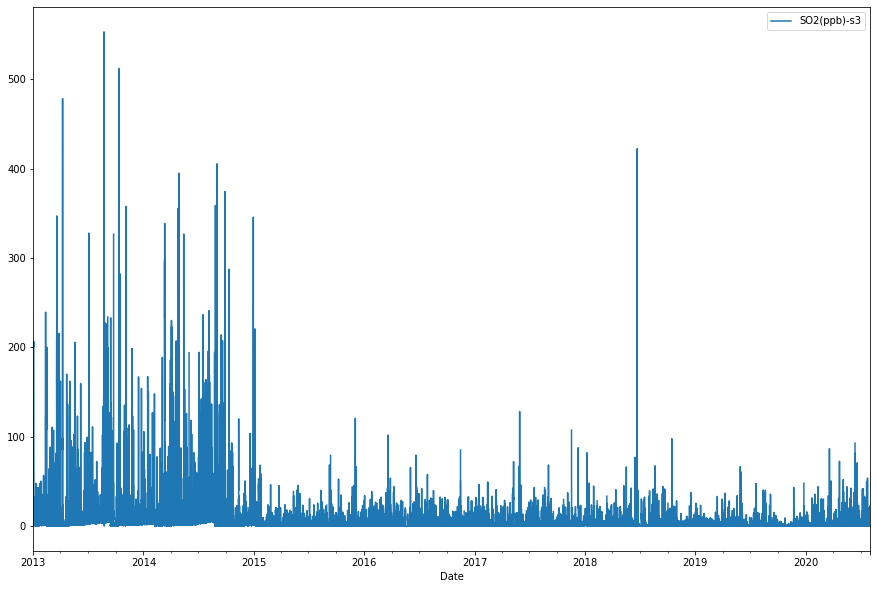

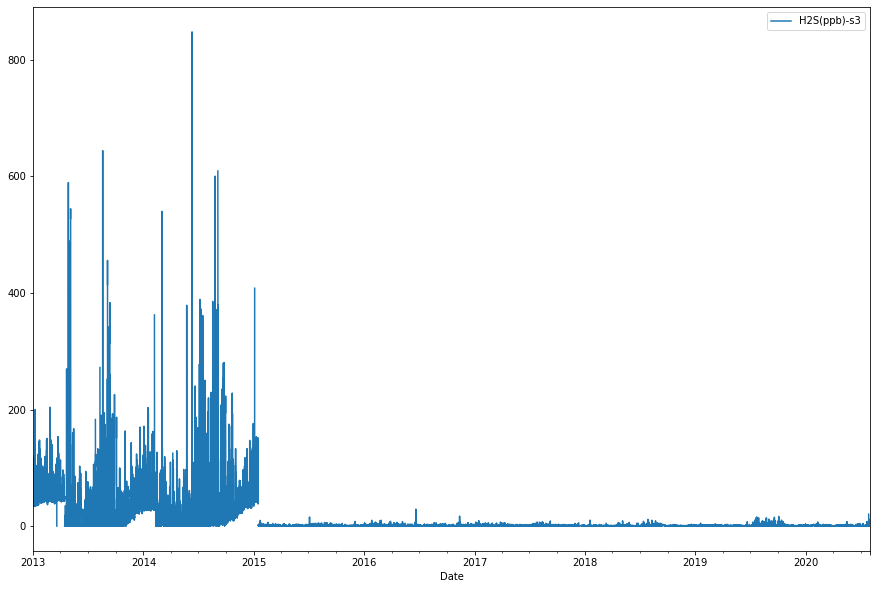

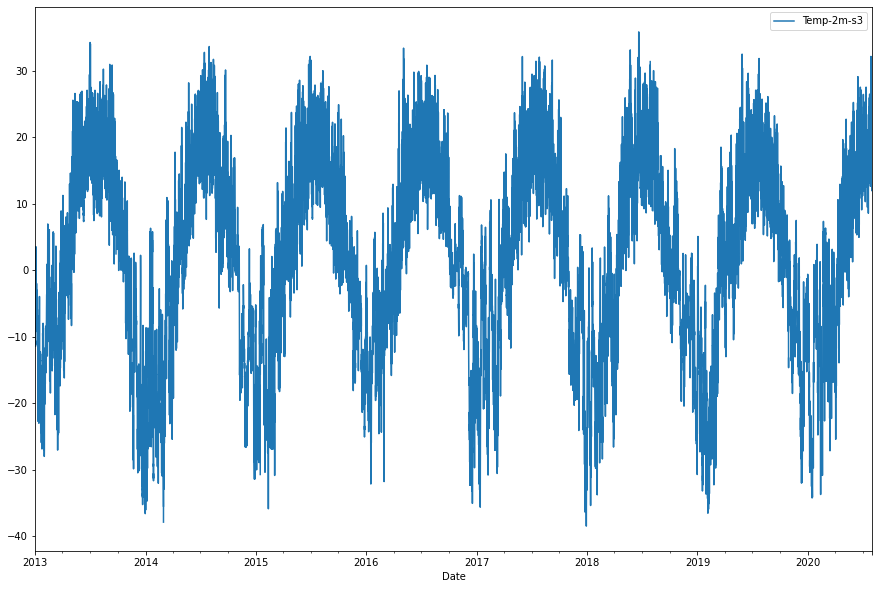

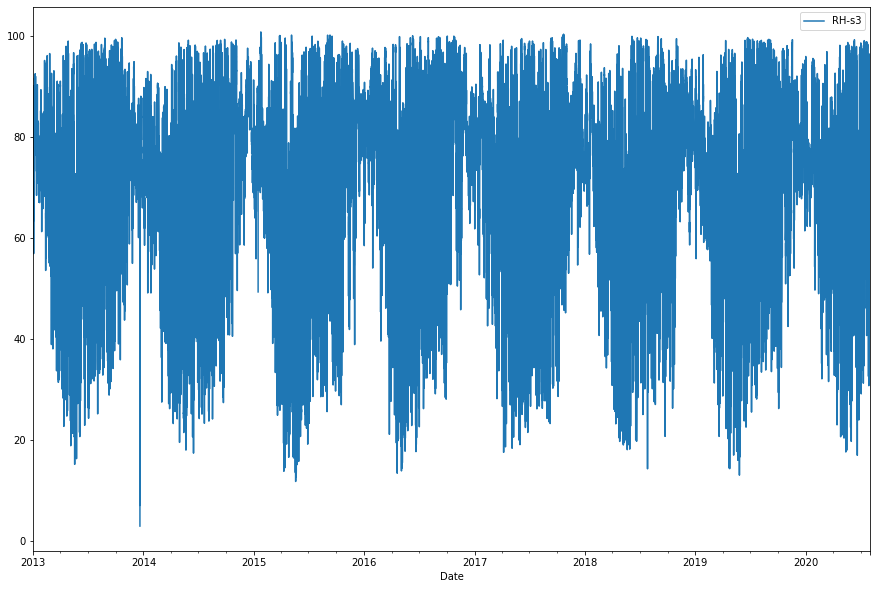

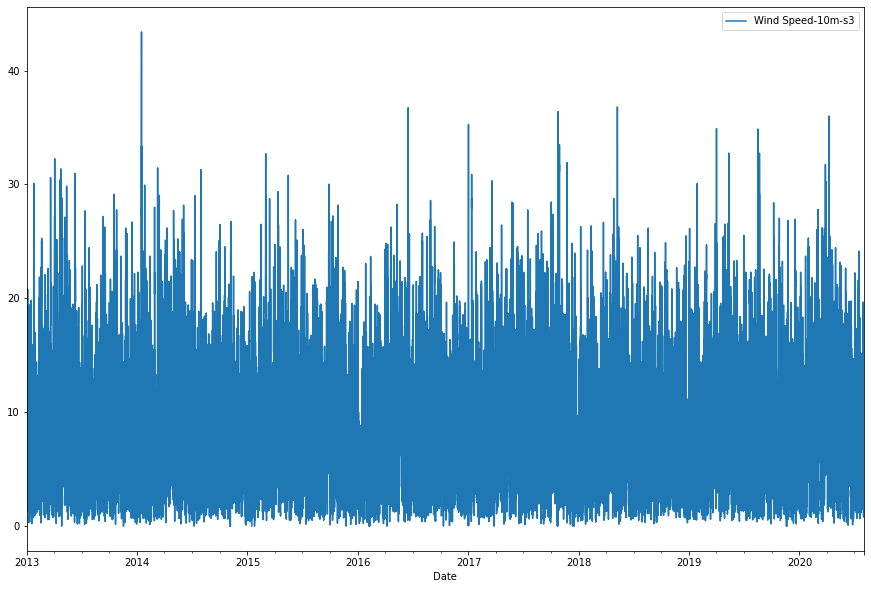

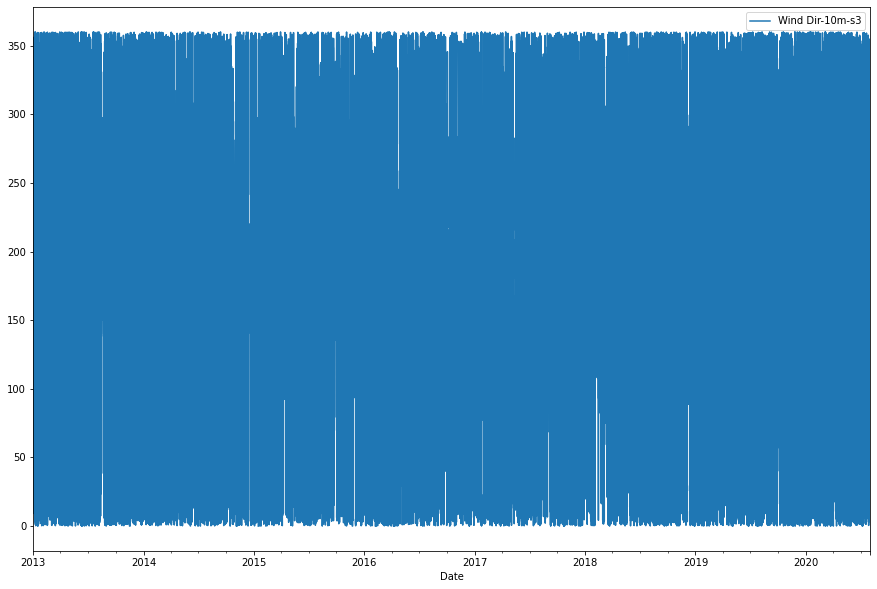

In [ ]:
for i in list(df3.columns):
  plt.figure(figsize = (15,10))
  df3[i].plot(legend = True)

In [ ]:
df3[df3['SO2(ppb)-s3'].isna()==True].iloc[1000:1030]

,SO2(ppb)-s3,H2S(ppb)-s3,Temp-2m-s3,RH-s3,Wind Speed-10m-s3,Wind Dir-10m-s3
Date,,,,,,
2015-03-21 03:00:00,NaN,0.000,-16.043,56.712,10.455,5.768
2015-03-22 04:00:00,NaN,0.060,-6.123,54.112,7.545,164.171
2015-03-23 05:00:00,NaN,2.894,-4.380,95.575,3.107,153.743
2015-03-24 06:00:00,NaN,0.000,-4.979,84.142,9.267,6.097
2015-03-25 01:00:00,NaN,0.108,-10.505,88.000,2.331,248.195
2015-03-26 02:00:00,NaN,0.495,-3.699,85.583,5.051,142.999
2015-03-27 03:00:00,NaN,0.034,1.537,99.200,4.300,176.067
2015-03-28 04:00:00,NaN,0.149,1.936,99.658,0.565,98.240
2015-03-29 05:00:00,NaN,0.002,-0.772,87.550,7.225,214.544


In [ ]:
df3=df3.interpolate(method='time')
print(df3.isna().sum())
len(df3)

SO2(ppb)-s3          0
H2S(ppb)-s3          0
Temp-2m-s3           0
RH-s3                0
Wind Speed-10m-s3    0
Wind Dir-10m-s3      0
dtype: int64


66456

In [ ]:
# for i in list(df3.columns):
#   plt.figure()
#   df3[i].plot(legend = True)

In [ ]:
df3.columns

Index(['SO2(ppb)-s3', 'H2S(ppb)-s3', 'Temp-2m-s3', 'RH-s3',
       'Wind Speed-10m-s3', 'Wind Dir-10m-s3'],
      dtype='object')

In [ ]:
df3_s = df3
df3_s_w = dater(df3_s)
df3 = df3_s_w

In [ ]:
# for i in df3.columns:
#   print(i)
#   fig = plt.figure()
#   density_scatter(df3[i],df3['SO2(ppb)-s3'])
#   plt.show()

In [ ]:
# df33 = df3.copy()
# df33['Date'] = df33.index
# for i in df33.columns:
#   trend_plot(df33,i)

In [ ]:
df3

,SO2(ppb)-s3,H2S(ppb)-s3,Temp-2m-s3,RH-s3,Wind Speed-10m-s3,Wind Dir-10m-s3,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,
2013-01-01 00:00:00,20.077,105.477,-2.768,89.725,6.990,225.828,0,1,1,1.000000
2013-01-01 01:00:00,8.557,52.877,-0.197,85.825,11.965,245.354,1,1,1,1.000114
2013-01-01 02:00:00,6.778,46.647,-0.095,86.200,10.128,227.871,2,1,1,1.000228
2013-01-01 03:00:00,4.999,47.618,0.019,88.025,8.025,198.172,3,1,1,1.000342
2013-01-01 04:00:00,10.179,48.589,1.147,86.083,6.427,247.468,4,1,1,1.000455
...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.392,0.553,26.415,42.907,3.626,84.928,19,4,213,8.581398
2020-07-31 20:00:00,0.309,0.672,24.945,55.044,3.776,59.056,20,4,213,8.581512
2020-07-31 21:00:00,0.014,0.683,21.467,68.227,4.905,67.171,21,4,213,8.581626


In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Stations_dec/df3_china.csv', 'w') as f:
  df3.to_csv(f)

In [ ]:
#####################################df3

In [ ]:
#####################################df3


In [ ]:
df_st4=pd.read_csv('gdrive/My Drive/Colab Notebooks/Stations/3.2mb-4.csv',index_col='Date',parse_dates=True,na_values = ['NaN'],dayfirst=True)

In [ ]:
df4 = df_st4.copy()

In [ ]:
df4

,SO2(ppb)-s4,H2S(ppb)-s4,THC(ppm)-s4,CH4(ppm)-s4,NMHC(ppm)-s4,Temp-2m-s4,RH-s4,Wind Speed-10m-s4,Wind Dir-10m-s4
Date,,,,,,,,,
2007-03-01 01:00:00,4.209,0,386.675,0,0,-13.160,NaN,0.045,32.239
2007-03-01 02:00:00,NaN,NaN,1147.162,0,0,-13.539,NaN,0.042,32.350
2007-03-01 03:00:00,3.016,0,387.358,0,0,-13.617,NaN,0.027,33.764
2007-03-01 04:00:00,2.519,0,389.975,0,0,-14.408,NaN,0.020,32.800
2007-03-01 05:00:00,2.502,0,393.725,0,0,-15.549,NaN,0.005,211.421
...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.943,0.203,2.33,2.111,0.219,25.243,60.135,0.004,81.300
2020-07-31 20:00:00,1.537,0.403,2.319,2.087,0.233,23.482,68.924,0.000,0.000
2020-07-31 21:00:00,1.351,0.757,2.448,2.234,0.214,20.468,79.843,0.407,279.101


In [ ]:
for i in df4.columns:
  df4[i] = pd.to_numeric(df4[i], errors='coerce')

In [ ]:
print(df4.isna().sum())

SO2(ppb)-s4           6886
H2S(ppb)-s4           6971
THC(ppm)-s4           7096
CH4(ppm)-s4          11520
NMHC(ppm)-s4         11520
Temp-2m-s4            1374
RH-s4                68391
Wind Speed-10m-s4     1352
Wind Dir-10m-s4       1352
dtype: int64


In [ ]:
df1_s_w

,SO2(ppb)-s1,H2S(ppb)-s1,Temp-2m-st1,RH-20m-st1,Wind Speed-45m-st1,Wind Dir-45m-st1,Vertical Wind Speed-20m-st1,Vertical Wind Speed-45m-st1,Vertical Wind Speed-75m-st1,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,
2012-10-01 00:00:00,0.000,10.325,5.052,64.724,14.696,246.236,-0.155,-0.281,-0.437,0,0,275,0.748634
2012-10-01 01:00:00,0.000,12.628,4.848,64.243,13.850,253.369,-0.130,-0.209,-0.437,1,0,275,0.748748
2012-10-01 02:00:00,0.000,139.065,4.960,66.263,9.309,323.738,-0.121,-0.135,0.025,2,0,275,0.748862
2012-10-01 03:00:00,0.000,86.431,4.523,70.661,10.695,239.559,-0.136,-0.045,-0.127,3,0,275,0.748975
2012-10-01 04:00:00,0.000,33.797,3.645,75.116,13.088,180.832,0.048,0.162,-0.095,4,0,275,0.749089
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,6.298,1.145,26.213,33.508,2.513,110.122,-0.020,0.192,0.040,19,4,213,8.581398
2020-07-31 20:00:00,5.352,1.540,23.857,35.895,6.536,53.032,0.370,0.533,0.373,20,4,213,8.581512
2020-07-31 21:00:00,2.725,1.784,22.435,41.615,10.890,53.923,0.341,0.495,0.034,21,4,213,8.581626


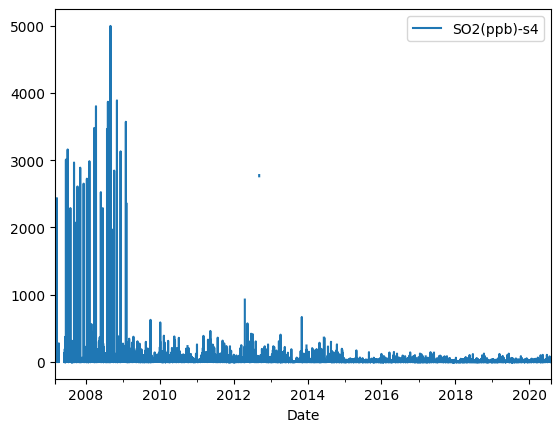

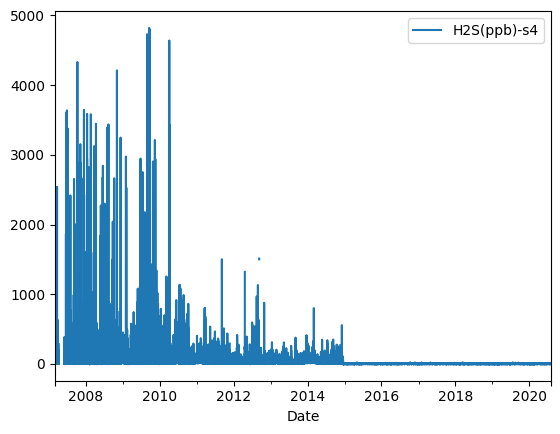

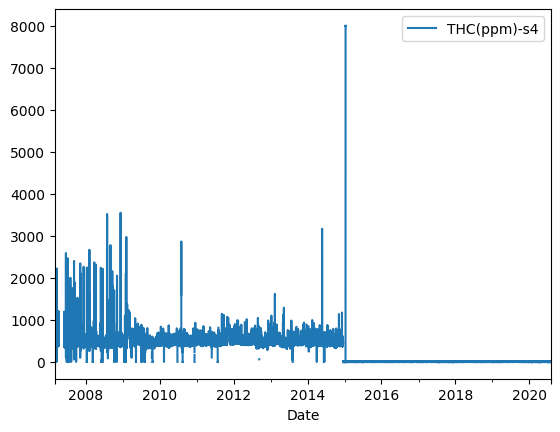

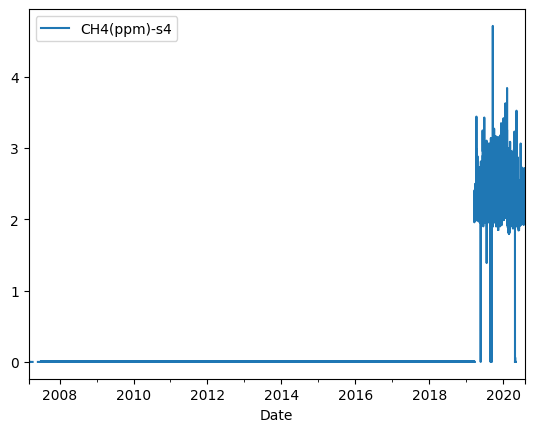

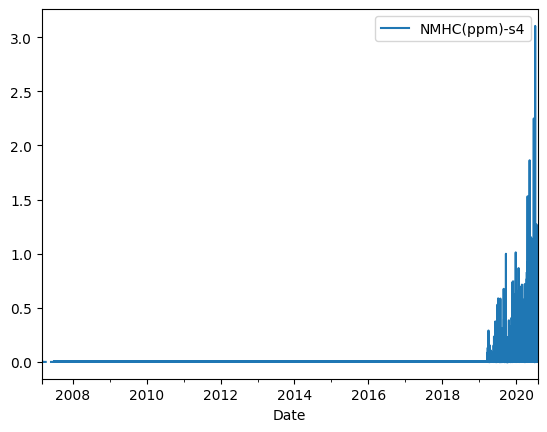

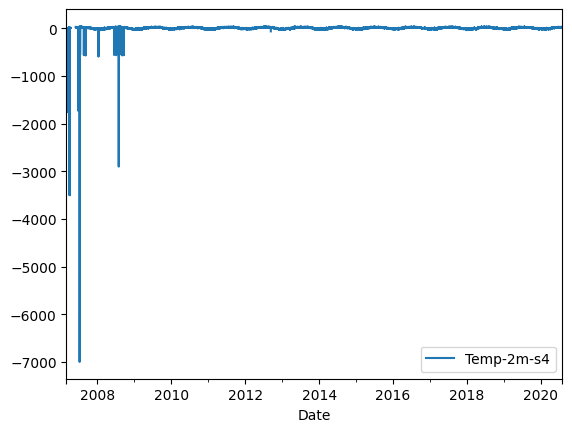

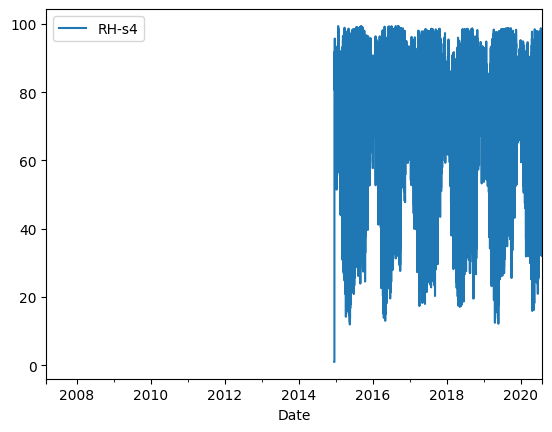

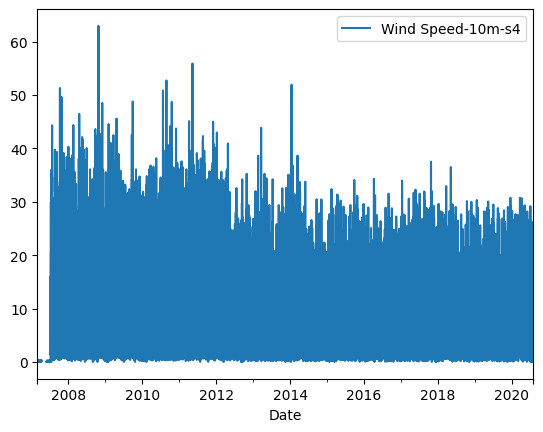

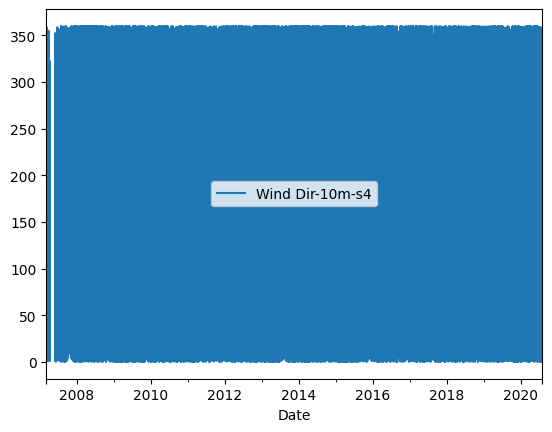

In [ ]:
for i in list(df4.columns):
  plt.figure()
  df4[i].plot(legend = True)

In [ ]:
df4.columns

Index(['SO2(ppb)-s4', 'H2S(ppb)-s4', 'THC(ppm)-s4', 'CH4(ppm)-s4',
       'NMHC(ppm)-s4', 'Temp-2m-s4', 'RH-s4', 'Wind Speed-10m-s4',
       'Wind Dir-10m-s4'],
      dtype='object')

In [ ]:
df1_s_w

,SO2(ppb)-s1,H2S(ppb)-s1,Temp-2m-st1,RH-20m-st1,Wind Speed-45m-st1,Wind Dir-45m-st1,Vertical Wind Speed-20m-st1,Vertical Wind Speed-45m-st1,Vertical Wind Speed-75m-st1,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,,,,
2012-10-01 00:00:00,0.000,10.325,5.052,64.724,14.696,246.236,-0.155,-0.281,-0.437,0,0,275,0.748634
2012-10-01 01:00:00,0.000,12.628,4.848,64.243,13.850,253.369,-0.130,-0.209,-0.437,1,0,275,0.748748
2012-10-01 02:00:00,0.000,139.065,4.960,66.263,9.309,323.738,-0.121,-0.135,0.025,2,0,275,0.748862
2012-10-01 03:00:00,0.000,86.431,4.523,70.661,10.695,239.559,-0.136,-0.045,-0.127,3,0,275,0.748975
2012-10-01 04:00:00,0.000,33.797,3.645,75.116,13.088,180.832,0.048,0.162,-0.095,4,0,275,0.749089
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,6.298,1.145,26.213,33.508,2.513,110.122,-0.020,0.192,0.040,19,4,213,8.581398
2020-07-31 20:00:00,5.352,1.540,23.857,35.895,6.536,53.032,0.370,0.533,0.373,20,4,213,8.581512
2020-07-31 21:00:00,2.725,1.784,22.435,41.615,10.890,53.923,0.341,0.495,0.034,21,4,213,8.581626


In [ ]:
df4[df4['RH-s4'].isna()==False].head(30)

,SO2(ppb)-s4,H2S(ppb)-s4,Temp-2m-s4,RH-s4,Wind Speed-10m-s4,Wind Dir-10m-s4
Date,,,,,,
2012-10-01 00:00:00,0.000,21.696,6.261,64.724,5.122,143.040
2014-12-17 16:00:00,NaN,NaN,NaN,1.000,13.341,155.108
2014-12-17 17:00:00,0.173,0.288,NaN,1.000,13.598,155.215
2014-12-17 18:00:00,0.178,0.369,NaN,1.000,13.564,153.826
2014-12-17 19:00:00,0.145,0.379,NaN,1.000,12.561,150.815
2014-12-17 20:00:00,0.082,0.351,NaN,1.000,10.900,151.387
2014-12-17 21:00:00,0.097,0.287,NaN,1.000,8.953,151.258
2014-12-17 22:00:00,0.116,0.250,NaN,1.000,8.055,153.404
2014-12-17 23:00:00,0.069,0.233,NaN,1.000,7.422,152.853


In [ ]:
df4.drop(columns = ['THC(ppm)-s4', 'CH4(ppm)-s4',
       'NMHC(ppm)-s4'], inplace = True)
df4 = df4.loc['2012-10-01 00:00:00':]

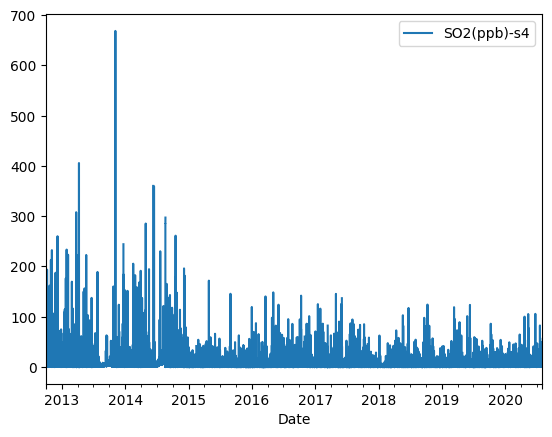

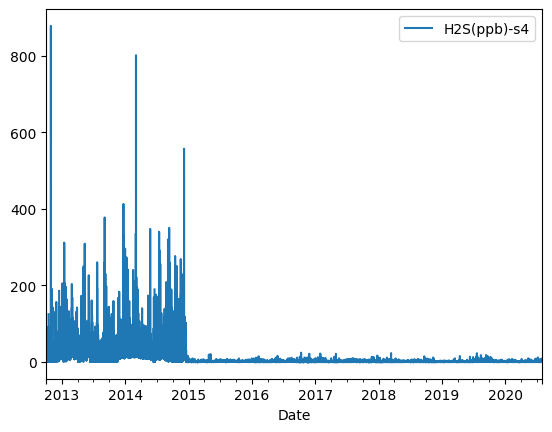

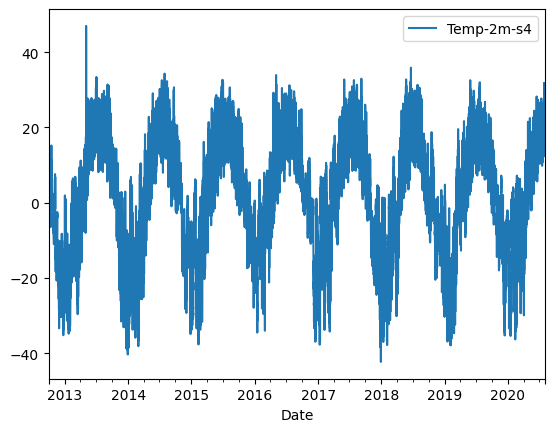

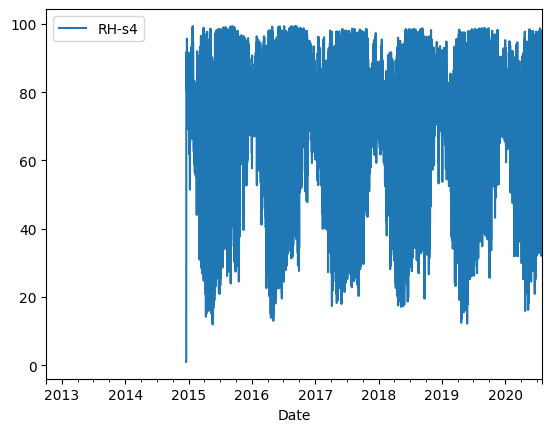

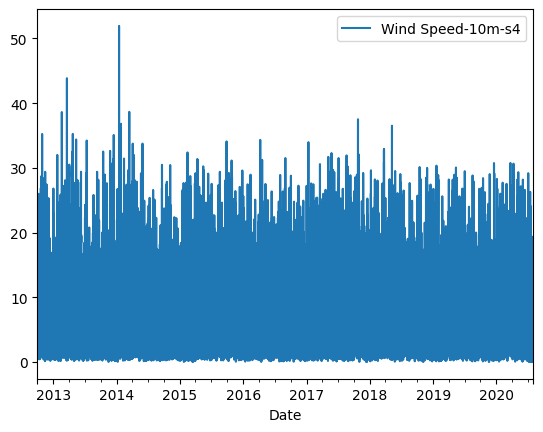

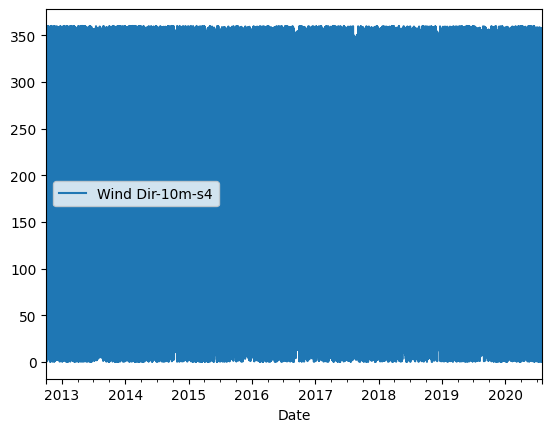

In [ ]:
for i in list(df4.columns):
  plt.figure()
  df4[i].plot(legend = True)

In [ ]:
df4['RH-s4'].loc[:'2014-12-18 12:00:00'] = df1_s_w['RH-20m-st1'].loc[:'2014-12-18 12:00:00']

In [ ]:
df4.columns

Index(['SO2(ppb)-s4', 'H2S(ppb)-s4', 'Temp-2m-s4', 'RH-s4',
       'Wind Speed-10m-s4', 'Wind Dir-10m-s4'],
      dtype='object')

In [ ]:
df4.sort_values(by=['Temp-2m-s4'], ascending=False)

,SO2(ppb)-s4,H2S(ppb)-s4,Temp-2m-s4,RH-s4,Wind Speed-10m-s4,Wind Dir-10m-s4
Date,,,,,,
2018-06-20 15:00:00,0.251,0.0,35.863,19.659,10.664,265.349
2018-06-20 17:00:00,0.329,0.0,35.763,20.058,8.441,277.460
2018-06-20 16:00:00,0.160,0.0,35.675,20.831,11.891,285.971
2018-06-20 18:00:00,0.425,0.0,35.582,20.664,10.892,271.106
2018-06-20 14:00:00,0.315,0.0,35.372,20.469,11.592,276.743
...,...,...,...,...,...,...
2018-03-06 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-06 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-06 15:00:00,NaN,NaN,NaN,NaN,11.412,279.596


In [ ]:
df4['Temp-2m-s4'].loc['2013-05-04 01:00:00'] = 4

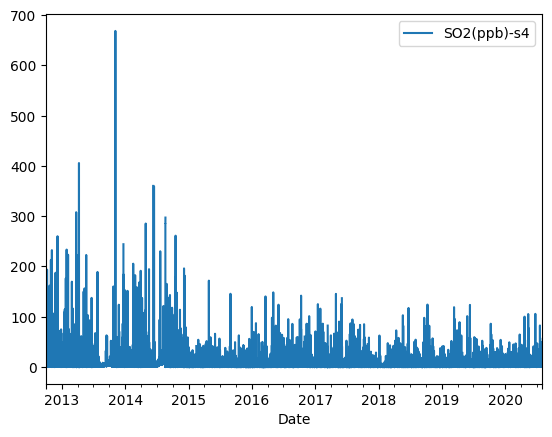

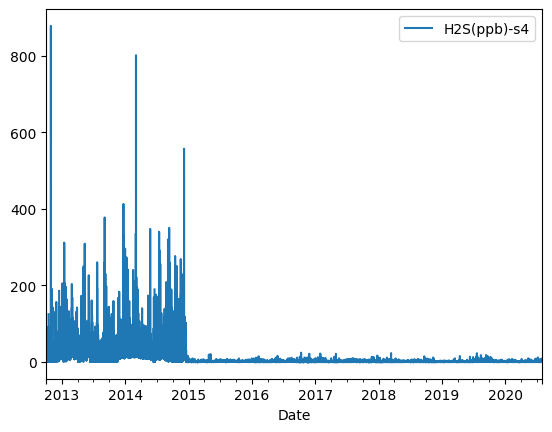

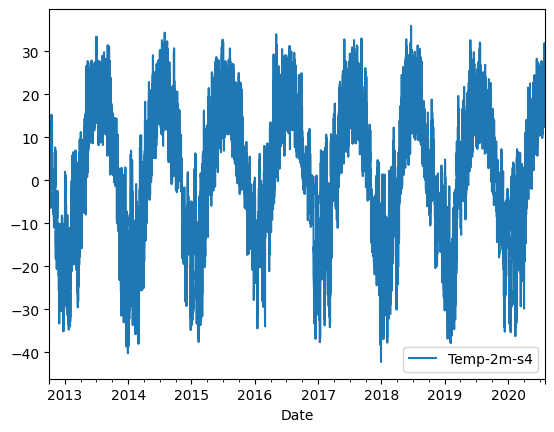

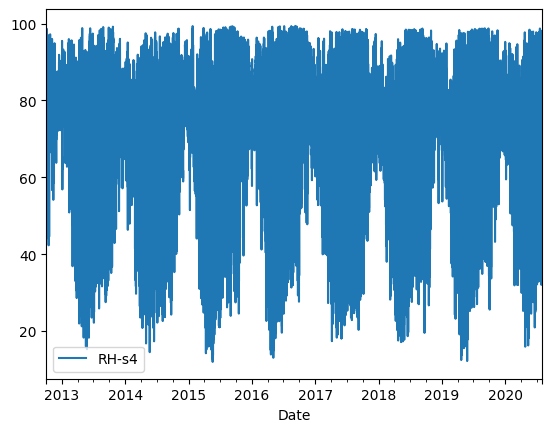

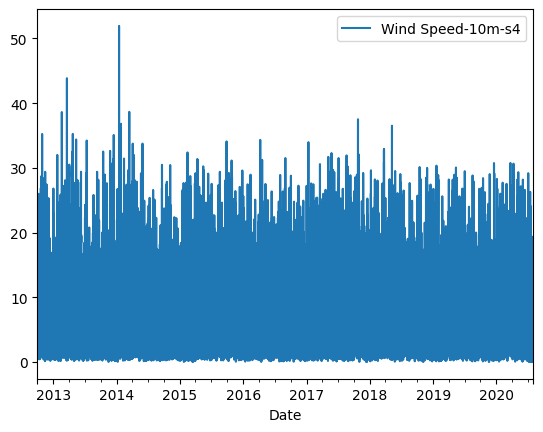

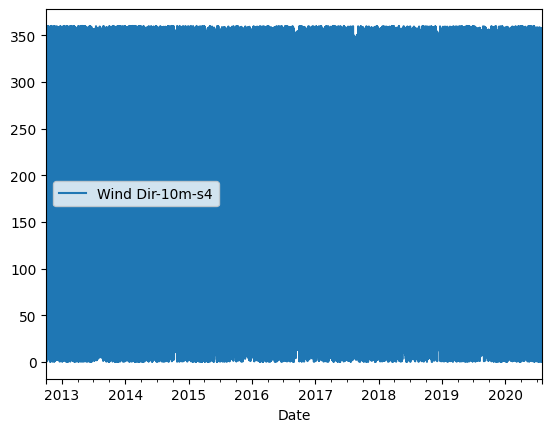

In [ ]:
for i in list(df4.columns):
  plt.figure()
  df4[i].plot(legend = True)

In [ ]:
print(df4.isna().sum())

SO2(ppb)-s4          3366
H2S(ppb)-s4          3479
Temp-2m-s4             81
RH-s4                  24
Wind Speed-10m-s4      59
Wind Dir-10m-s4        59
dtype: int64


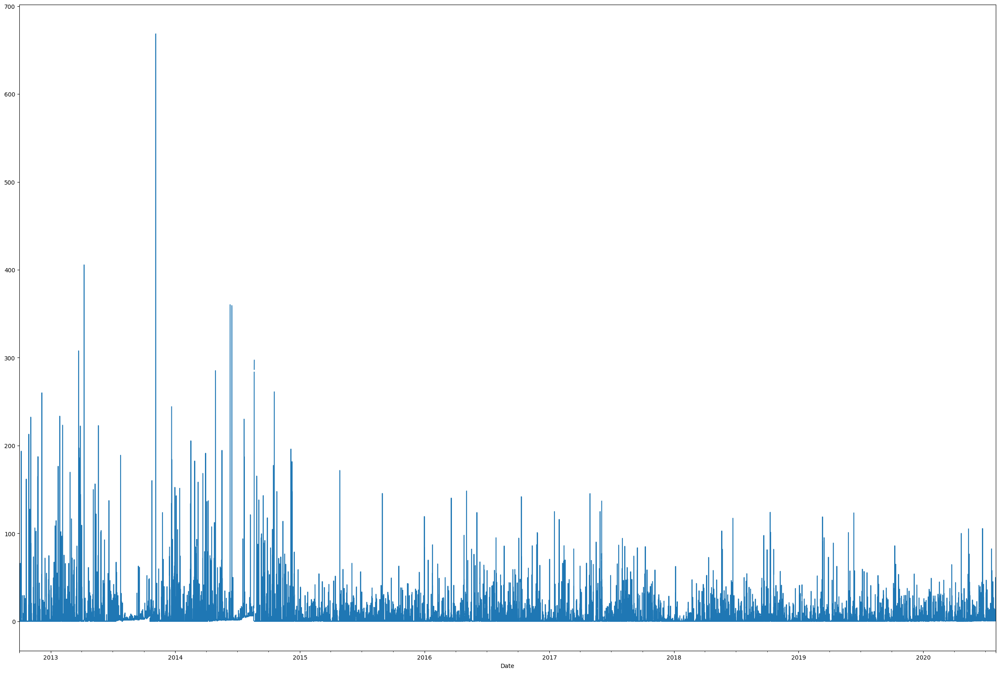

In [ ]:
df4['SO2(ppb)-s4'].plot(figsize = (30,20))

In [ ]:
df4=df4.interpolate(method='time')
print(df4.isna().sum())
len(df4)

SO2(ppb)-s4          0
H2S(ppb)-s4          0
Temp-2m-s4           0
RH-s4                0
Wind Speed-10m-s4    0
Wind Dir-10m-s4      0
dtype: int64


68664

In [ ]:
df4_s = df4
df4_s_w = dater(df4_s)
df4 = df4_s_w

In [ ]:
# for i in df4.columns:
#   print(i)
#   fig = plt.figure()
#   density_scatter(df4[i],df4['SO2(ppb)-s4'])
#   plt.show()

In [ ]:
# for i in list(df4.columns):
#   plt.figure()
#   df4[i].plot(legend = True)

In [ ]:
# df44 = df4.copy()
# df44['Date'] = df44.index
# for i in df44.columns:
#   trend_plot(df44,i)

In [ ]:
df4

,SO2(ppb)-s4,H2S(ppb)-s4,Temp-2m-s4,RH-s4,Wind Speed-10m-s4,Wind Dir-10m-s4,hour,dayofweek_num,Day-year,trend
Date,,,,,,,,,,
2012-10-01 00:00:00,0.000,21.696,6.261,64.724,5.122,143.040,0,0,275,0.748634
2012-10-01 01:00:00,0.000,23.744,5.245,64.243,3.058,112.336,1,0,275,0.748748
2012-10-01 02:00:00,0.000,19.793,4.256,66.263,2.833,116.790,2,0,275,0.748862
2012-10-01 03:00:00,0.000,27.882,4.745,70.661,6.531,134.045,3,0,275,0.748975
2012-10-01 04:00:00,0.000,35.971,5.107,75.116,7.400,136.688,4,0,275,0.749089
...,...,...,...,...,...,...,...,...,...,...
2020-07-31 19:00:00,1.943,0.203,25.243,60.135,0.004,81.300,19,4,213,8.581398
2020-07-31 20:00:00,1.537,0.403,23.482,68.924,0.000,0.000,20,4,213,8.581512
2020-07-31 21:00:00,1.351,0.757,20.468,79.843,0.407,279.101,21,4,213,8.581626


In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Stations_dec/df4_china.csv', 'w') as f:
  df4.to_csv(f)

In [ ]:
print(df1_s_w.index[0])
print(df2_bcov.index[0])
print(df3.index[0])
print(df4.index[0])

2012-10-01 00:00:00


NameError: ignored

Index(['SO2(ppb)-s1', 'H2S(ppb)-s1', 'Temp-2m-st1', 'RH-20m-st1',
       'Wind Speed-45m-st1', 'Wind Dir-45m-st1', 'Vertical Wind Speed-20m-st1',
       'Vertical Wind Speed-45m-st1', 'Vertical Wind Speed-75m-st1', 'hour',
       'dayofweek_num', 'Day-year', 'trend'],
      dtype='object')

In [ ]:
df1_m = df1_s_w.loc['2015-feb':].copy()
df1_m.drop(columns = ['hour','dayofweek_num', 'Day-year', 'trend'], inplace = True)
df2_m = df2_bcov.loc['2015-feb':].copy()
df2_m.drop(columns = ['hour','dayofweek_num', 'Day-year', 'trend'], inplace = True)
df3_m = df3.loc['2015-feb':].copy()
df3_m.drop(columns = ['hour','dayofweek_num', 'Day-year', 'trend'], inplace = True)
df4_m = df4.loc['2015-feb':].copy()

In [ ]:
df_mix = pd.concat([df1_m,df2_m,df3_m,df4_m], axis=1)
df_mix.columns

Index(['SO2(ppb)-s1', 'H2S(ppb)-s1', 'Temp-2m-st1', 'RH-20m-st1',
       'Wind Speed-45m-st1', 'Wind Dir-45m-st1', 'Vertical Wind Speed-20m-st1',
       'Vertical Wind Speed-45m-st1', 'Vertical Wind Speed-75m-st1',
       'SO2(ppb)-s2', 'H2S(ppb)-s2', 'Temp-2m-s2', 'RH-s2',
       'Wind Speed-10m-s2', 'Wind Dir-10m-s2', 'SO2(ppb)-s3', 'H2S(ppb)-s3',
       'Temp-2m-s3', 'RH-s3', 'Wind Speed-10m-s3', 'Wind Dir-10m-s3',
       'SO2(ppb)-s4', 'H2S(ppb)-s4', 'Temp-2m-s4', 'RH-s4',
       'Wind Speed-10m-s4', 'Wind Dir-10m-s4', 'hour', 'dayofweek_num',
       'Day-year', 'trend'],
      dtype='object')

In [ ]:
with open('gdrive/My Drive/Colab Notebooks/Stations_dec/dfmix_china.csv', 'w') as f:
  df_mix.to_csv(f)

In [ ]:
# for i in df_mix.columns:
#   print(i)
#   fig = plt.figure()
#   density_scatter(df_mix[i],df_mix['SO2(ppb)-s1'])
#   plt.show()

In [ ]:
df1.index


In [ ]:
for i in list(df3_cop.columns):
  plt.figure()
  df3_cop[i].plot(legend = True)

In [ ]:
df3_cop.drop(columns = ['NMHC(ppm)-s3','CH4(ppm)-s3'], inplace = True)


In [ ]:
print(df3_cop.isna().sum())
print(df3_cop.index[0])
print(len(df3_cop))

In [ ]:

df3_cop=df3_cop.interpolate(method='time')

In [ ]:
print(df3_cop.isna().sum())
print(df3_cop.index[0])
print(len(df3_cop))

In [ ]:
with open('/gdrive/My Drive/Colab Notebooks/Stations-new/df3.csv', 'w') as f:
  df3_cop.to_csv(f)

In [ ]:
################################################################################################################
################################################################################################################
################################################################################################################
################################################################################################################

In [ ]:
for i in df4.columns:
  df4[i] = pd.to_numeric(df4[i], errors='coerce')

In [ ]:
print(df4.isna().sum())

In [ ]:
for i in list(df4.columns):
  plt.figure()
  df4[i].plot(legend = True)

In [ ]:
df4 = df4.loc['2015':]

In [ ]:
df4.columns
df4.drop(columns =['CH4(ppm)-s4','NMHC(ppm)-s4'], inplace = True)

In [ ]:
df4.columns

In [ ]:
df4['THC(ppm)-s4'].loc['2015-1-1':'2015-2-2'].plot()
df4 = df4[df4['THC(ppm)-s4'] < 1000]

In [ ]:
for i in list(df4.columns):
  plt.figure()
  df4[i].plot(legend = True)

In [ ]:
print(df4.isna().sum())
print(df4.index[0])
print(len(df4))

In [ ]:
df4=df4.interpolate(method='time')
print(df4.isna().sum())
print(df4.index[0])
print(len(df4))

In [ ]:
with open('/gdrive/My Drive/Colab Notebooks/Stations-new/df4.csv', 'w') as f:
  df4.to_csv(f)

In [ ]:
##############################################################################
##############################################################################
##############################################################################

In [ ]:
df4_long = df4.drop(columns = ['RH-s4'])
df4_long = df4_long[pd.notna(df4_long['SO2(ppb)-s4'])]
df4_long = df4_long[pd.notna(df4_long['H2S(ppb)-s4'])]
print(df4_long.isna().sum())
print(df4_long.index[0])
print(len(df4_long))

In [ ]:
df4_long=df4_long.interpolate(method='time')
print(df4_long.isna().sum())
print(df4_long.index[0])
print(len(df4_long))
df4_long = df4_long[pd.notna(df4_long['CH4(ppm)-s4'])]
print(df4_long.isna().sum())
print(df4_long.index[0])
print(len(df4_long))

In [ ]:
df4=df4.interpolate(method='time')
print(df4.isna().sum())
print(df4.index[0])
print(len(df4))

In [ ]:
df4_clean = df4[pd.notna(df4['RH-s4'])]

In [ ]:
df4_clean=df4_clean.interpolate(method='time')
print(df4_clean.isna().sum())
print(df4_clean.index[0])
print(len(df4_clean))

In [ ]:
df4_clean = df4_clean[pd.notna(df4_clean['SO2(ppb)-s4'])]
df4_clean = df4_clean[pd.notna(df4_clean['H2S(ppb)-s4'])]
print(df4_clean.isna().sum())
print(df4_clean.index[0])
print(len(df4_clean))

In [ ]:
df4_clean = df4_clean[pd.notna(df4_clean['CH4(ppm)-s4'])]
print(df4_clean.isna().sum())
print(df4_clean.index[0])
print(len(df4_clean))

In [ ]:
print ('df1-clean :' , len(df1_clean), df1_clean.index[0], list(df1_clean.columns))
print ('df1-long :' , len(df1_long),df1_long.index[0], list(df1_long.columns))
print ('df2 :' , len(df2),df2.index[0], list(df2.columns))
print ('df3-clean :' , len(df3_clean),df3_clean.index[0], list(df3_clean.columns))
print ('df3-long :' ,len(df3_long), df3_long.index[0], list(df3_long.columns))
print ('df4-clean :' ,len(df4_clean), df4_clean.index[0], list(df4_clean.columns))
print ('df4-long :' , len(df4_long),df4_long.index[0], list(df4_long.columns))

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

with open('/gdrive/My Drive/Colab Notebooks/Stations/df1_clean.csv', 'w') as f:
  df1_clean.to_csv(f)

In [ ]:

with open('/gdrive/My Drive/Colab Notebooks/Stations/df1_long.csv', 'w') as f:
  df1_long.to_csv(f)
with open('/gdrive/My Drive/Colab Notebooks/Stations/df2.csv', 'w') as f:
  df2.to_csv(f)
with open('/gdrive/My Drive/Colab Notebooks/Stations/df3_clean.csv', 'w') as f:
  df3_clean.to_csv(f)
with open('/gdrive/My Drive/Colab Notebooks/Stations/df3_long.csv', 'w') as f:
  df3_long.to_csv(f)
with open('/gdrive/My Drive/Colab Notebooks/Stations/df4_clean.csv', 'w') as f:
  df4_clean.to_csv(f)
with open('/gdrive/My Drive/Colab Notebooks/Stations/df4_long.csv', 'w') as f:
  df4_long.to_csv(f)

In [ ]:
import math
#math.isnan(df2['Tem'][10000])
df3 = df2[pd.notna(df2['Tem'])]
#df3

In [ ]:
print('Total num of missing values:') 
print(df3.isna().sum())
print('')

In [ ]:
#df3

In [ ]:
df3['windsin']=np.sin(df3['Winddi']*np.pi/180)
df3['windcos']=np.cos(df3['Winddi']*np.pi/180)
#df3
df3['windsin'] = df3['windsin'] * df3['Winds']
df3['windcos'] = df3['windcos'] * df3['Winds']
df4 = df3.drop(columns=['Winds','Winddi'])
#df4

In [ ]:
#df5 = df4.drop(columns=['H2S','THNaN','NaNH4','NMH'])#here I dropped all the concentration wise features
#df5 = df5.resample('12H').mean()
df5 = df4.copy()
df5.index.freq = 'H'
df5

In [ ]:
holidays = pd.to_datetime(['2014/Jan/01','2014/Feb/17','2014/Apr/18',
                           '2014/Apr/21','2014/May/19','2014/Jul/01',
                           '2014/Aug/04','2014/Sep/01','2014/Oct/13',
                           '2014/Nov/11','2014/Dec/25',
                           '2015/Jan/01','2015/Feb/16','2015/Apr/03',
                           '2015/Apr/06','2015/May/18','2015/Jul/01',
                           '2015/Aug/03','2015/Sep/07','2015/Oct/12',
                           '2015/Nov/11','2015/Dec/25',
                           '2016/Jan/01','2016/Feb/15','2016/Mar/25',
                           '2016/Mar/28','2016/May/23','2016/Jul/01',
                           '2016/Aug/01','2016/Sep/05','2016/Oct/10',
                           '2016/Nov/11','2016/Dec/26',            
                           '2017/Jan/02','2017/Feb/20','2017/Apr/14',
                           '2017/Apr/17','2017/May/22','2017/Jul/01',
                           '2017/Aug/07','2017/Sep/04','2017/Oct/09',
                           '2017/Nov/10','2017/Dec/25', 
                           '2018/Jan/01','2018/Feb/19','2018/Mar/30',
                           '2018/Apr/02','2018/May/21','2018/Jul/02',
                           '2018/Aug/06','2018/Sep/03','2018/Oct/08',
                           '2018/Nov/12','2018/Dec/25',
                           '2019/Jan/01','2019/Feb/18','2019/Apr/19',
                           '2019/Apr/22','2019/May/20','2019/Jul/01',
                           '2019/Sep/02','2019/Oct/14','2019/Nov/11',
                           '2019/Dec/25',
                           '2020/Jan/01','2020/Feb/17','2020/Apr/10',
                           '2020/Apr/13','2020/May/18','2020/Jul/01',
                           '2020/Sep/07','2020/Oct/12','2020/Nov/11',
                           '2020/Dec/25'])
hol=['2014-12-25', '2015-01-01',
               '2015-02-16', '2015-04-03', '2015-04-06', '2015-05-18',
               '2015-07-01', '2015-08-03', '2015-09-07', '2015-10-12',
               '2015-11-11', '2015-12-25', '2016-01-01', '2016-02-15',
               '2016-03-25', '2016-03-28', '2016-05-23', '2016-07-01',
               '2016-08-01', '2016-09-05', '2016-10-10', '2016-11-11',
               '2016-12-26', '2017-01-02', '2017-02-20', '2017-04-14',
               '2017-04-17', '2017-05-22', '2017-07-01', '2017-08-07',
               '2017-09-04', '2017-10-09', '2017-11-10', '2017-12-25',
               '2018-01-01', '2018-02-19', '2018-03-30', '2018-04-02',
               '2018-05-21', '2018-07-02', '2018-08-06', '2018-09-03',
               '2018-10-08', '2018-11-12', '2018-12-25', '2019-01-01',
               '2019-02-18', '2019-04-19', '2019-04-22', '2019-05-20',
               '2019-07-01','2019-09-02', '2019-10-14', '2019-11-11',
               '2019-12-25', '2020-01-01', '2020-02-17', '2020-04-10',
               '2020-04-13', '2020-05-18', '2020-07-01']

In [ ]:
df5['holidays'] =df5['SO2'] - df5['SO2']
for i in hol :
    df5['holidays'].loc[i]=1

In [ ]:
df5[df5['holidays']==1]

In [ ]:
df5['dayofweek_num']=df5.index.weekday  
df5['dayofweek_name']=df5.index.day_name()
df5['weekend']=np.where(df5.index.weekday>4 , 1 , 0)
df5[df5['weekend']==1]

In [ ]:
df5['non_working']=np.where( (df5['weekend'] == 1) | (df5['holidays'] ==1)  , 1 , 0)
df5[df5['non_working']==1]

In [ ]:
df5['year'] = df5.index.year
df5['month'] = df5.index.month
df5['day'] = df5.index.day
df5['hour'] =df5.index.hour
df5['Date'] = df5.index
df5['dayofweek_num']=df5.index.weekday  
df5['dayofweek_name']=df5.index.day_name()
df5['weekend']=np.where(df5.index.weekday>4 , 1 , 0)
df5[df5['weekend']==1]
def season (x):
    if x  in [1,2,12]:
        return "winter"
    elif x in [3,4,5]:
        return "spring"
    elif x in [6,7,8]:
        return "summer"
    elif x in [9,10,11]:
        return "fall"
df5['season'] = df5.Date.dt.month.apply(season)
df5

In [ ]:
a_covid_datefeatures = df5.loc['2020-03-11':,] #for hourly
b_covid_datefeatures = df5.loc[:'2020-03-11',]

b_covid_datefeatures

In [ ]:
#b_covid['SO2'].plot.box(figsize = (10,5))

In [ ]:
#b_covid['SO2'].plot.box(figsize = (12,9), ylim = [0,2.5])

In [ ]:
b_covid_datefeatures.groupby('day')['SO2'].mean().plot(figsize = (10,5))
_ = plt.ylabel('SO2')
_ = plt.ylim([0, max(b_covid_datefeatures.groupby('day')['SO2'].mean())])
_ = plt.xticks(b_covid_datefeatures['day'].unique())
_ = plt.title(' SO2 averaged daily over 6 years (2014-20)')

In [ ]:
b_covid_datefeatures.groupby('month')['SO2'].mean().plot(figsize = (10,5))
_ = plt.ylabel('SO2')
_ = plt.ylim([0, max(b_covid_datefeatures.groupby('month')['SO2'].mean())])
_ = plt.xticks(b_covid_datefeatures['month'].unique())
_ = plt.title(' SO2 averaged montly over 6 years (2014-20)')

In [ ]:
#Plotting average hourly load profile observed over the entire period 
b_covid_datefeatures.groupby('dayofweek_num')['SO2'].mean().plot(figsize = (10,5))
_ = plt.ylabel('SO2')
_ = plt.ylim([0, max(b_covid_datefeatures.groupby('dayofweek_num')['SO2'].mean())+2])
_ = plt.xticks(b_covid_datefeatures['dayofweek_num'].unique())
_ = plt.title(' SO2 averaged weekly over 6 years (2014-20)')

In [ ]:
dfm = b_covid_datefeatures.groupby(['month','year'])['SO2'].mean()
dfm = pd.DataFrame(dfm)

In [ ]:
df1un = dfm.unstack(level = 'month')
df1un.head()

In [ ]:
df1un.reset_index(inplace = True)

In [ ]:
melt = pd.melt(df1un, id_vars='year', value_name='Avg. monthly energy consumption MWH')
melt.head()

In [ ]:
import seaborn as sns

In [ ]:
#Plotting each month as a separate graph using Facetgrid
g = sns.FacetGrid(melt, col="month", margin_titles = True, col_wrap = 4)
g.map(plt.scatter, "year", "Avg. monthly energy consumption MWH");
g.set_axis_labels("Years", "Avg. monthly SO2");
g.set(ylim=(melt['Avg. monthly energy consumption MWH'].min() - 2, melt['Avg. monthly energy consumption MWH'].max() + 2));
_ = plt.subplots_adjust(top=0.9)
_ = g.fig.suptitle('Average monthly SO2 variation over years 2014 to 2020', fontsize = 16 )

In [ ]:
#Using pivot table to create a dataframe having index as hours and columns as weekdays and each cell will contain the average
#energy consumption for that particular hour of the weekday

hour_weekday = b_covid_datefeatures.pivot_table(values='SO2', index='hour', columns = 'dayofweek_name', aggfunc = 'mean')

In [ ]:
#plotting a heatmap with a colorbar; the colorbar shows the energy consumption in MWH
_ = plt.figure(figsize=(12, 8))
ax = sns.heatmap(hour_weekday.sort_index(ascending = False), cmap='viridis')
#_ = plt.title('Average energy consumption in MWH for each hour of each weekday over the entire period')
_ = ax.set_title("Average SO2 for each hour of each weekday averaged over 6 years", fontsize = 14)

In [ ]:
month_hour= b_covid_datefeatures.pivot_table(values='SO2', index='day', columns = 'hour', aggfunc = 'mean')
#plotting a heatmap with a colorbar; the colorbar shows the energy consumption in MWH
_ = plt.figure(figsize=(12, 8))
ax = sns.heatmap(month_hour.sort_index(ascending = False), cmap='viridis')
#_ = plt.title('Average energy consumption in MWH for each hour of each weekday over the entire period')
_ = ax.set_title("Average SO2 for each hour of each weekday averaged over 6 years", fontsize = 14)

In [ ]:
_= plt.figure(figsize = (12,8))
#a = b_covid['SO2'].resample('2H').sum()
_ = sns.distplot(b_covid_datefeatures['SO2'], kde=False)
_ = plt.title('So2 6 years (2014-18) ')
_ = plt.xlabel('SO2')
_ = plt.ylabel('count')
#plt.xlim([20,90])
#plt.ylim([0,1000])

In [ ]:
_ = plt.figure(figsize = (12,8))
_ = sns.boxplot(x = 'dayofweek_name', y = 'SO2', data = b_covid_datefeatures, color='c', hue='non_working')
_ = plt.ylabel('SO2')
#plt.ylim([0,5])

In [ ]:
for year in b_covid_datefeatures['year'].unique():
    b_covid_datefeatures[b_covid_datefeatures['year'] == year]['SO2'].plot(kind='density', figsize = (12,7), legend = True, label = year)
_ = plt.xlabel('SO2')
_ = plt.title('Variation in Distribution of SO2 over 6 years (2014-20)')
plt.xlim([0,10])

In [ ]:
b_covid_datefeatures['SO2'].min()

In [ ]:
import matplotlib.dates as mdates

In [ ]:
# Resampling the SO2 data monthly and calculating the max SO2  for each month
monthly_en = b_covid_datefeatures.resample('M', label = 'left')['SO2'].max()
_ = plt.figure(figsize = (15,6))
#plotting the max monthly SO2 
_ = plt.plot(monthly_en)
# ensuring the limits on x axis to be between the dataframe's datetime limits
_ = plt.xlim(monthly_en.index.min(), monthly_en.index.max())
# Using matplotlib MonthLocator to be used in the xticks to mark individual months
locator = mdates.MonthLocator(bymonthday = 1, interval = 2)  # every 2 months 
fmt = mdates.DateFormatter('%m-%y')  # xticks to be displayed as 01-14 (i.e. Jan'14) and so on
X = plt.gca().xaxis
# Setting the locator
X.set_major_locator(locator)
# Specify formatter
X.set_major_formatter(fmt)
_ = plt.xticks(rotation = 60)
_ = plt.ylabel('Max montly SO2')
_ = plt.xlabel('Date')
#_ = plt.figure(figsize=(15,6))
#_ = SDGE_t_pv['SDGE'].rolling(24*30).max().plot()

In [ ]:
f = plt.figure(figsize = (20,40))
peak_hours = np.arange(0,24) 
for i, hour in enumerate(peak_hours):
    ax = f.add_subplot(12,2,i+1)
    for j, year in enumerate(b_covid_datefeatures['year'].unique()):
        b_covid_datefeatures[(b_covid_datefeatures['year'] == year) & (b_covid_datefeatures['hour'] == hour)]['SO2'].\
                                plot(kind='density',  sharey=False, legend=True, label= year)# ,\
                                #c = color_names[j])
    plt.title('SO2 distribution across the years for hour '+str(hour))
    plt.xlim(0,5)
plt.tight_layout()
#plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=1)


In [ ]:
b_covid_datefeatures['SO2'].mean()

In [ ]:
b_covid_datefeatures['SO2'].max()

In [ ]:
# Creating an empty dict to save all the erros from different models
dict_error = dict()

In [ ]:
# creating function for plotting predicted vs actual energy values
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed SO2 against the predicted SO2
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed SO2")
    _ = plt.ylabel("Predicted SO2")
    _ = plt.title("Observed vs Predicted energy using model {}".format(model_name))
    #plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

In [ ]:
def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error), MAPE (mean absolute % error). 
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

    MAPE = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE)
    
    # Appending the error values along with the model_name to the dict
    if test:
        train_test = 'test'
    else:
        train_test = 'train'
    
    #df = pd.DataFrame({'model': model_name, 'RMSE':RMSE, 'R2':R2, 'MAE':MAE, 'MAPE':MAPE}, index=[0])
    name_error = ['model', 'train_test', 'RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))
    
    for error in list_error:
        if error[0] in dict_error:
            # append the new number to the existing array at this slot
            dict_error[error[0]].append(error[1])
        else:
            # create a new array in this slot
            dict_error[error[0]] = [error[1]]
    #return(dict_error)

In [ ]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [ ]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted SO2 using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [ ]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('SO2', axis = 1).iloc[:test_index]
    y_train = df.SO2.iloc[:test_index]
    X_test = df.drop('SO2', axis = 1).iloc[test_index:]
    y_test = df.SO2.iloc[test_index:]
    
    # StandardScaler fit only on the trainin|g set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

In [ ]:
# Import Drive API and authenticate.
from google.colab import drive

# Mount your Drive to the Colab VM.
drive.mount('/gdrive')


In [ ]:
# Write the DataFrame to CSV file.
with open('/gdrive/My Drive/Colab Notebooks/ap1_datefeature_reg.csv', 'w') as f:
  df5.to_csv(f)

In [ ]:
df6 = df5.copy()
df6.columns

In [ ]:
cat_cols = [['holidays','dayofweek_name', 'weekend', 'non_working', 'month', 'day','hour', 'season']]
for col in cat_cols:
   df6[col] = df6[col].astype('category')

In [ ]:
df6.info()

In [ ]:
df7 = pd.get_dummies(df6,drop_first=False)
df7.head(2)

In [ ]:
df7.drop(columns =['Date','holidays_0.0','weekend_0','non_working_0'], inplace = True)
df7.head(2)

In [ ]:
df7.columns

In [ ]:
with open('/gdrive/My Drive/Colab Notebooks/ap1_datefeature_binary.csv', 'w') as f:
  df7.to_csv(f)

In [ ]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
from matplotlib import rcParams

# Import regression and error metrics modules
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Import plotly modules to view time series in a more interactive way
import plotly.graph_objects as go
import pandas as pd

# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler

# Importing time series split for cross validation 
from sklearn.model_selection import TimeSeriesSplit

plt.style.use('bmh')

# special IPython command to prepare the notebook for matplotlib and other libraries
%matplotlib inline 

#sns.set_style("whitegrid")
#sns.set_context("poster")

In [ ]:
a_covid_reg = df5.loc['2020-03-11':,] #for hourly
b_covid_reg = df5.loc[:'2020-03-11',]

In [ ]:
a_covid_bin = df7.loc['2020-03-11':,] #for hourly
b_covid_bin = df7.loc[:'2020-03-11',]

In [ ]:
##pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth', -1)

In [ ]:
b_covid_reg 